In [1]:
import os
import sys
import pdb
import json
import pickle
import glob
import h5py
import time
import copy
import shutil
import numpy as np
import pandas as pd
import time

%matplotlib inline
import matplotlib.pyplot as plt
import IPython.display as ipd

sys.path.append('/om2/user/msaddler/python-packages/msutil')
import util_figures
import util_stimuli
import util_misc

In [2]:
def prettifyAxes(ax):
    ax.patch.set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)
    plt.tick_params(axis='y',direction='out', right=False)
    plt.tick_params(axis='x',direction='out', top=False)

In [3]:
colors = {'human': 'orange', 
          'kell_data': [el/255. for el in [51,204,255]], # blue
          'add_augs': [el/255. for el in [153,102,255]], # purple
          'no_augs': [el/255. for el in [119,225,119]], # green
          '100_talkers': [el/255. for el in [255,128,255]], # pink
          'no_bgs': [el/255. for el in [251,235,80]], # yellow
          'mod_bgs': 'magenta',
          'extreme_augs_new': 'turquoise',
          'whisper': [el/255. for el in [250, 128, 114]], # salmon
          'no_augs_small': [el/255. for el in [153,102,255]], # purple 'grey',
          'no_augs_test': 'red',
          'no_augs_800_words': 'grey',
          'whisper_tiny': 'magenta',
          'seamless': 'turquoise',
         }

In [4]:
colors = {"human": [el/255. for el in (214, 214, 214)],
          "no_augs": [el/255. for el in (70, 130, 180)], # 0
          "add_augs": [el/255. for el in (255, 182, 182)], # 1
          "extreme_augs_new": [el/255. for el in (255, 99, 71)], # 5
          "kell_data": [el/255. for el in (138, 138, 138)], # 4
          "100_talkers": [el/255. for el in (192, 192, 192)], # 3
          "no_bgs": [el/255. for el in (160, 214, 214)], # 2
          "whisper": [el/255. for el in (122, 74, 145)], # 7
          "whisper_tiny": [el/255. for el in (191, 161, 211)], # 11
          "seamless": [el/255. for el in (102, 205, 170)], # 12
          "extreme_augs_minimal"
         }

In [3]:
colors = {"human": [el/255. for el in (138, 138, 138)],
          "no_augs_800_words": [el/255. for el in (70, 130, 180)], # 0
          "add_augs_800_words": [el/255. for el in (255, 140, 0)], # 1
          "extreme_augs_800_words": [el/255. for el in (144, 0, 0)],#(255, 99, 71)], # 5
          "kell_data": [el/255. for el in (255, 182, 182)], #(138, 138, 138)], # 4
          "100_talkers_800_words": [el/255. for el in (255, 105, 180)], #(0, 191, 255)], #(192, 192, 192)], # 3
          "no_bgs_800_words": [el/255. for el in (60, 179, 113)], #(160, 214, 214)], # 2
          "whisper": [el/255. for el in (122, 74, 145)], # 7
          "no_augs_small": [el/255. for el in (217, 1, 102)], # 8
          "whisper_tiny": [el/255. for el in (191, 161, 211)], # 11
          "seamless": [el/255. for el in (102, 205, 170)], # 12
          "extreme_augs_minimal_800_words": [el/255. for el in (255, 69, 0)], #13
         }

In [4]:
conditions = ['clean', 'compressed_dilated', 'cognitive_restoration', 'whispered', 'inharmonic', 'sine_wave_speech',
              'mod_lowpass-tempmod', 'mod_lowpass-specmod', 'shuffled', 'repackaged', 'noise_vocoded',
              'highpass', 'bandpass', 'lowpass', 
              'silenced-0.25', 'silenced-0.5', 'silenced-0.75', 
              'masked-1', 'masked-3', 'masked-10', 'masked-30', 'masked-100', 'clipped-peak', 'clipped-center', 
              'chimera-fs', 'chimera-envelope', 'chimera_noise-fs', 'synth_reverb-20', 'synth_reverb-50',
              'synth_reverb_babble_0dB-20', 'synth_reverb_babble_0dB-50', 'audscene', 'babble', 'music',
              'stat_noise', 'mod_noise', '43_textures',
              'tone_vocoded-stat_0', 'tone_vocoded-stat_8', 'tone_vocoded-stat_16', 'tone_vocoded-stat_24', 'tone_vocoded-stat_32',
              'tone_vocoded-mod_0', 'tone_vocoded-mod_8', 'tone_vocoded-mod_16', 'tone_vocoded-mod_24', 'tone_vocoded-mod_32',
             ]
dir_dst = '/om2/user/amagaro/word_recognition_project/full_results_230/'
bg_conditions = {'audscene': 'Auditory scenes', 'babble': '8-speaker babble', 'music': 'Music', 
                 'speech-stat': 'Stationary noise', 'speech-mod': 'Modulated noise'}
asr_models = ['whisper', 'whisper_tiny', 'seamless']
archs = ['no_augs_800_words', 'add_augs_800_words', 'no_bgs_800_words', '100_talkers_800_words', 'kell_data', 'extreme_augs_800_words', 'mod_bgs', 'whisper', 'no_augs_small_800_words', 'no_augs_test', 'no_augs_800_words', 'whisper_tiny', 'seamless', 'extreme_augs_minimal_800_words'] #CHANGE BACK
names = ['Standard model', 'Natural augmentations', 'No backgrounds', '100 talkers', 'Kell data', 
         'Augmented', 'Modulated backgrounds', 'Whisper', 'Small standard model', 'Early standard model', '800 words standard model', 'Whisper tiny', 'Seamless', 'Unnatural augmentations (minimal)'] #CHANGE BACK

In [5]:
experimental_conditions = {
    "audio_filtering": {
        "lowpass": [400, 800, 1600, 3200, "unfiltered"],
        "highpass": ["unfiltered", 400, 800, 1600, 3200, 6400],
        "bandpass": [5, 10, 20, 30, 40, "unfiltered"],
    }, 
    "spectemp_mod": {
        "mod_lowpass-specmod": [0.5, 1, 2, 4, 8, "unfiltered"],
        "mod_lowpass-tempmod": [3, 6, 12, 24, "unfiltered"],
    },
    "repackaged_silenced": {
        "repackaged": [0, 10, 20, 40, 80, 160], #
        **{f"silenced-{x}": [10, 30, 100, 300, 1000] for x in [0.25, 0.5, 0.75]}, 
    },
    "masked": {
        **{f"masked-{x}": [10, 30, 100, 300, 1000] for x in [-18, -9, 0, 9]},
    },
    "chimera": { 
        "chimera-envelope": [1, 2, 4, 8, 16], 
        "chimera-fs": [1, 2, 4, 8, 16],
        "chimera_noise-fs": [1, 2, 4, 8, 16],
    },
    "shuffled_clipped": {
        "shuffled": [0.125, 0.25, 0.5, 1, 2, 4],
        "clipped-peak": [0, 0.25, 0.5, 0.75, 0.9, 0.98], 
        "clipped-center": [0, 0.25, 0.5, 0.75, 0.9, 0.98], 
    },
    "swin": {
        "sine_wave_speech": [4],
        "whispered": [1],
        "inharmonic": [0, 10, 30, 50], 
        "noise_vocoded": [1, 2, 4, 8, 16, 32],
    },
    "reverb": {
        "synth_reverb-20": [200, 400, 800, 1600], ## FILL OUT ##
        "synth_reverb-50": [200, 400, 800, 1600],
        "synth_reverb_babble_0dB-20": [200, 400, 800, 1600],
        "synth_reverb_babble_0dB-50": [200, 400, 800, 1600],
    },
    "compressed_dilated": {
        "compressed_dilated": [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2],
    },
    "local_time_reversal": {
        "cognitive_restoration": [10, 20, 30, 40, 50, 100, 150, 200],
    },
    "backgrounds": {
        "audscene": [-9, -6, -3, 0, 3, "inf"],
        "babble": [-9, -6, -3, 0, 3, "inf"],
        "music": [-9, -6, -3, 0, 3, "inf"],
        "stat_noise": [-9, -6, -3, 0, 3, "inf"],
        "mod_noise": [-9, -6, -3, 0, 3, "inf"],
    },
    "43_textures": {
        "43_textures": [x for x in range(43)],
    },
    "tone_vocoded": {
        "stat_benefits": [0, 8, 16, 24, 32],
        "mod_benefits": [0, 8, 16, 24, 32],
    }
}

In [6]:
# colors = [0, 1, 2, 3, 4, 5, 6, 6, 6, 7, 7, 7, 8, 9, 9, 10, 11, 12, 13, 14, 14, 15, 15, 16, 17, 18, 19, 20, 21, 22]
# # similar colors:
# # 0, 1, 2 (audio filtering)
# # 3, 4 (modulation filtering)
# # 5 (repackaged)
# # 6 (silencing)
# np.random.seed(1)
# color_mapper = {i: [el/255. for el in [np.random.randint(0, 256),
#                                        np.random.randint(0, 256),
#                                        np.random.randint(0, 256)]] for i in range(23)}
model_inds = [0, 2, 3, 1, 5, 7, 11, 12]
exps = ['audio_filtering', 'spectemp_mod', 'repackaged_silenced', 'masked', 'chimera', 'shuffled_clipped',
        'swin', 'reverb', 'compressed_dilated', 'local_time_reversal', 'backgrounds', '43_textures', 'tone_vocoded']
full_colors = []
full_exps = []
# i = 0
# for exp in exps:
#     exp_conditions = experimental_conditions[exp]
#     for cond in exp_conditions:
#         color = color_mapper[colors[i]]
#         for j in range(len(exp_conditions[cond])):
#             full_colors.append(color)
#         i += 1

In [20]:
len(full_colors)

0

In [28]:
np.load(dir_dst + '/43_textures/human.npy')

array([[0.6       , 0.4       , 0.42857143, ..., 1.        , 0.33333333,
        0.        ],
       [0.        , 0.8       , 1.        , ..., 0.375     , 0.55555556,
        0.28571429],
       [0.66666667, 0.22222222, 0.66666667, ..., 0.5       , 0.5       ,
        0.        ],
       ...,
       [0.8       , 1.        , 0.77777778, ..., 1.        , 1.        ,
        0.75      ],
       [0.8       , 1.        , 0.5       , ..., 0.66666667, 0.85714286,
        0.8       ],
       [0.8       , 0.83333333, 0.5       , ..., 1.        , 1.        ,
        0.75      ]])

In [7]:
corr_archs = []
for exp in exps:
    exp_conditions = experimental_conditions[exp]
    for cond in exp_conditions:
        print(cond)
        for ind in model_inds:
            arch = archs[ind]
            if arch not in corr_archs:
                corr_archs.append(arch)
            mean = np.mean(np.load(f'{dir_dst}/{cond}/{arch}.npy'), axis=1)
            print('   ' + arch, mean)
        print('\n')

lowpass
   no_augs_800_words [0.02328131 0.28708658 0.49368265 0.7181531  0.89401709]
   no_bgs_800_words [0.00923449 0.15189521 0.37480491 0.74028242 0.90035303]
   100_talkers_800_words [0.01332219 0.14085842 0.27616128 0.54507618 0.84453735]
   add_augs_800_words [0.02010405 0.25182088 0.47560386 0.71085098 0.87558528]
   extreme_augs_800_words [0.02073579 0.22885544 0.46969528 0.71313638 0.87441472]
   whisper [0.07173913 0.75518395 0.95501672 0.98762542 0.98879599]
   whisper_tiny [1.67224080e-04 9.01337793e-02 5.36287625e-01 9.27926421e-01
 9.55183946e-01]
   seamless [0.01705686 0.30568562 0.73779264 0.90886288 0.94113712]


highpass
   no_augs_800_words [0.89401709 0.70605723 0.42380156 0.21497585 0.0362133  0.00611297]
   no_bgs_800_words [0.90035303 0.72686734 0.41750279 0.09702713 0.00810108 0.00111483]
   100_talkers_800_words [0.84453735 0.56151988 0.18547009 0.07647715 0.01553326 0.00434783]
   add_augs_800_words [0.87558528 0.72108881 0.3482906  0.14188034 0.03740245 0.0

   whisper [0.98862876 0.98846154 0.98494983 0.92809365 0.41822742 0.00317726]
   whisper_tiny [9.55518395e-01 9.52508361e-01 9.29264214e-01 6.41806020e-01
 6.43812709e-02 3.34448161e-04]
   seamless [0.94113712 0.94882943 0.95802676 0.85953177 0.16839465 0.00719064]


sine_wave_speech
   no_augs_800_words [0.32292828]
   no_bgs_800_words [0.51207729]
   100_talkers_800_words [0.20287997]
   add_augs_800_words [0.27211074]
   extreme_augs_800_words [0.28429952]
   whisper [0.8173913]
   whisper_tiny [0.14013378]
   seamless [0.4326087]


whispered
   no_augs_800_words [0.70250836]
   no_bgs_800_words [0.78188406]
   100_talkers_800_words [0.53474545]
   add_augs_800_words [0.69537347]
   extreme_augs_800_words [0.7481977]
   whisper [0.97444634]
   whisper_tiny [0.88867776]
   seamless [0.92078365]


inharmonic
   no_augs_800_words [0.89401709 0.88350056 0.88225567 0.88290598]
   no_bgs_800_words [0.90035303 0.88989223 0.88905611 0.88870308]
   100_talkers_800_words [0.84453735 0.82956

In [8]:
means = {}
for exp in exps:
    for small_exp in experimental_conditions[exp]:
        means[small_exp] = {}
        exp_conditions = experimental_conditions[exp][small_exp]
        for arch in corr_archs + ['human']:
            means[small_exp][arch] = []
            total = np.load(f'{dir_dst}/{small_exp}/{arch}.npy')
            if arch == 'human':
                mean = [np.nanmean([j for j in i]) for i in total]
            else:
                mean = [[j for j in i] for i in total]

            means[small_exp][arch].extend(mean)
means
total_means = {}
for arch in corr_archs + ['human']:
    total_means[arch] = []
    for exp in exps:
        for small_exp in experimental_conditions[exp]:
            total_means[arch].extend(means[small_exp][arch])
total_means

{'no_augs_800_words': [[0.021237458193979934,
   0.02508361204013378,
   0.01789297658862876,
   0.02140468227424749,
   0.022909698996655518,
   0.018729096989966554,
   0.028762541806020066,
   0.02190635451505017,
   0.03160535117056856],
  [0.2697324414715719,
   0.30886287625418063,
   0.2802675585284281,
   0.2677257525083612,
   0.290133779264214,
   0.25016722408026754,
   0.311371237458194,
   0.28160535117056856,
   0.3239130434782609],
  [0.48779264214046825,
   0.5088628762541806,
   0.4897993311036789,
   0.4782608695652174,
   0.5040133779264214,
   0.45852842809364547,
   0.5033444816053512,
   0.4807692307692308,
   0.5317725752508361],
  [0.7210702341137124,
   0.7180602006688963,
   0.7163879598662207,
   0.7138795986622074,
   0.7295986622073578,
   0.7043478260869566,
   0.7269230769230769,
   0.7096989966555184,
   0.7234113712374582],
  [0.9011705685618729,
   0.8949832775919733,
   0.8963210702341137,
   0.8887959866220736,
   0.8979933110367893,
   0.89013377926

In [9]:
means['swi'] = means['sine_wave_speech']
for arch in means['swi']:
    means['swi'][arch].extend(means['whispered'][arch])
    means['swi'][arch].extend(means['inharmonic'][arch])

In [22]:
means['swi']

{'no_augs_800_words': [[0.32792642140468226,
   0.3468227424749164,
   0.3759197324414716,
   0.3096989966555184,
   0.29816053511705687,
   0.305685618729097,
   0.3245819397993311,
   0.29130434782608694,
   0.32625418060200667],
  [0.7334448160535118,
   0.7214046822742475,
   0.6887959866220735,
   0.7018394648829431,
   0.687123745819398,
   0.6816053511705685,
   0.7038461538461539,
   0.7001672240802675,
   0.7043478260869566],
  [0.9011705685618729,
   0.8949832775919733,
   0.8963210702341137,
   0.8887959866220736,
   0.8979933110367893,
   0.890133779264214,
   0.8889632107023412,
   0.8913043478260869,
   0.8964882943143813],
  [0.8847826086956522,
   0.879933110367893,
   0.8839464882943144,
   0.8846153846153846,
   0.88561872909699,
   0.8804347826086957,
   0.8837792642140468,
   0.879933110367893,
   0.8884615384615384],
  [0.8834448160535117,
   0.8795986622073578,
   0.8836120401337793,
   0.882943143812709,
   0.8811036789297659,
   0.8794314381270903,
   0.88060200

In [10]:
len(total_means['human'])

228

In [81]:
len(total_means['seamless'])

218

In [10]:
def rmse(y_true, y_pred): return np.sqrt(np.mean((np.array(y_true) - np.array(y_pred))**2))

In [11]:
rmses = {}
for exp in exps:
    for small_exp in experimental_conditions[exp] | {'swi': [1, 1, 0, 10, 30, 50]}:
        if small_exp in ['sine_wave_speech', 'whispered', 'inharmonic']:
            continue
        rmses[small_exp] = {}
#         exp_conditions = experimental_conditions[exp]
        for arch in corr_archs:
            rmses[small_exp][arch] = [rmse([i[j] for i in means[small_exp][arch]], 
                                            means[small_exp]['human']) for j in range(len(means[small_exp][arch][0]))]
rmses

{'lowpass': {'no_augs_800_words': [0.08427450256025877,
   0.07492790239422742,
   0.08288847025042274,
   0.08739412131208699,
   0.07446775394198477,
   0.09846298269150958,
   0.07242616709629224,
   0.0865163535047878,
   0.06811520322729016],
  'no_bgs_800_words': [0.13785108460081444,
   0.13244935639318228,
   0.14176648119879773,
   0.13961000843658758,
   0.136306917559287,
   0.14595349883354045,
   0.1419767464357918,
   0.1468951282746901,
   0.13085878665585654],
  '100_talkers_800_words': [0.21283911609241526,
   0.21662115774584492,
   0.21039467268783266,
   0.21808266916595637,
   0.22421134280387098,
   0.22709459625223513,
   0.20340885699681632,
   0.21457723313317328,
   0.1963557894866534],
  'add_augs_800_words': [0.09665648210687304,
   0.0871029431539817,
   0.08833616548830299,
   0.09335145604324954,
   0.08294636533008168,
   0.09474945855843239,
   0.089798964101363,
   0.09693565652086228,
   0.08271437584926153],
  'extreme_augs_800_words': [0.10031963386

In [12]:
avg_rmse_by_exp = {}
for small_exp in rmses:
    avg_rmse_by_exp[small_exp] = {}
    for arch in corr_archs:
        avg_rmse_by_exp[small_exp][arch] = np.mean(rmses[small_exp][arch])
avg_rmse_by_exp

{'lowpass': {'no_augs_800_words': 0.08105260633098449,
  'no_bgs_800_words': 0.13929644537650535,
  '100_talkers_800_words': 0.21373171492942206,
  'add_augs_800_words': 0.09028798523915647,
  'extreme_augs_800_words': 0.09568116458592947,
  'whisper': 0.26714408375090043,
  'whisper_tiny': 0.12991628034239064,
  'seamless': 0.08564685547229502},
 'highpass': {'no_augs_800_words': 0.21663029536748504,
  'no_bgs_800_words': 0.2532669654937696,
  '100_talkers_800_words': 0.3374318507336663,
  'add_augs_800_words': 0.2561090109605186,
  'extreme_augs_800_words': 0.08493682076620111,
  'whisper': 0.1710615560475076,
  'whisper_tiny': 0.14180365232760225,
  'seamless': 0.19873055785990573},
 'bandpass': {'no_augs_800_words': 0.3486938803739389,
  'no_bgs_800_words': 0.34671513522953873,
  '100_talkers_800_words': 0.45713544674809964,
  'add_augs_800_words': 0.3481023202597359,
  'extreme_augs_800_words': 0.14066320510915617,
  'whisper': 0.151384262536366,
  'whisper_tiny': 0.26458828914872

In [13]:
reversed_rmses = {arch: [avg_rmse_by_exp[small_exp][arch] for small_exp in rmses if 'benefits' not in small_exp] for arch in corr_archs}
reversed_rmses

{'no_augs_800_words': [0.08105260633098449,
  0.21663029536748504,
  0.3486938803739389,
  0.06750003748190388,
  0.04917646091977407,
  0.03823199478096159,
  0.359599145748741,
  0.036711951904394906,
  0.31434148442994064,
  0.331016872652502,
  0.06255813441267588,
  0.11056639832064824,
  0.07577076552154172,
  0.03979224372288146,
  0.05790979338795751,
  0.030121377321446215,
  0.08294849843598143,
  0.12111708145137569,
  0.10114641598888881,
  0.09763642804402069,
  0.04294987669018697,
  0.1865614816869192,
  0.021684161058727038,
  0.06594584743091114,
  0.05488245330771675,
  0.15497048965720386,
  0.08417228004495815,
  0.09701397814286127,
  0.1401467381809994,
  0.09269873603488962,
  0.04943947562446774,
  0.0552415921042173,
  0.13393684579334522],
 'no_bgs_800_words': [0.13929644537650535,
  0.2532669654937696,
  0.34671513522953873,
  0.08834587149120267,
  0.058828179990583,
  0.04026259873367101,
  0.32005876510126025,
  0.105809487325261,
  0.3266776814212506,
  0

In [14]:
corrs = {}
for exp in exps:
    for small_exp in experimental_conditions[exp] | {'swi': [1, 1, 0, 10, 30, 50]}:
        if small_exp in ['sine_wave_speech', 'whispered', 'inharmonic']:
            continue
        corrs[small_exp] = {}
#         exp_conditions = experimental_conditions[exp]
        for arch in corr_archs:
            corrs[small_exp][arch] = [np.corrcoef([i[j] for i in means[small_exp][arch]], 
                                            means[small_exp]['human'])[1, 0] for j in range(len(means[small_exp][arch][0]))]
corrs

{'lowpass': {'no_augs_800_words': [0.9734996693605878,
   0.9769011469503408,
   0.9746188047344893,
   0.973550741973843,
   0.9779103451440946,
   0.9684008024282151,
   0.9786825817976383,
   0.9728590286051411,
   0.9792511968299955],
  'no_bgs_800_words': [0.9482151316428739,
   0.9519315325129046,
   0.9450384076159104,
   0.9477588057376056,
   0.948766953627067,
   0.9444205704116203,
   0.9460835315672842,
   0.9453313772189942,
   0.9527186312794699],
  '100_talkers_800_words': [0.8976608838411334,
   0.8898145372894113,
   0.898922773089569,
   0.8887284562046641,
   0.8833748028173994,
   0.8834072882365072,
   0.9026827359528848,
   0.8930075975235451,
   0.9065809384170935],
  'add_augs_800_words': [0.9720836940094719,
   0.9782639519779739,
   0.9756488775426122,
   0.9724123235357244,
   0.9776082800204638,
   0.9724821003300641,
   0.9750420863772171,
   0.971251965347904,
   0.9784318254925879],
  'extreme_augs_800_words': [0.9716802754432949,
   0.9738408682145174,
 

In [15]:
avg_corr_by_exp = {}
for small_exp in corrs:
    avg_corr_by_exp[small_exp] = {}
    for arch in corr_archs:
        avg_corr_by_exp[small_exp][arch] = np.mean(corrs[small_exp][arch])
avg_corr_by_exp

{'lowpass': {'no_augs_800_words': 0.9750749242027053,
  'no_bgs_800_words': 0.9478072157348589,
  '100_talkers_800_words': 0.8937977792635787,
  'add_augs_800_words': 0.9748027894037801,
  'extreme_augs_800_words': 0.9729404311247554,
  'whisper': 0.919414186837912,
  'whisper_tiny': 0.9642685731730869,
  'seamless': 0.9922156786405961},
 'highpass': {'no_augs_800_words': 0.880716063954422,
  'no_bgs_800_words': 0.8457284964681828,
  '100_talkers_800_words': 0.7408938150817526,
  'add_augs_800_words': 0.834665202305895,
  'extreme_augs_800_words': 0.9777259358719415,
  'whisper': 0.9868667078965544,
  'whisper_tiny': 0.947818411883254,
  'seamless': 0.8509534032360142},
 'bandpass': {'no_augs_800_words': 0.7298378939096479,
  'no_bgs_800_words': 0.7326138999004811,
  '100_talkers_800_words': 0.5649677236820135,
  'add_augs_800_words': 0.7308963239464622,
  'extreme_augs_800_words': 0.949346574389059,
  'whisper': 0.9915840461737492,
  'whisper_tiny': 0.8266148416382864,
  'seamless': 0

In [16]:
reversed_corrs = {arch: [avg_corr_by_exp[small_exp][arch] for small_exp in corrs] for arch in corr_archs}
reversed_corrs

{'no_augs_800_words': [0.9750749242027053,
  0.880716063954422,
  0.7298378939096479,
  0.9592926682646171,
  0.9948116965480858,
  0.995643103024009,
  0.7532254493079082,
  0.5089356316144321,
  0.03466832741942086,
  -0.37134118882843037,
  0.9795458088615069,
  0.9646172283857912,
  0.8302549065490097,
  0.9500746223550546,
  0.9916911162143796,
  0.9884904632923308,
  0.9598579414973325,
  0.9640467595203683,
  0.9094187840981021,
  0.9728288478584104,
  0.9992157446126093,
  0.9867015220253756,
  0.9375372190937278,
  0.9976581293647298,
  0.818169852122703,
  0.7731395220220312,
  0.9782659236904279,
  0.9739838980041358,
  0.9457500821074842,
  0.9679933961114882,
  0.9859120647969097,
  0.9731801442196413,
  0.9378948851962576,
  0.5681151762167671,
  0.9324238450487494],
 'no_bgs_800_words': [0.9478072157348589,
  0.8457284964681828,
  0.7326138999004811,
  0.9678528395842922,
  0.9930815429155992,
  0.9939114739183127,
  0.7639490063556916,
  0.8420001636677941,
  0.82503547

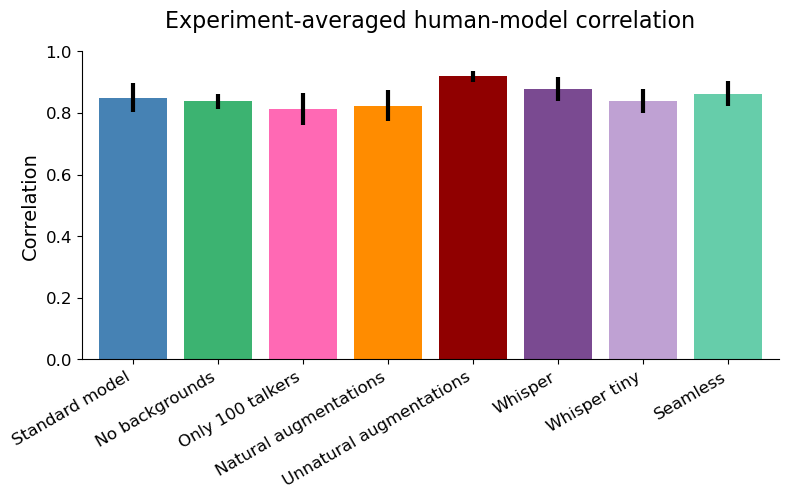

In [18]:
bwidth = 0.8

plt.figure(figsize=(len(model_inds) + 1, 4))
plt.bar(np.array([i for i in range(len(model_inds))])-bwidth/2., [np.nanmean(reversed_corrs[arch]) for arch in corr_archs], 
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(reversed_corrs[arch])/np.sqrt((~np.isnan(reversed_corrs[arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,len(model_inds) - .8)
plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=12)
prettifyAxes(plt.gca())
plt.ylabel('Correlation',  fontsize=14)
plt.xticks([-0.4] + [0.6 + i for i in range(len(model_inds) - 1)], [names[ind] for ind in model_inds], rotation=30, ha='right', fontsize=12)
plt.title('Experiment-averaged human-model correlation', {'fontsize': 16}, y=1.05)
plt.show()

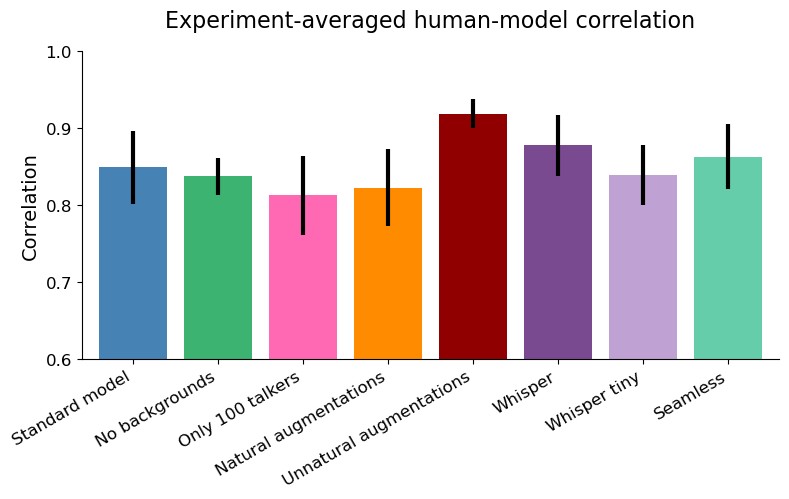

In [25]:
bwidth = 0.8

plt.figure(figsize=(len(model_inds) + 1, 4))
plt.bar(np.array([i for i in range(len(model_inds))])-bwidth/2., [np.nanmean(reversed_corrs[arch]) for arch in corr_archs], 
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(reversed_corrs[arch])/np.sqrt((~np.isnan(reversed_corrs[arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0.6,1) 
plt.xlim(-1,len(model_inds) - .8)
plt.yticks([0.6, 0.7, 0.8, 0.9, 1.0], fontsize=12)
prettifyAxes(plt.gca())
plt.ylabel('Correlation',  fontsize=14)
plt.xticks([-0.4] + [0.6 + i for i in range(len(model_inds) - 1)], [names[ind] for ind in model_inds], rotation=30, ha='right', fontsize=12)
plt.title('Experiment-averaged human-model correlation', {'fontsize': 16}, y=1.05)
plt.show()

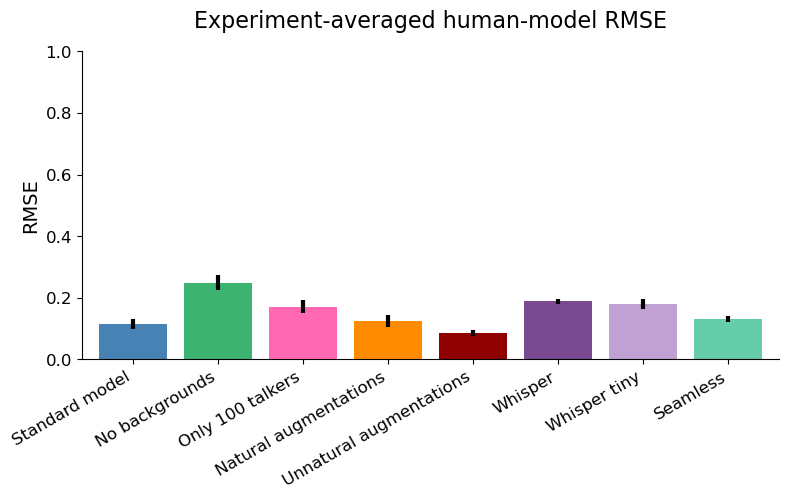

In [22]:
bwidth = 0.8

plt.figure(figsize=(len(model_inds) + 1, 4))
plt.bar(np.array([i for i in range(len(model_inds))])-bwidth/2., [np.nanmean(reversed_rmses[arch]) for arch in corr_archs], 
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(reversed_rmses[arch])/np.sqrt((~np.isnan(reversed_rmses[arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,len(model_inds) - .8)
plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=12)
prettifyAxes(plt.gca())
plt.ylabel('RMSE',  fontsize=14)
plt.xticks([-0.4] + [0.6 + i for i in range(len(model_inds) - 1)], [names[ind] for ind in model_inds], rotation=30, ha='right', fontsize=12)
plt.title('Experiment-averaged human-model RMSE', {'fontsize': 16}, y=1.05)
plt.show()

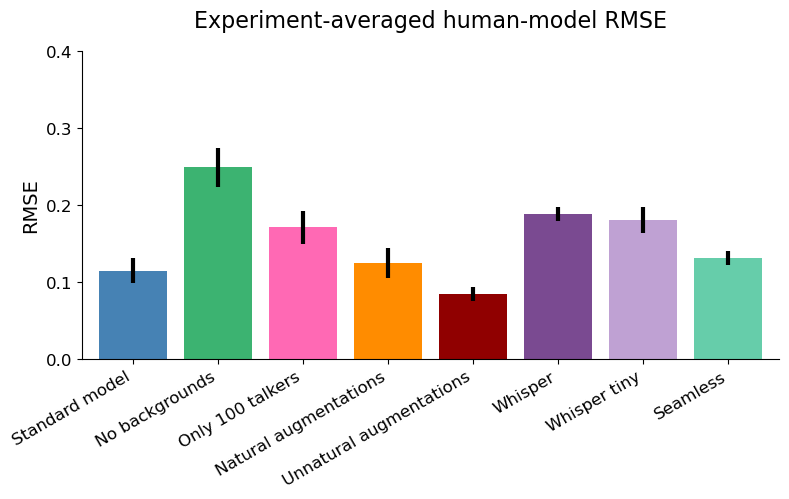

In [24]:
bwidth = 0.8

plt.figure(figsize=(len(model_inds) + 1, 4))
plt.bar(np.array([i for i in range(len(model_inds))])-bwidth/2., [np.nanmean(reversed_rmses[arch]) for arch in corr_archs], 
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(reversed_rmses[arch])/np.sqrt((~np.isnan(reversed_rmses[arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,0.4); plt.xlim(-1,len(model_inds) - .8)
plt.yticks([0.0, 0.1, 0.2, 0.3, 0.4], fontsize=12)
prettifyAxes(plt.gca())
plt.ylabel('RMSE',  fontsize=14)
plt.xticks([-0.4] + [0.6 + i for i in range(len(model_inds) - 1)], [names[ind] for ind in model_inds], rotation=30, ha='right', fontsize=12)
plt.title('Experiment-averaged human-model RMSE', {'fontsize': 16}, y=1.05)
plt.show()

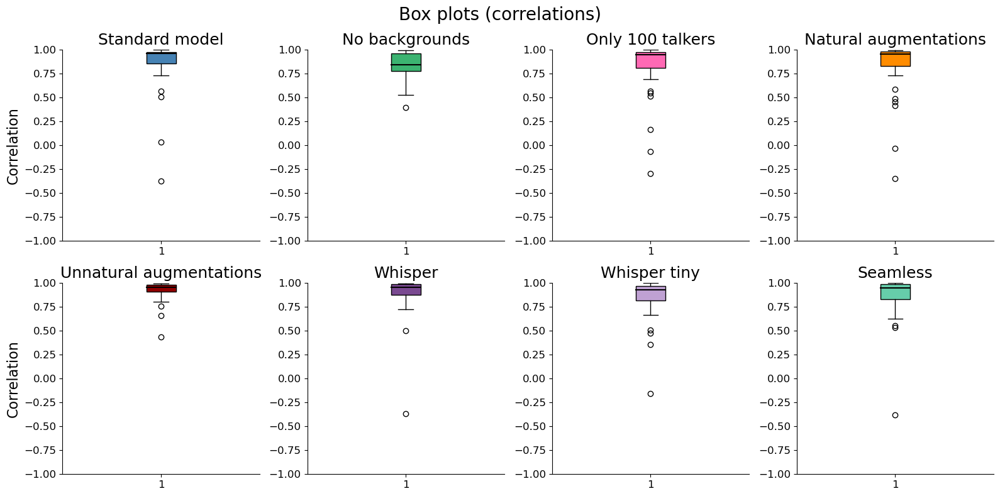

In [59]:
# box plots
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
                medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('Correlation', fontsize=16)
#     if j in [4, 5, 6, 7]:
#         plt.xlabel('Human', fontsize=16)
    plt.ylim(-1, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xlim(0, 1)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Box plots (correlations)', fontsize=20)
plt.tight_layout()
plt.show()

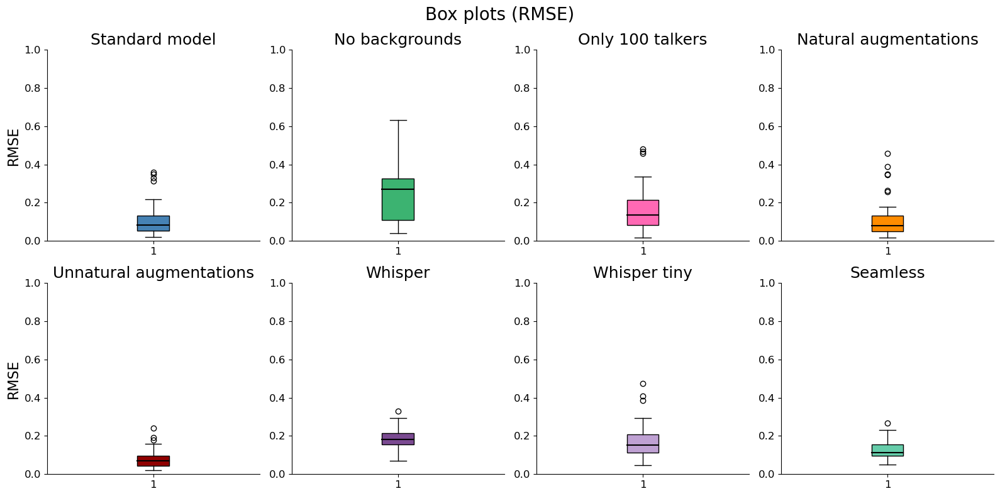

In [70]:
# rmse box plots
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    plt.boxplot(reversed_rmses[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
                medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('RMSE', fontsize=16)
#     if j in [4, 5, 6, 7]:
#         plt.xlabel('Human', fontsize=16)
    plt.ylim(0, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xlim(0, 1)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Box plots (RMSE)', fontsize=20)
plt.tight_layout()
plt.show()

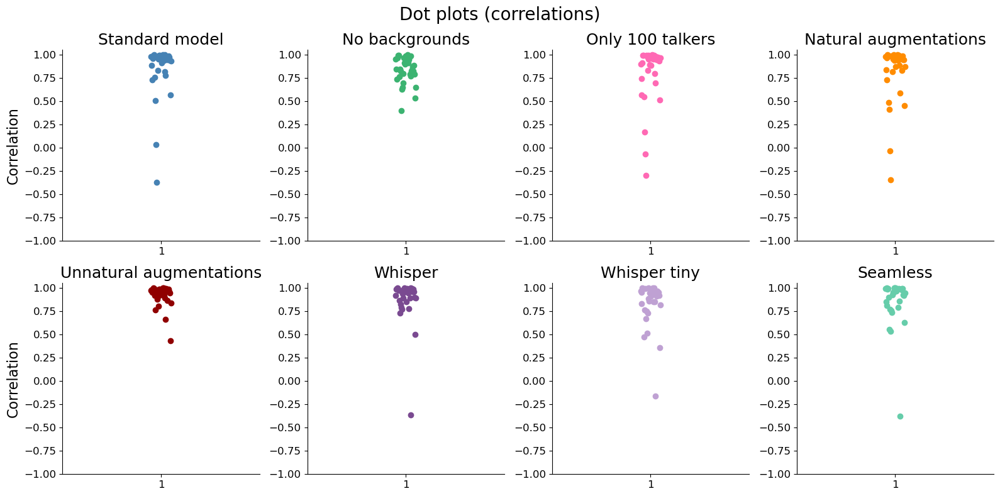

In [60]:
# dot plots
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    plt.scatter(np.linspace(0.9, 1.1, num=len(reversed_corrs[arch])), reversed_corrs[arch], color=colors[arch])
#     plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
#                 medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('Correlation', fontsize=16)
#     if j in [4, 5, 6, 7]:
#         plt.xlabel('Human', fontsize=16)
    plt.ylim(-1, 1.05)
    plt.xlim(0, 2)
    plt.xticks([1], fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xlim(0, 1)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Dot plots (correlations)', fontsize=20)
plt.tight_layout()
plt.show()

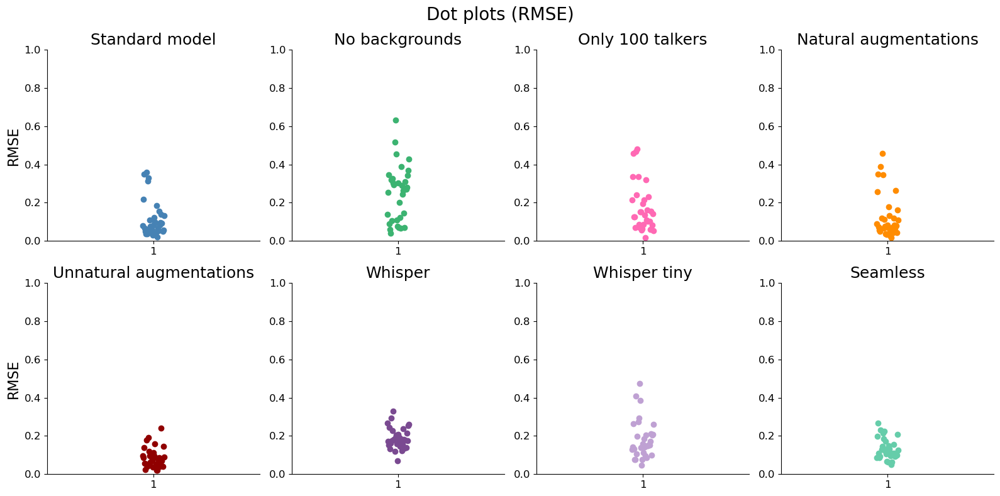

In [71]:
# rmse dot plots
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    plt.scatter(np.linspace(0.9, 1.1, num=len(reversed_rmses[arch])), reversed_rmses[arch], color=colors[arch])
#     plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
#                 medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('RMSE', fontsize=16)
#     if j in [4, 5, 6, 7]:
#         plt.xlabel('Human', fontsize=16)
    plt.ylim(0, 1)
    plt.xlim(0, 2)
    plt.xticks([1], fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xlim(0, 1)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Dot plots (RMSE)', fontsize=20)
plt.tight_layout()
plt.show()

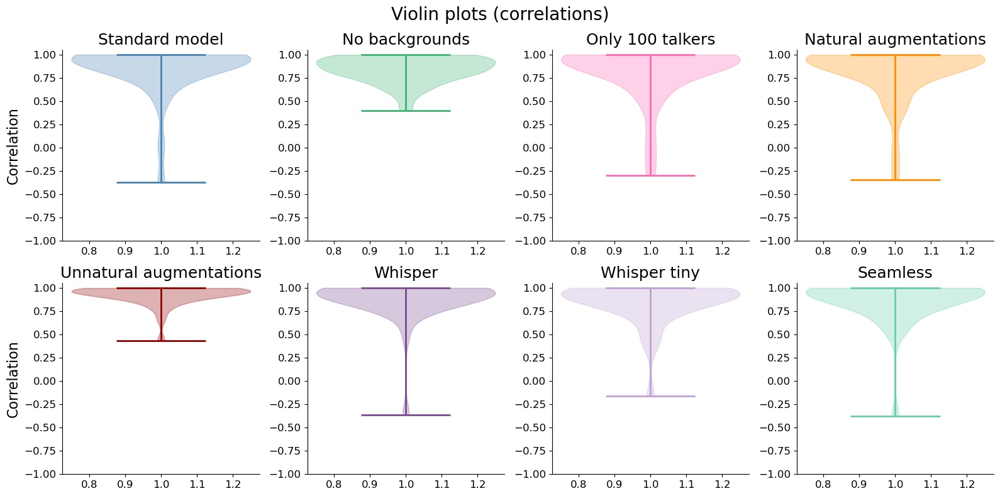

In [61]:
# violin plots
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    parts = plt.violinplot(reversed_corrs[arch])
    for pc in parts['bodies']:
        pc.set_facecolor(colors[arch])
        pc.set_edgecolor(colors[arch])
    parts['cmaxes'].set_color(colors[arch])
    parts['cmaxes'].set_linewidth(2)
    parts['cmins'].set_color(colors[arch])
    parts['cmins'].set_linewidth(2)
    parts['cbars'].set_color(colors[arch])
    parts['cbars'].set_linewidth(2)
    if j in [0, 4]:
        plt.ylabel('Correlation', fontsize=16)
#     if j in [4, 5, 6, 7]:
#         plt.xlabel('Human', fontsize=16)
    plt.ylim(-1, 1.05)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xlim(0, 1)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Violin plots (correlations)', fontsize=20)
plt.tight_layout()
plt.show()

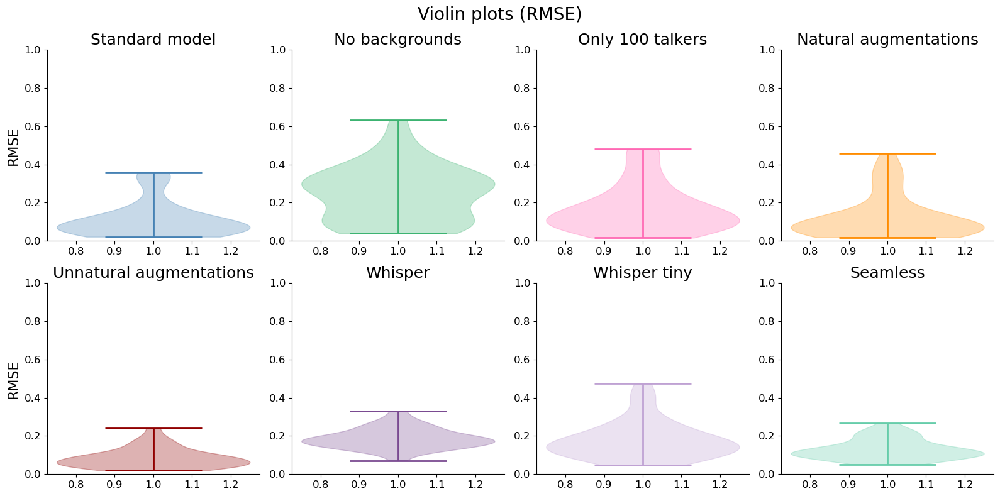

In [72]:
# rmse violin plots
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    parts = plt.violinplot(reversed_rmses[arch])
    for pc in parts['bodies']:
        pc.set_facecolor(colors[arch])
        pc.set_edgecolor(colors[arch])
    parts['cmaxes'].set_color(colors[arch])
    parts['cmaxes'].set_linewidth(2)
    parts['cmins'].set_color(colors[arch])
    parts['cmins'].set_linewidth(2)
    parts['cbars'].set_color(colors[arch])
    parts['cbars'].set_linewidth(2)
    if j in [0, 4]:
        plt.ylabel('RMSE', fontsize=16)
#     if j in [4, 5, 6, 7]:
#         plt.xlabel('Human', fontsize=16)
    plt.ylim(0, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xlim(0, 1)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Violin plots (RMSE)', fontsize=20)
plt.tight_layout()
plt.show()

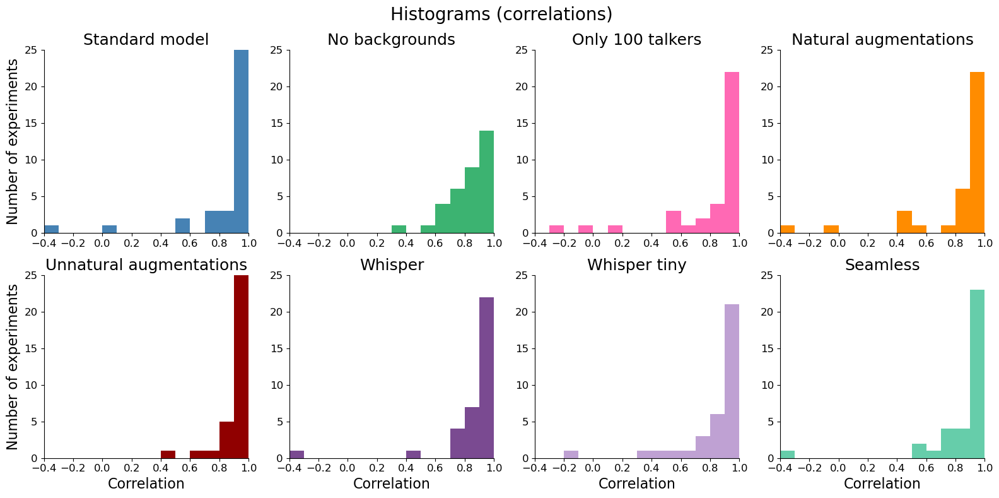

In [62]:
# histograms
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    counts, bins = np.histogram(reversed_corrs[arch], bins=np.array(list(range(-10, 11)))/10)
    plt.stairs(counts, bins, fill=True, color=colors[arch])
#     plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
#                 medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('Number of experiments', fontsize=16)
    if j in [4, 5, 6, 7]:
        plt.xlabel('Correlation', fontsize=16)
    plt.ylim(0, 25)
    plt.xlim(-0.4, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Histograms (correlations)', fontsize=20)
plt.tight_layout()
plt.show()

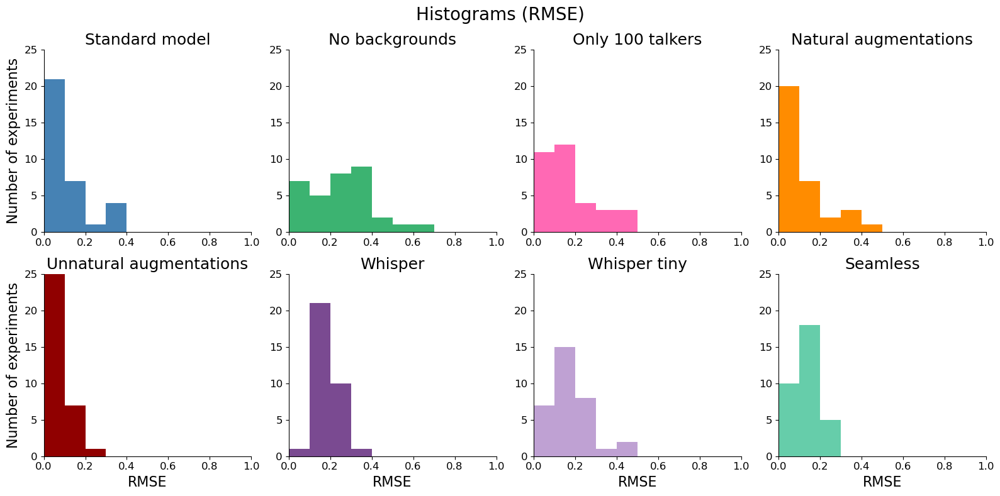

In [78]:
# rmse histograms
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    counts, bins = np.histogram(reversed_rmses[arch], bins=np.array(list(range(0, 11)))/10)
    plt.stairs(counts, bins, fill=True, color=colors[arch])
#     plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
#                 medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('Number of experiments', fontsize=16)
    if j in [4, 5, 6, 7]:
        plt.xlabel('RMSE', fontsize=16)
    plt.ylim(0, 25)
    plt.xlim(0, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Histograms (RMSE)', fontsize=20)
plt.tight_layout()
plt.show()

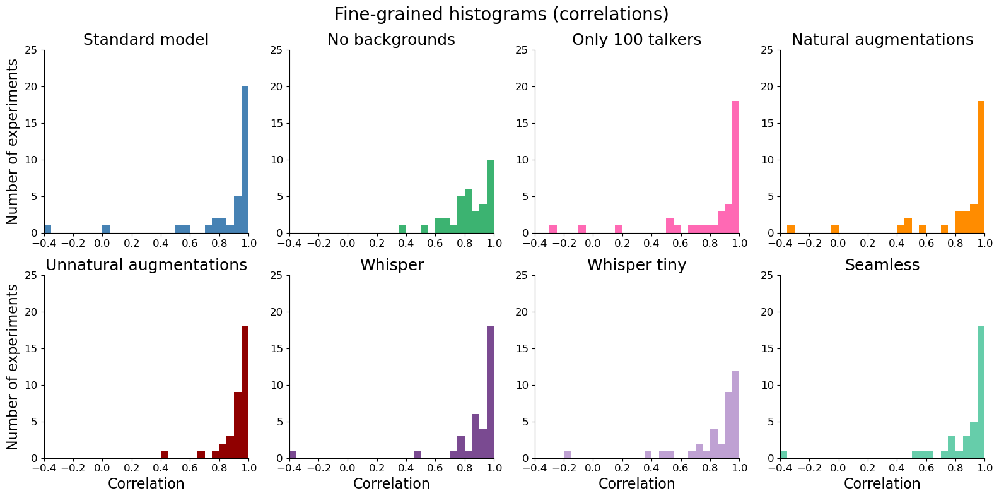

In [63]:
# fine grained histograms
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    counts, bins = np.histogram(reversed_corrs[arch], bins=np.array(list(range(-20, 21)))/20)
    plt.stairs(counts, bins, fill=True, color=colors[arch])
#     plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
#                 medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('Number of experiments', fontsize=16)
    if j in [4, 5, 6, 7]:
        plt.xlabel('Correlation', fontsize=16)
    plt.ylim(0, 25)
    plt.xlim(-0.4, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Fine-grained histograms (correlations)', fontsize=20)
plt.tight_layout()
plt.show()

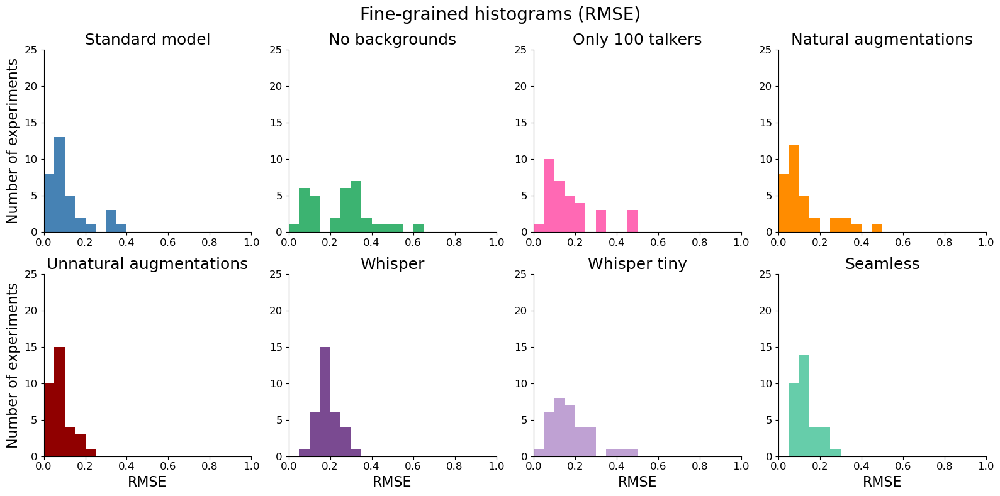

In [79]:
# rmse fine grained histograms
plt.figure(figsize=(16,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 4, 1+j)
    counts, bins = np.histogram(reversed_rmses[arch], bins=np.array(list(range(0, 21)))/20)
    plt.stairs(counts, bins, fill=True, color=colors[arch])
#     plt.boxplot(reversed_corrs[arch], patch_artist=True, boxprops=dict(facecolor=colors[arch]), 
#                 medianprops={'color': 'black', 'linewidth': 1.5})
    if j in [0, 4]:
        plt.ylabel('Number of experiments', fontsize=16)
    if j in [4, 5, 6, 7]:
        plt.xlabel('RMSE', fontsize=16)
    plt.ylim(0, 25)
    plt.xlim(0, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#     plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
#     plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
#     plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.suptitle('Fine-grained histograms (RMSE)', fontsize=20)
plt.tight_layout()
plt.show()

In [23]:
for exp in exps:
    for small_exp in experimental_conditions[exp]:
        for arch in corr_archs:
            for i in means[small_exp][arch]:
                if len(i) != 9:
                    print(small_exp, arch)

lowpass whisper
lowpass whisper
lowpass whisper
lowpass whisper
lowpass whisper
lowpass whisper_tiny
lowpass whisper_tiny
lowpass whisper_tiny
lowpass whisper_tiny
lowpass whisper_tiny
lowpass seamless
lowpass seamless
lowpass seamless
lowpass seamless
lowpass seamless
highpass whisper
highpass whisper
highpass whisper
highpass whisper
highpass whisper
highpass whisper
highpass whisper_tiny
highpass whisper_tiny
highpass whisper_tiny
highpass whisper_tiny
highpass whisper_tiny
highpass whisper_tiny
highpass seamless
highpass seamless
highpass seamless
highpass seamless
highpass seamless
highpass seamless
bandpass whisper
bandpass whisper
bandpass whisper
bandpass whisper
bandpass whisper
bandpass whisper
bandpass whisper_tiny
bandpass whisper_tiny
bandpass whisper_tiny
bandpass whisper_tiny
bandpass whisper_tiny
bandpass whisper_tiny
bandpass seamless
bandpass seamless
bandpass seamless
bandpass seamless
bandpass seamless
bandpass seamless
mod_lowpass-specmod whisper
mod_lowpass-specmo

In [17]:
total_corrs = {}
for arch in corr_archs:
#     print([len(i) for i in total_means[arch]])
#     print(len([i[j] for i in total_means[arch]]))
#     print(len(total_means[arch][0]))
    print(arch)
    print(len(total_means[arch][-1]), len(total_means['human']))
    for j in range(9):
        print(j, len([i[j] for i in total_means[arch]]))
    total_corrs[arch] = [np.corrcoef([i[j] for i in total_means[arch]], 
                                        total_means['human'])[1, 0] for j in range(len(total_means[arch][-1]))]
total_corrs

no_augs_800_words
9 228
0 228
1 228
2 228
3 228
4 228
5 228
6 228
7 228


IndexError: list index out of range

In [56]:
avged_corrs = {i: np.mean(total_corrs[i]) for i in total_corrs}
avged_corrs

{'no_augs_800_words': 0.8904310189650716,
 'no_bgs_800_words': 0.7871304404760529,
 '100_talkers_800_words': 0.838076246109148,
 'no_augs_small': 0.8800057706204093,
 'add_augs_800_words': 0.8643514746533515,
 'extreme_augs_minimal_800_words': 0.9136178978884596,
 'extreme_augs_800_words': 0.9412044208436959,
 'whisper': 0.9496736306844917,
 'whisper_tiny': 0.8803715974036932,
 'seamless': 0.9339725058242855}

In [51]:
corr_archs

['no_bgs', '100_talkers', 'no_augs_small', 'no_augs', 'whisper']

In [21]:
all_corrs = {}
for arch in corr_archs:
    all_corrs[arch] = np.mean([corrs[exp][arch] for exp in corrs], axis=0)

In [22]:
all_corrs

{'no_augs': array([0.92763876, 0.92305174, 0.92957565, 0.92323769, 0.92386306,
        0.91513034, 0.92716017, 0.92683171, 0.9295781 ]),
 'whisper': array([0.81887122])}

In [34]:
rmses = {}
for exp in exps:
    rmses[exp] = {}
    exp_conditions = experimental_conditions[exp]
    for arch in corr_archs:
        rmses[exp][arch] = [rmse(np.array([i[j] for i in means[exp][arch]]), 
                                        means[exp]['human']) for j in range(len(means[exp][arch][0]))]
rmses

{'audio_filtering': {'no_augs': [0.1890743990994575,
   0.19716806963710892,
   0.200809189985493,
   0.23476165944960525,
   0.20464422010558103,
   0.22545474706241103,
   0.18164348744237951,
   0.2129125175293386,
   0.19526321744222966],
  'whisper': [0.19850993645629286]},
 'spectemp_mod': {'no_augs': [0.06276696461193343,
   0.0640443319783674,
   0.061403187272510436,
   0.05842403240257133,
   0.05776494277448951,
   0.06383696235077872,
   0.05844852585436686,
   0.0522722043421043,
   0.06191482933104113],
  'whisper': [0.14690306386068888]},
 'repackaged_silenced': {'no_augs': [0.23426986557169505,
   0.27078348083068854,
   0.2315525042951315,
   0.2476394634702177,
   0.2514684592684439,
   0.28273125674457616,
   0.23875926501653957,
   0.23950308252260932,
   0.23179522594824925],
  'whisper': [0.2648599219578956]},
 'chimera': {'no_augs': [0.0858841222274711,
   0.07752825487059624,
   0.0806759579486458,
   0.07991847573886796,
   0.08580323747925334,
   0.08486729239

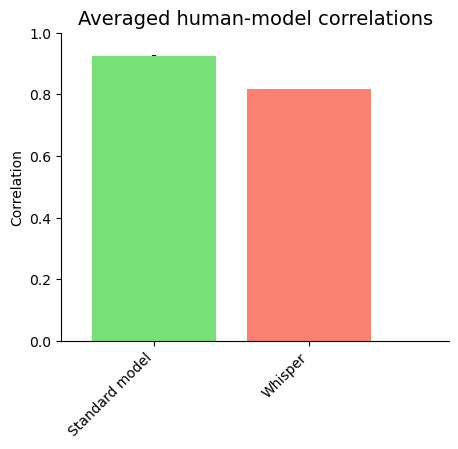

In [30]:
bwidth = 0.8

plt.figure(figsize=(5, 4))
plt.bar(np.array([0, 1])-bwidth/2., [np.nanmean(all_corrs[arch]) for arch in corr_archs], 
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(all_corrs[arch])/np.sqrt((~np.isnan(all_corrs[arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,1.5)
prettifyAxes(plt.gca())
plt.ylabel('Correlation')
plt.xticks([-0.4] + [0.6], [names[ind] for ind in model_inds], rotation=45, ha='right')
plt.title('Averaged human-model correlations', {'fontsize': 14})
plt.show()

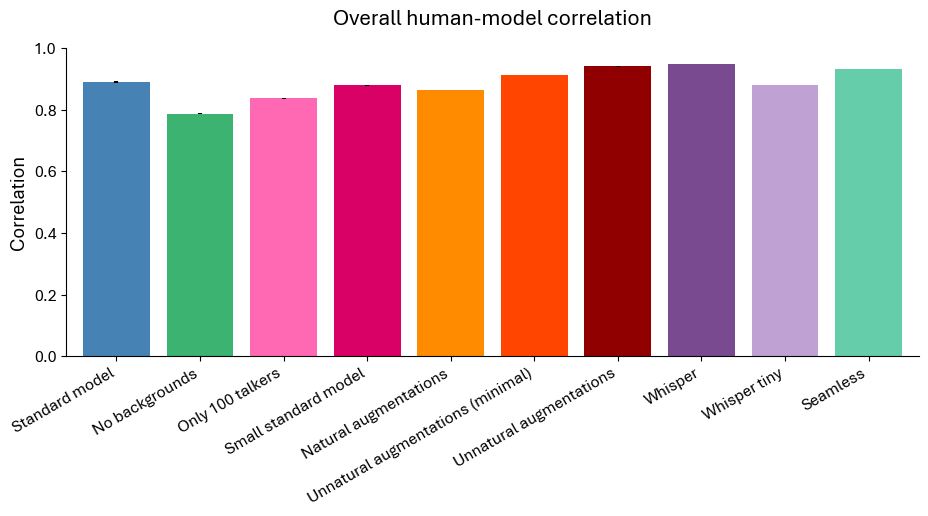

In [57]:
bwidth = 0.8

plt.figure(figsize=(len(model_inds) + 1, 4))
plt.bar(np.array([i for i in range(len(model_inds))])-bwidth/2., [np.nanmean(total_corrs[arch]) for arch in corr_archs], 
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(total_corrs[arch])/np.sqrt((~np.isnan(total_corrs[arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,len(model_inds) - .8)
plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=12)
prettifyAxes(plt.gca())
plt.ylabel('Correlation',  fontsize=14)
plt.xticks([-0.4] + [0.6 + i for i in range(len(model_inds) - 1)], [names[ind] for ind in model_inds], rotation=30, ha='right', fontsize=12)
plt.title('Overall human-model correlation', {'fontsize': 16}, y=1.05)
plt.show()

In [67]:
colors = [0, 1, 2, 3, 4, 5, 6, 6, 6, 7, 7, 7, 8, 9, 9, 10, 11, 12, 13, 14, 14, 15, 15, 16, 17, 18, 19, 20, 21, 22]
np.random.seed(1)
color_mapper = {i: [el/255. for el in [np.random.randint(0, 256),
                                       np.random.randint(0, 256),
                                       np.random.randint(0, 256)]] for i in range(23)}
model_inds = [0, 7]
exps = ['audio_filtering', 'spectemp_mod', 'repackaged_silenced', 'chimera', 'shuffled_clipped',
        'swin', 'reverb', 'compressed_dilated', 'local_time_reversal', 'backgrounds']
full_colors = []
full_exps = []
i = 0
for exp in exps:
    exp_conditions = experimental_conditions[exp]
    for cond in exp_conditions:
        color = color_mapper[colors[i]]
        for j in range(len(exp_conditions[cond])):
            full_colors.append(color)
        i += 1

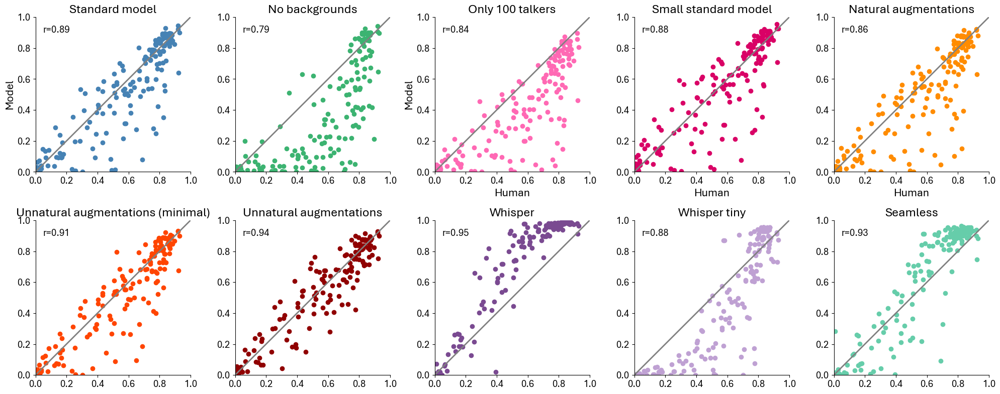

In [62]:
# scatter plots
plt.figure(figsize=(20,8))
plt.rcParams["figure.titlesize"] = 16
# plt.suptitle('Overall correlation plots', y=1.03)
for j, (i, arch) in enumerate(zip(model_inds, corr_archs)):
    plt.subplot(2, 5, 1+j)
    plt.scatter(total_means['human'], np.mean(total_means[arch], axis=1), color=colors[arch])
    plt.plot([0,1], [0,1], '-', lw=2, color='gray')
    if j in [0, 2]:
        plt.ylabel('Model', fontsize=16)
    if j in [2, 3, 4]:
        plt.xlabel('Human', fontsize=16)
    plt.axis('square')
    plt.ylim(0, 1)
    plt.xlim(0, 1)
    plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    plt.title(f'{names[i]}', {'fontsize': 18})
    plt.text(0.05, 0.9, f'r={(avged_corrs[arch]):.2f}', horizontalalignment='left', fontsize=14)
    prettifyAxes(plt.gca())
plt.tight_layout()
plt.show()

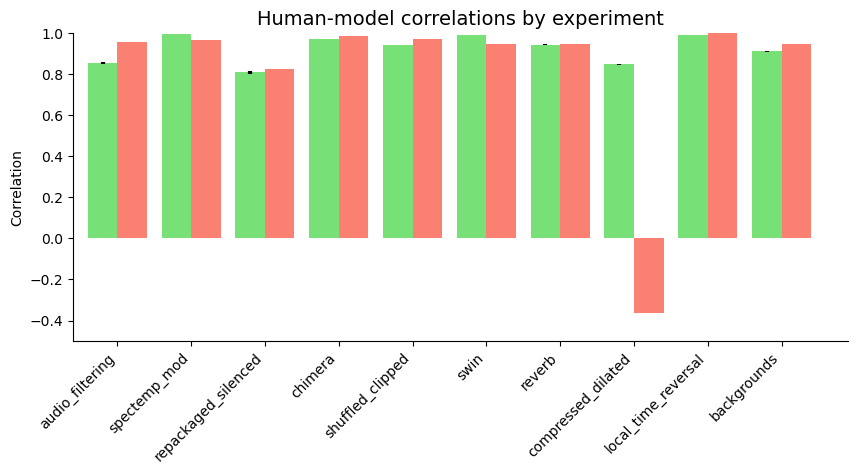

In [28]:
bwidth = 0.8

plt.figure(figsize=(10, 4))
for i, exp in enumerate(exps):
    plt.bar([i-bwidth/2.-bwidth*((2*len(corr_archs)-1)//2)/(2*len(corr_archs))+j*bwidth/len(corr_archs) for j in range(len(corr_archs))], 
            [np.nanmean(corrs[exp][arch]) for arch in corr_archs], width=bwidth/len(corr_archs),
        color=[colors[arch] for arch in corr_archs], lw=0, 
        yerr=[np.nanstd(corrs[exp][arch])/np.sqrt((~np.isnan(corrs[exp][arch])).sum()) for arch in corr_archs],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(-0.5,1); plt.xlim(-1,len(exps)-0.5)
prettifyAxes(plt.gca())
plt.ylabel('Correlation')
plt.xticks([i - 0.4 for i in range(len(exps))], [exp for exp in exps], rotation=45, ha='right')
plt.title('Human-model correlations by experiment', {'fontsize': 14})
plt.show()

In [5]:
## CORRELATIONS ##
for condition in conditions:
    print(condition)
    for arch in archs[:6]:
        mean = np.mean(np.load(f'{dir_dst}/{condition}/{arch}.npy'), axis=1)
        print('   ' + arch, mean)
    print('\n')

clean
   no_augs [0.93550725]
   add_augs [0.92616128]
   no_bgs [0.9426793]
   100_talkers [0.9049424]
   kell_data [0.88732813]
   extreme_augs_new [0.925288]


compressed_dilated
   no_augs [0.43182776 0.91614372 0.95767196 0.93550725 0.97219146 0.95271933
 0.79546573]
   add_augs [0.67988558 0.92912514 0.95256552 0.92616128 0.9614864  0.94146056
 0.79174357]
   no_bgs [0.45654923 0.91903531 0.95841024 0.9426793  0.97120709 0.95118125
 0.79558878]
   100_talkers [0.30243902 0.84345392 0.92503384 0.9049424  0.94952012 0.9021164
 0.64661007]
   kell_data [0.18051792 0.84474591 0.90340839 0.88732813 0.87944506 0.7180694
 0.33004184]
   extreme_augs_new [0.7875941  0.93638489 0.95518026 0.925288   0.96290144 0.95222714
 0.87587671]


cognitive_restoration
   no_augs [0.89674842 0.88306931 0.79112747 0.63853562 0.50223115 0.15826268
 0.07576603 0.05732188]
   add_augs [0.89031958 0.88106128 0.80823293 0.65882047 0.48520006 0.1519225
 0.0711364  0.0567455 ]
   no_bgs [0.91759569 0.8875502

   kell_data [0.10929023 0.03552583 0.00785953 0.00159792 0.00078038]
   extreme_augs_new [0.12829803 0.17995169 0.02783352 0.00234114 0.00042735]


chimera-envelope
   no_augs [0.19791899 0.05457079 0.21239316 0.63599034 0.80327016]
   add_augs [0.19342252 0.03877741 0.18179116 0.60369751 0.79728725]
   no_bgs [0.10336306 0.06172427 0.29442586 0.73428094 0.85460795]
   100_talkers [0.15981048 0.0580825  0.2304162  0.62365292 0.77686734]
   kell_data [0.14437012 0.0786139  0.2933482  0.67688592 0.80048309]
   extreme_augs_new [0.20154218 0.05102192 0.26417689 0.6614084  0.81057228]


chimera_noise-fs
   no_augs [0.52746191 0.65562988 0.37333705 0.16566332 0.078521  ]
   add_augs [0.49368265 0.66261613 0.37539948 0.15839836 0.05544407]
   no_bgs [0.16049796 0.22777778 0.0605537  0.01192865 0.00759941]
   100_talkers [0.42222222 0.46785582 0.19977703 0.06800446 0.03058343]
   kell_data [0.45304719 0.26309922 0.0821256  0.03292456 0.027945  ]
   extreme_augs_new [0.50512821 0.62517651 0.3

FileNotFoundError: [Errno 2] No such file or directory: '/om2/user/amagaro/word_recognition_project/full_results_230//synth_reverb-10/add_augs.npy'

In [31]:
means = {}
bg_means = {}
for arch in archs[:6] + ['human']:
    means[arch] = []
    for condition in conditions:
        total = np.load(f'{dir_dst}/{condition}/{arch}.npy') #list(np.mean(np.load(f'{dir_dst}/{condition}/{arch}.npy'), axis=1))
        if arch == 'human':
            mean = list(np.mean(total, axis=1))
        else:
            mean = [[j for j in i] for i in total]
        means[arch].extend(mean)
for arch in archs[:6] + ['human']:
    bg_means[arch] = []
    for condition in bg_conditions:
        total = np.load(f'{dir_dst}/background-{condition}/{arch}.npy') #list(np.mean(np.load(f'{dir_dst}/background-{condition}/{arch}.npy'), axis=1))
        if arch == 'human':
            mean = list(np.mean(total, axis=1))
        else:
            mean = [[j for j in i] for i in total]
        bg_means[arch].extend(mean)

In [7]:
bg_means

{'no_augs': [[0.2765957446808511,
   0.2925531914893617,
   0.300531914893617,
   0.27393617021276595,
   0.27393617021276595,
   0.27925531914893614,
   0.26861702127659576,
   0.26595744680851063,
   0.31117021276595747],
  [0.45478723404255317,
   0.44148936170212766,
   0.43617021276595747,
   0.4654255319148936,
   0.4441489361702128,
   0.4574468085106383,
   0.43617021276595747,
   0.46808510638297873,
   0.43882978723404253],
  [0.6170212765957447,
   0.6462765957446809,
   0.6090425531914894,
   0.6196808510638298,
   0.6223404255319149,
   0.6117021276595744,
   0.6063829787234043,
   0.6409574468085106,
   0.6223404255319149],
  [0.7287234042553191,
   0.7526595744680851,
   0.7446808510638298,
   0.7420212765957447,
   0.7553191489361702,
   0.7420212765957447,
   0.75,
   0.7367021276595744,
   0.7340425531914894],
  [0.8058510638297872,
   0.8164893617021277,
   0.8191489361702128,
   0.8111702127659575,
   0.8085106382978723,
   0.8218085106382979,
   0.8031914893617021,

In [9]:
corrs = {}
for arch in archs[:4]:
    corrs[arch] = np.corrcoef(means[arch] + bg_means[arch], means['human'] + bg_means['human'])
#corrs['kell_data'] = np.corrcoef(means['kell_data'], means['human'])

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 9 and the array at index 1 has size 159

In [32]:
bg_corrs = {}
sp_corrs = {}
for arch in archs[:6]:
    bg_corrs[arch] = [np.corrcoef([i[j] for i in bg_means[arch]], bg_means['human'])[1, 0] for j in range(9)]
for arch in archs[:6]:
    sp_corrs[arch] = [np.corrcoef([i[j] for i in means[arch]], means['human'])[1, 0] for j in range(9)]

In [33]:
all_corrs = {}
for arch in archs[:6]:
    all_corrs[arch] = [np.corrcoef([i[j] for i in bg_means[arch]] + [i[j] for i in means[arch]], bg_means['human'] + means['human'])[1, 0] for j in range(9)]

In [34]:
def rmse(y_true, y_pred): return np.sqrt(np.mean((y_true - y_pred)**2))

In [35]:
bg_rmses = {}
sp_rmses = {}
for arch in archs[:6]:
    bg_rmses[arch] = [rmse(np.array([i[j] for i in bg_means[arch]]), bg_means['human']) for j in range(9)]
for arch in archs[:6]:
    sp_rmses[arch] = [rmse(np.array([i[j] for i in means[arch]]), means['human']) for j in range(9)]

In [36]:
all_rmses = {}
for arch in archs[:6]:
    all_rmses[arch] = [rmse(np.array([i[j] for i in bg_means[arch]] + [i[j] for i in means[arch]]), bg_means['human'] + means['human']) for j in range(9)]

In [11]:
bg_corrs

{'no_augs': [0.972565185721365,
  0.9704357817092797,
  0.9701074006604761,
  0.96699569811772,
  0.9726170088407399,
  0.9693059719677077,
  0.9749745163588618,
  0.9658705730669555,
  0.9696802049843426],
 'add_augs': [0.9486056202763843,
  0.9301499588878254,
  0.9342860294354465,
  0.9415060140317651,
  0.9279180852895031,
  0.9431599123725476,
  0.9342430676973135,
  0.9348231858926134,
  0.9345350916831693],
 'no_bgs': [0.8747182189232494,
  0.8711725044983831,
  0.8740200105213117,
  0.8769831178885614,
  0.8760425836392072,
  0.8755786550311654,
  0.8735994540244018,
  0.8670460996821101,
  0.8817916429363523],
 '100_talkers': [0.9760712483598124,
  0.983944324887605,
  0.9776822939086286,
  0.9798801797697106,
  0.9778815524191886,
  0.9808915846890671,
  0.9782033947069241,
  0.9819047484530687,
  0.9731919935743476],
 'kell_data': [0.8350391270090831,
  0.8067907994995531,
  0.8241575834830613,
  0.750107753108385,
  0.7946329549399703,
  0.7732612112303413,
  0.812550952397

In [44]:
all_corrs

{'no_augs': [0.8954386424367219,
  0.8803532093620813,
  0.8960742310628604,
  0.8812043526466631,
  0.8871513962083715,
  0.8724884340049085,
  0.8954007008215515,
  0.8879814052732669,
  0.8937746026097778],
 'add_augs': [0.8750054710893378,
  0.8599266051985102,
  0.8584184868340229,
  0.8654935050890391,
  0.8708526661871497,
  0.8571597694184151,
  0.8605007023800164,
  0.8619822988843926,
  0.8654729527566402],
 'no_bgs': [0.8091575757629146,
  0.8072514330242537,
  0.8125711063026528,
  0.8076497436177237,
  0.813444972646396,
  0.8091497598367371,
  0.8004393800510563,
  0.8116130552606029,
  0.8140470838810517],
 '100_talkers': [0.8333112900595898,
  0.8372338533414434,
  0.840012659864963,
  0.8387621275992513,
  0.8434440581531978,
  0.8226567457772408,
  0.8513527950618374,
  0.8392528567950264,
  0.8427969879053092],
 'kell_data': [0.7015979237147378,
  0.6950658931295245,
  0.7096530666244918,
  0.6967618271018196,
  0.7205054973857474,
  0.6883833355671609,
  0.695939438

In [13]:
sp_corrs

{'no_augs': [0.8906548621967882,
  0.8753079594916683,
  0.8916232891911883,
  0.8753288891766883,
  0.882503940415358,
  0.8674930441635003,
  0.8906195304400061,
  0.8832939942194796,
  0.8893837211941524],
 'add_augs': [0.8681299109123011,
  0.8530668978759218,
  0.8507876479441577,
  0.8574398625090026,
  0.8659938809434259,
  0.849087837705616,
  0.8552284614406871,
  0.8541870880803487,
  0.8582400249615609],
 'no_bgs': [0.8001139451729274,
  0.7987346908871067,
  0.8038056329759199,
  0.7977181095694399,
  0.8048369133845352,
  0.7996776578363604,
  0.7891504593269226,
  0.8040102403240149,
  0.804747419484005],
 '100_talkers': [0.8201870504466666,
  0.8232416936946253,
  0.8266225174932074,
  0.8244852802543501,
  0.8301922527334402,
  0.8069758628454803,
  0.8384980194725953,
  0.8257671092391478,
  0.8298474482907598],
 'kell_data': [0.6971786289333093,
  0.6952934922713779,
  0.7077974413650375,
  0.7004098113532948,
  0.7207666030604019,
  0.6868453058111219,
  0.6949679536

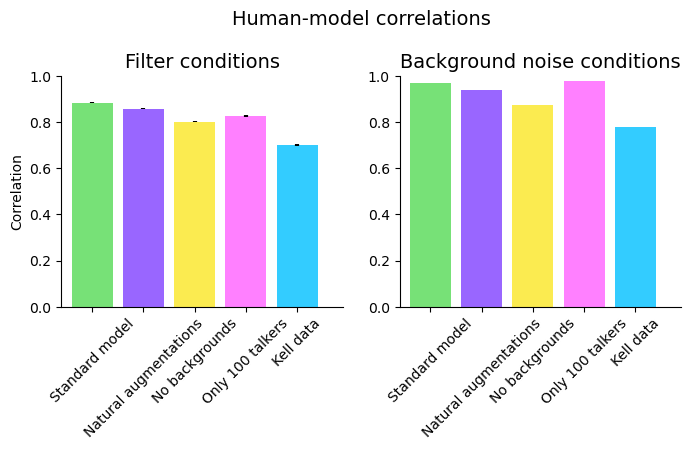

In [14]:
bwidth = 0.8

plt.figure(figsize=(8,3))
plt.subplot(121)
plt.bar(np.array([0, 1, 2, 3, 4])-bwidth/2., [np.nanmean(sp_corrs[arch]) for arch in archs[:5]], 
        color=[colors[arch] for arch in archs[:5]], lw=0, 
        yerr=[np.nanstd(sp_corrs[arch])/np.sqrt((~np.isnan(sp_corrs[arch])).sum()) for arch in archs[:5]],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,4.5)
prettifyAxes(plt.gca())
plt.ylabel('Correlation')
plt.xticks([-0.4] + [0.6, 1.6, 2.6, 3.6], names[:5], rotation=45)
#plt.legend(['H', 'Kell 2018', 'Nat. model', 'CV model'])
plt.title('Filter conditions', {'fontsize': 14})
plt.subplot(122)
plt.bar(np.array([0, 1, 2, 3, 4])-bwidth/2., [np.nanmean(bg_corrs[arch]) for arch in archs[:5]], 
        color=[colors[arch] for arch in archs[:5]], lw=0, 
        yerr=[0*np.nanstd(bg_corrs[arch])/np.sqrt((~np.isnan(bg_corrs[arch])).sum()) for arch in archs[:5]],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,4.5)
prettifyAxes(plt.gca())
#plt.ylabel('Error')
plt.xticks([-0.4] + [0.6, 1.6, 2.6, 3.6], names[:5], rotation=45)
#plt.legend(['H', 'Kell 2018', 'Nat. model', 'CV model'])
plt.title('Background noise conditions', {'fontsize': 14})
plt.suptitle('Human-model correlations', fontsize=14, y=1.1)
plt.show()

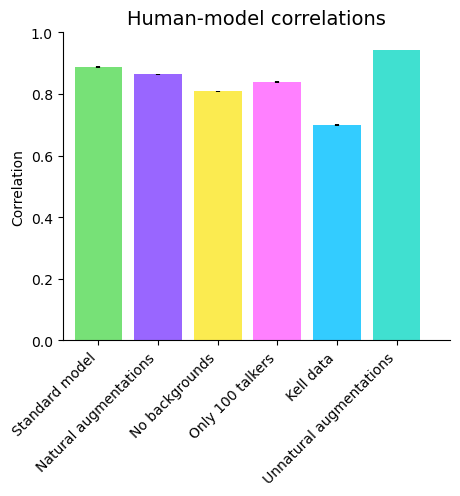

In [42]:
bwidth = 0.8

plt.figure(figsize=(5, 4))
plt.bar(np.array([0, 1, 2, 3, 4, 5])-bwidth/2., [np.nanmean(all_corrs[arch]) for arch in archs[:6]], 
        color=[colors[arch] for arch in archs[:6]], lw=0, 
        yerr=[np.nanstd(all_corrs[arch])/np.sqrt((~np.isnan(all_corrs[arch])).sum()) for arch in archs[:6]],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,5.5)
prettifyAxes(plt.gca())
plt.ylabel('Correlation')
plt.xticks([-0.4] + [0.6, 1.6, 2.6, 3.6, 4.6], names[:6], rotation=45, ha='right')
#plt.legend(['H', 'Kell 2018', 'Nat. model', 'CV model'])
plt.title('Human-model correlations', {'fontsize': 14})
plt.show()

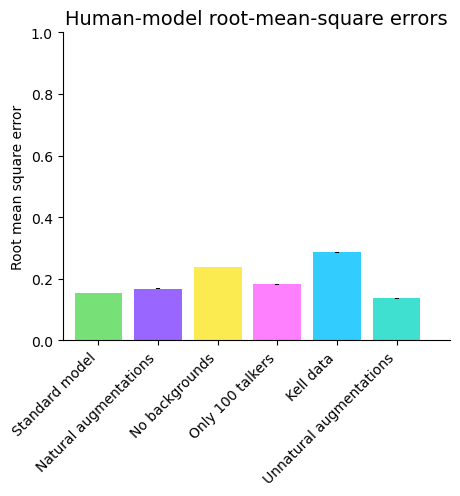

In [43]:
bwidth = 0.8

plt.figure(figsize=(5, 4))
plt.bar(np.array([0, 1, 2, 3, 4, 5])-bwidth/2., [np.nanmean(all_rmses[arch]) for arch in archs[:6]], 
        color=[colors[arch] for arch in archs[:6]], lw=0, 
        yerr=[np.nanstd(all_rmses[arch])/np.sqrt((~np.isnan(all_rmses[arch])).sum()) for arch in archs[:6]],
        error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
plt.ylim(0,1); plt.xlim(-1,5.5)
prettifyAxes(plt.gca())
plt.ylabel('Root mean square error')
plt.xticks([-0.4] + [0.6, 1.6, 2.6, 3.6, 4.6], names[:6], rotation=45, ha='right')
#plt.legend(['H', 'Kell 2018', 'Nat. model', 'CV model'])
plt.title('Human-model root-mean-square errors', {'fontsize': 14})
plt.show()

In [5]:
def reformat_whisper_results(conditions, model='whisper'):
    folders = {
        'whisper': 'whisper_all_predictions',
        'whisper_tiny': 'whisper_all_predictions',
        'seamless': 'seamless_all_predictions'
    }
    fstarts = {
        'whisper': 'whisper-large-v3',
        'whisper_tiny': 'whisper-tiny',
        'seamless': 'seamlessm4t'
    }
    chimera_col = {
        'whisper': 3,
        'whisper_tiny': 5,
        'seamless': 5
    }
    full_results = {}
    for condition in conditions:
        ans_col = -2 if condition == 'chimera-envelope' else -1
        cond_col = chimera_col[model] if ('chimera' in condition and not (model == 'seamless' and condition == 'chimera_noise-fs')) else 4
        if 'mod_lowpass' in condition:
            fn_cond = condition.split('-')[-1]
        elif 'clipped' in condition:
            fn_cond = f"{condition.split('-')[-1]}_clipping"
        elif 'chimera' in condition:
            fn_cond = condition.split('-')[0]
        elif 'tone_vocoded' in condition:
            fn_cond = '_'.join([condition.split('-')[0].replace('_', '-'), condition.split('-')[1]])
            print(fn_cond)
        else:
            fn_cond = condition.replace('.', '').replace('-', '_')
            
        if fn_cond == '43_textures':
            for i in range(11):
                results_file = f"/om2/user/gelbanna/repos/projects/{folders[model]}/{fstarts[model]}_{fn_cond}_{i}_pred.csv"
                if i == 0:
                    results = pd.read_csv(results_file)
                else:
                    results = pd.concat([results, pd.read_csv(results_file)])
        elif 'tone-vocoded' in fn_cond:
            results_file = f"/om2/user/gelbanna/repos/projects/{folders[model]}/{fstarts[model]}_{fn_cond}_pred.csv"
            results = pd.read_csv(results_file)
        else:
            results_file = f"/om2/user/gelbanna/repos/projects/{folders[model]}/{fstarts[model]}_{fn_cond}{'' if model=='seamless' else '_0'}_pred.csv"
            results = pd.read_csv(results_file)
        setting_col = results.columns[cond_col]
        settings = results[setting_col] if len(results.columns) > 6 else [1]*len(results['correct'])
        results_dict = {}
        for setting, result in zip(settings, results[results.columns[ans_col]]):
            results_dict[setting] = results_dict.get(setting, [])
            results_dict[setting].append(result)
        keys = sorted(results_dict)
        sorted_results_dict = {key: results_dict[key] for key in keys}
        full_results[condition] = sorted_results_dict
    for condition in conditions:
        condition_new = condition
        if condition == 'bandpass':
            full_results[condition]['unfiltered'] = full_results['clean'][1]
        if condition == 'clipped-peak' or condition == 'clipped-center': 
            del full_results[condition][0.95]
        if condition == 'compressed_dilated':
            temp_dict = {}
            for key in [0.5, 0.75, 0.875]:
                temp_dict[key] = full_results[condition][key]
            temp_dict[1] = full_results['clean'][1]
            for key in [1.25, 1.5, 2.0]:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict
        if condition == 'highpass':
            temp_dict = {}
            temp_dict['unfiltered'] = full_results['clean'][1]
            for key in [400, 800, 1600, 3200, 6400]:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict
        if condition == 'inharmonic':
            temp_dict = {}
            temp_dict['harm'] = full_results['clean'][1]
            for key in ['jitt10', 'jitt30', 'jitt50']:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict
        if condition == 'lowpass':
            del full_results[condition][200]
            del full_results[condition][6400]
            full_results[condition]['unfiltered'] = full_results['clean'][1]
        if condition == 'repackaged':
            temp_dict = {}
            temp_dict['inf'] = full_results['compressed_dilated'][0.5]
            for key in [4.0, 2.0, 1.0, 0.5, 0.25]:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict
        if condition == 'shuffled':
            del full_results[condition][8.0]
            del full_results[condition][16.0]
        if condition == 'mod_lowpass-specmod':
            del full_results[condition][16.0]
            full_results[condition]['unfiltered'] = full_results['clean'][1]
        if condition == 'mod_lowpass-tempmod':
            del full_results[condition][48]
            full_results[condition]['unfiltered'] = full_results['clean'][1]
        if condition in ['audscene', 'babble', 'music', 'stat_noise', 'mod_noise']:
            temp_dict = {}
            for snr in [-9, -6, -3, 0, 3, 'inf']:
                temp_dict[snr] = full_results[condition][f'{snr}dB']
            full_results[condition] = temp_dict
        if 'synth_reverb' in condition:
            temp_dict = {}
            for key in ['200ms', '400ms', '800ms', '1600ms']:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict
        if 'silenced' in condition:
            temp_dict = {}
            for key in [100, 30, 10, 3, 1]:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict  
        if 'masked' in condition:
            for snr in [-18, -9, 0, 9]:
                temp_dict = {}
                for timescale in [100, 30, 10, 3, 1]:
                    temp_dict[timescale] = full_results[f'masked-{timescale}'][snr]
                full_results[snr] = temp_dict
                condition_new = f'masked-{snr}'
                json.dump(full_results[snr], open(f'/om2/user/amagaro/word_recognition_project/{model}_jsons/{condition_new}.json', 'w'))
        if condition == 'noise_vocoded':
            temp_dict = {}
            for key in [1, 2, 4, 8, 16, 32]:
                temp_dict[key] = full_results[condition][key]
            full_results[condition] = temp_dict 
        
        if condition == '43_textures':
            temp_dict = {}
            order = list(np.load('/om2/user/amagaro/human_experiment/43_textures_order.npy'))
            print(order)
            for key in order:
                temp_dict[int(key)] = full_results[condition][key]
            full_results[condition] = temp_dict
        if 'tone_vocoded' in condition:
            temp_dict = {}
            for snr in [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]:
                temp_dict[snr] = full_results[condition][f'{snr}dB']
            full_results[condition] = temp_dict
        
        print(condition_new, full_results[condition].keys(), condition)
        if 'masked' not in condition:
            json.dump(full_results[condition], open(f'/om2/user/amagaro/word_recognition_project/{model}_jsons/{condition_new}.json', 'w'))

In [6]:
# reformat_whisper_results(['bandpass', 'center_clipping', 'clean', 'cognitive_restoration', 'compressed_dilated',
#                           'highpass', 'inharmonic', 'lowpass', 'peak_clipping', 'repackaged', 'shuffled',
#                           'sine_wave_speech', 'specmod', 'tempmod', 'whispered'])
# reformat_whisper_results(['clean', 'center_clipping', 'peak_clipping', 'specmod', 'tempmod'])
# reformat_whisper_results(['clean', 'whispered', 'sine_wave_speech', 'compressed_dilated', 'cognitive_restoration',
#                           'audscene', 'babble', 'music', 'stat_noise', 'mod_noise', 'lowpass', 'highpass', 
#                          'bandpass'])
reformat_whisper_results(conditions[-10:], 'whisper_tiny')
#reformat_whisper_results(['masked_1', 'masked_3', 'masked_10', 'masked_30', 'masked_100'])

tone-vocoded_stat_0
tone-vocoded_stat_8
tone-vocoded_stat_16
tone-vocoded_stat_24
tone-vocoded_stat_32
tone-vocoded_mod_0
tone-vocoded_mod_8
tone-vocoded_mod_16
tone-vocoded_mod_24
tone-vocoded_mod_32
tone_vocoded-stat_0 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-stat_0
tone_vocoded-stat_8 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-stat_8
tone_vocoded-stat_16 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-stat_16
tone_vocoded-stat_24 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-stat_24
tone_vocoded-stat_32 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-stat_32
tone_vocoded-mod_0 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-mod_0
tone_vocoded-mod_8 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-mod_8
tone_vocoded-mod_16 dict_keys([-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]) tone_vocoded-mod_16
tone_vocoded-mod_24 dict_keys([-15, -12, -9, 

In [7]:
asr_model = 'whisper_tiny'
for cond in conditions[-10:]: #['masked--18', 'masked--9', 'masked-0', 'masked-9'] + conditions[:17] + conditions[22:-1]:
    with open(f'/om2/user/amagaro/word_recognition_project/{asr_model}_jsons/{cond}.json') as f:
        full_results = json.load(f)
        means = [np.mean(full_results[i]) for i in full_results]
        np.save(f'/om2/user/amagaro/word_recognition_project/full_results_230/{cond.split("-")[1]}/{asr_model}.npy', 
                np.array([means]).T)

In [8]:
def get_whisper_mean_se(condition, model):
    with open(f'/om2/user/amagaro/word_recognition_project/{model}_jsons/{condition}.json') as f:
        full_results = json.load(f)
    means = []
    ses = []
    for key, results in full_results.items():
        mean, se = bootstrap(results, n_bootstraps=100)
        means.append(mean)
        ses.append(se)
        
    return np.array(means), np.array(ses)
    
def bootstrap(results, n_bootstraps):
    n_trials = len(results)
    means = []
    for i in range(n_bootstraps):
        resampled = np.random.choice(results, size=n_trials, replace=True)
        mean = np.mean(resampled)
        means.append(mean)
    boot_mean = np.mean(means)
    boot_se = np.std(means)
    return boot_mean, boot_se
        

In [5]:
def plot_human_model_results(condition, xticks, xax, title,
                             all_archs=archs, all_names=names, dir_dst=dir_dst,
                             legend=True,
                             model_indices=[0, 1, 2, 3], plot_num_subjs=True, plot_human=True, plot_ylabel=True):
    archs = [all_archs[i] for i in model_indices] 
    names = [all_names[i] for i in model_indices]
    # results should be formatted so that the shape is (conditions X subjects)
    if plot_human:
        human_results = np.load(f'{dir_dst}/{condition}/human.npy')
        num_subjs = human_results.shape[1]
        hum_m = np.nanmean(human_results, axis=1)
        hum_se = np.nanstd(human_results, axis=1) / np.sqrt(human_results.shape[1])
        if 'background' in condition:
            hum_se = np.mean(np.load(f'{dir_dst}/{condition}/human_err.npy'), axis=1)
    model_m = {}
    model_se = {}
    for arch in archs:
        if arch in asr_models:
            model_m[arch], model_se[arch] = get_whisper_mean_se(condition, arch)
        else:
            model_results = np.load(f'{dir_dst}/{condition}/{arch}.npy')
            model_m[arch] = np.mean(model_results, axis=1)
            model_se[arch] = np.std(model_results, axis=1) 
        
    x = np.arange(len(xticks))
    if plot_human:
        plt.fill_between(x, hum_m+hum_se, hum_m-hum_se, color=colors['human'], lw=0, alpha=0.4)
        plt.plot(x, hum_m, 'o-', color=colors['human'], mec='white', lw=2, label='Human')
    for arch, name in zip(archs, names):
        plt.fill_between(x, model_m[arch]+model_se[arch], model_m[arch]-model_se[arch], color=colors[arch], lw=0, alpha=0.4)
        plt.plot(x, model_m[arch], 'o-', color=colors[arch], mec='white', lw=2, label=name)
    if plot_ylabel:
        plt.ylabel('Proportion correct', {'fontsize': 16})
    plt.xlabel(xax, {'fontsize': 16})
    plt.title(title, {'fontsize': 18}, y=1.08)
    if plot_num_subjs and plot_human:
        plt.text(len(x)/2-0.5, 1.03, f'(n = {num_subjs})', horizontalalignment='center', fontsize=14)
    if legend:
        plt.legend(fontsize=14)
    plt.ylim(0, 1)
    plt.xticks(x, xticks, fontsize=14)
    plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=14)
    prettifyAxes(plt.gca())

In [6]:
import tempfile
from pathlib import Path
import urllib

path_font = "/om2/user/amagaro/word_recognition_project/aptos.ttf"

from matplotlib import font_manager

# Create a Matplotlib Font object from our `.ttf` file
font = font_manager.FontEntry(fname=str(path_font), name="Aptos")

# Register this object with Matplotlib's ttf list
font_manager.fontManager.ttflist.append(font)
# Print the last few items to see what they look like
print(font_manager.fontManager.ttflist[-3:])

[FontEntry(fname='/usr/share/fonts/dejavu/DejaVuSansMono-Bold.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable'), FontEntry(fname='/usr/share/fonts/dejavu/DejaVuSans-ExtraLight.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=200, stretch='normal', size='scalable'), FontEntry(fname='/om2/user/amagaro/word_recognition_project/aptos.ttf', name='Aptos', style='normal', variant='normal', weight='normal', stretch='normal', size='medium')]


In [7]:
plt.rc('font', family='Aptos')

In [8]:
def plot_human_model_results_bar(condition, title,
                             all_archs=archs, all_names=names, dir_dst=dir_dst,
                             legend=True, plot_num_subjs=True, plot_ylabel=True,
                             model_indices=[0, 1, 2, 3]):
    archs = ['human'] + [all_archs[i] for i in model_indices] 
    names = ['Human'] + [all_names[i] for i in model_indices]
    bwidth = 0.8
    model_res = {}
    model_m = {}
    model_se = {}
    for arch in archs:
        if arch in asr_models:
            model_m[arch] = get_whisper_mean_se(condition, arch)[0][0]
            model_se[arch] = get_whisper_mean_se(condition, arch)[1][0]
        else:
            model_res[arch] = np.load(f'{dir_dst}/{condition}/{arch}.npy')
            if arch == 'human':
                num_subjs = model_res[arch].shape[1]
            model_m[arch] = np.nanmean(model_res[arch])
            model_se[arch] = np.nanstd(model_res[arch])/np.sqrt((~np.isnan(model_res[arch])).sum())
    plt.bar(np.arange(len(archs))-bwidth/2., [model_m[arch] for arch in archs], 
            color=[colors[arch] for arch in archs], lw=0, 
            yerr=[model_se[arch] for arch in archs],
            error_kw={'ecolor': 'k', 'capsize': 0, 'lw': 3})
    plt.ylim(0,1); plt.xlim(-1,len(archs) - 1 + .5)
    prettifyAxes(plt.gca())
    plt.ylabel('Proportion correct', {'fontsize': 12})
    plt.xticks([-0.4] + [i + 0.6 for i in range(len(archs)-1)], names, rotation=45)
    #plt.legend(['H', 'Kell 2018', 'Nat. model', 'CV model'])
    plt.title(title, {'fontsize': 14})
    if plot_num_subjs:
        plt.text((len(archs)-1)/2-0.4, 0.98, f'(n = {num_subjs})', horizontalalignment='center')

In [25]:
import matplotlib
matplotlib.__version__

'3.5.2'

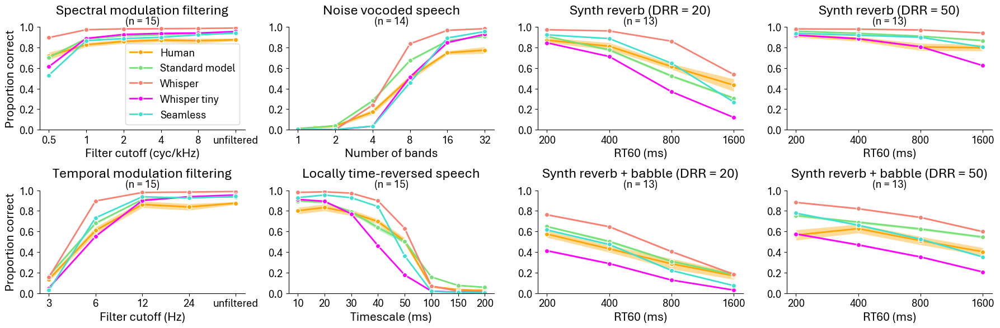

In [42]:
inds = [0, 7, -2, -1]
plt.figure(figsize=(18, 6))
plt.subplot(241)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)',
                         'Spectral modulation filtering', model_indices=inds, legend=True)
plt.subplot(245)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Temporal modulation filtering', model_indices=inds, legend=False)
plt.subplot(242)
plot_human_model_results('noise_vocoded', [1, 2, 4, 8, 16, 32], 'Number of bands', 
                                 'Noise vocoded speech', legend=False, model_indices=inds, plot_ylabel=False) 
plt.subplot(246)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=inds, plot_ylabel=False)
plt.subplot(243)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=inds, legend=False, plot_ylabel=False)
plt.subplot(244)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=inds, legend=False, plot_ylabel=False)
plt.subplot(247)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=inds, legend=False, plot_ylabel=False)
plt.subplot(248)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=inds, legend=False, plot_ylabel=False)
#plt.suptitle('Low pass modulation filtering', fontsize=16, y=1)
#plt.supylabel('Proportion correct', fontsize=16)
plt.tight_layout()

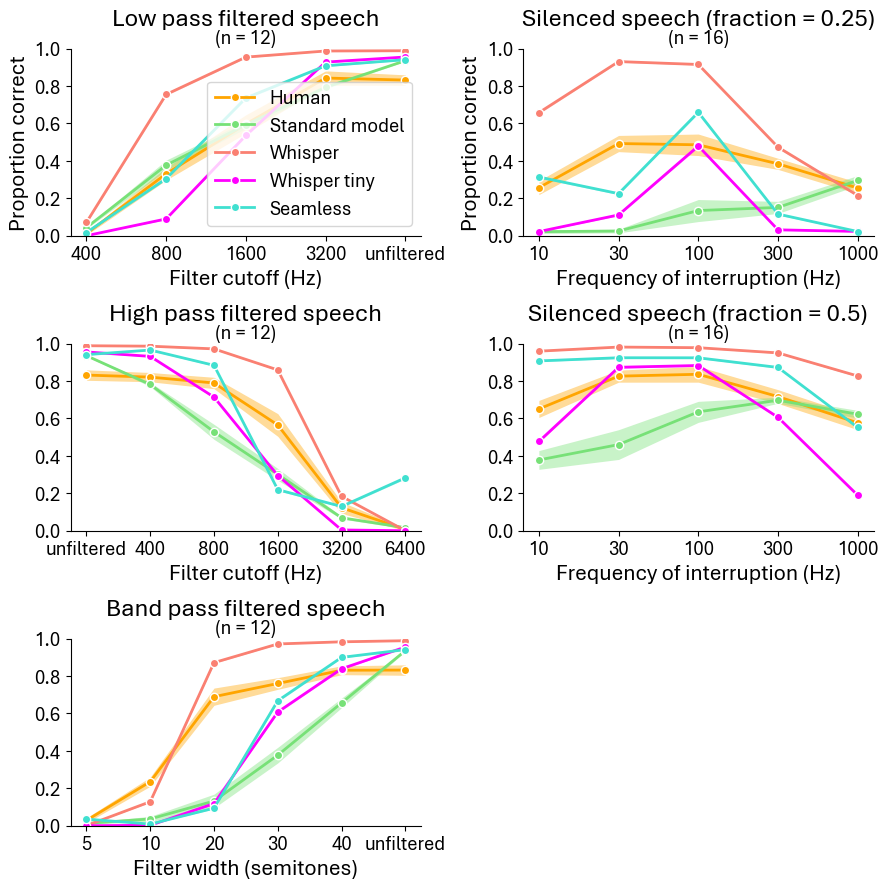

In [44]:
inds=[0, 7, -2, -1]
plt.figure(figsize=(9, 9))
plt.subplot(321)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Low pass filtered speech', model_indices=inds, legend=True)
plt.subplot(323)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
                         'High pass filtered speech', model_indices=inds, legend=False, plot_ylabel=False)
plt.subplot(325)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)',
                         'Band pass filtered speech', model_indices=inds, legend=False, plot_ylabel=False)
plt.subplot(322)
plot_human_model_results('silenced-0.75', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'Silenced speech (fraction = 0.25)', model_indices=inds, legend=False)
plt.subplot(324)
plot_human_model_results('silenced-0.5', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'Silenced speech (fraction = 0.5)', model_indices=inds, legend=False, plot_ylabel=False)
#plt.suptitle('Audio filtering', fontsize=16, y=1)
plt.tight_layout()

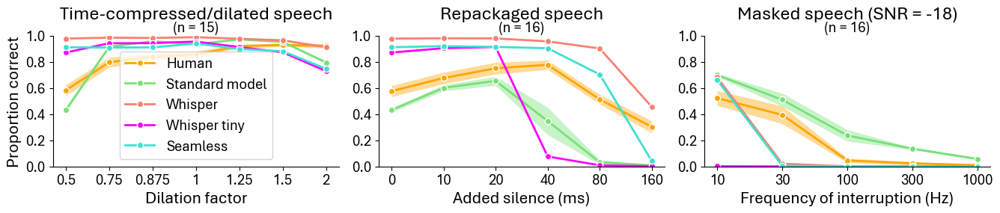

In [45]:
plt.figure(figsize=(13.5, 3))
plt.subplot(131)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=inds, legend=True)
plt.subplot(132)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)',
                         'Repackaged speech', model_indices=inds, legend=False, plot_ylabel=False)
plt.subplot(133)
plot_human_model_results('masked--18', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'Masked speech (SNR = -18)', model_indices=inds, legend=False, plot_ylabel=False)
plt.tight_layout()

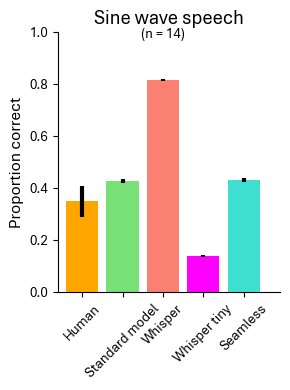

In [49]:
plt.figure(figsize=(3, 4))
plt.subplot(111)
plot_human_model_results_bar('sine_wave_speech',
                         'Sine wave speech', model_indices=inds, legend=True)
plt.tight_layout()

In [8]:
def plot_human_model_results_transpose(conditions, xticks, xax, title,
                             arch, name, dir_dst=dir_dst,
                             legend=True, line_formats=['o-']):
    # results should be formatted so that the shape is (conditions X subjects)
    results_m = {}
    results_se = {}
    for condition in conditions:
        results = np.load(f'{dir_dst}/{condition}/{arch}.npy')
        results_m[condition] = np.mean(results, axis=1)
        results_se[condition] = np.std(results, axis=1)
        
        
    x = np.arange(len(xticks))
    for cond, line_format in zip(conditions, line_formats):
#         plt.fill_between(x, results_m[cond]+results_se[cond], results_m[cond]-results_se[cond], color=colors[arch], lw=0, alpha=0.4)
        plt.errorbar(x, results_m[cond], yerr=results_se[cond], fmt=line_format, label=cond, color=colors[arch],lw=2)
#         plt.plot(x, results_m[cond], line_format, color=colors[arch], mec='white', lw=2, label=cond)
    plt.ylabel('Proportion correct')
    plt.xlabel(xax)
    plt.title(title, {'fontsize': 14})
    if legend:
        plt.legend()
    plt.ylim(0, 1)
    plt.xticks(x, xticks)
    prettifyAxes(plt.gca())

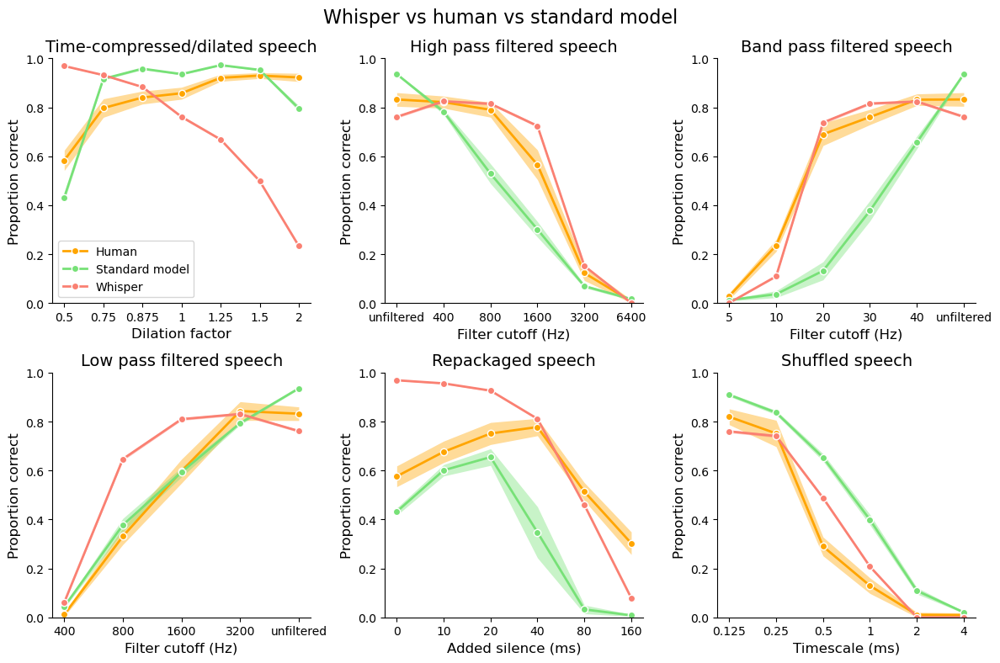

In [15]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=[0, 7], legend=True)
plt.subplot(232)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
                         'High pass filtered speech', model_indices=[0, 7], legend=False)
plt.subplot(233)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Band pass filtered speech', model_indices=[0, 7], legend=False)
plt.subplot(234)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Low pass filtered speech', model_indices=[0, 7], legend=False)
plt.subplot(235)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)', 
                             'Repackaged speech', legend=False, model_indices=[0, 7])
plt.subplot(236)
plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                             'Shuffled speech', legend=False, model_indices=[0, 7])
plt.suptitle('Whisper vs human vs standard model', fontsize=16)
plt.tight_layout()
conds = '''
bandpass dict_keys([5, 10, 20, 30, 40, 'unfiltered']) v
center_clipping dict_keys([0.0, 0.25, 0.5, 0.75, 0.9, 0.98]) v
cognitive_restoration dict_keys([10, 20, 30, 40, 50, 100, 150, 200]) 
compressed_dilated dict_keys([0.5, 0.75, 0.875, 1, 1.25, 1.5, 2.0]) v
highpass dict_keys(['unfiltered', 400, 800, 1600, 3200, 6400]) v
inharmonic dict_keys(['harm', 'jitt10', 'jitt30', 'jitt50']) 
lowpass dict_keys([400, 800, 1600, 3200, 'unfiltered']) v
peak_clipping dict_keys([0.0, 0.25, 0.5, 0.75, 0.9, 0.98]) v
repackaged dict_keys(['inf', 4.0, 2.0, 1.0, 0.5, 0.25]) v
shuffled dict_keys([0.125, 0.25, 0.5, 1.0, 2.0, 4.0]) v
specmod dict_keys([0.5, 1.0, 2.0, 4.0, 8.0, 'unfiltered']) v
tempmod dict_keys([3, 6, 12, 24, 'unfiltered']) v
'''

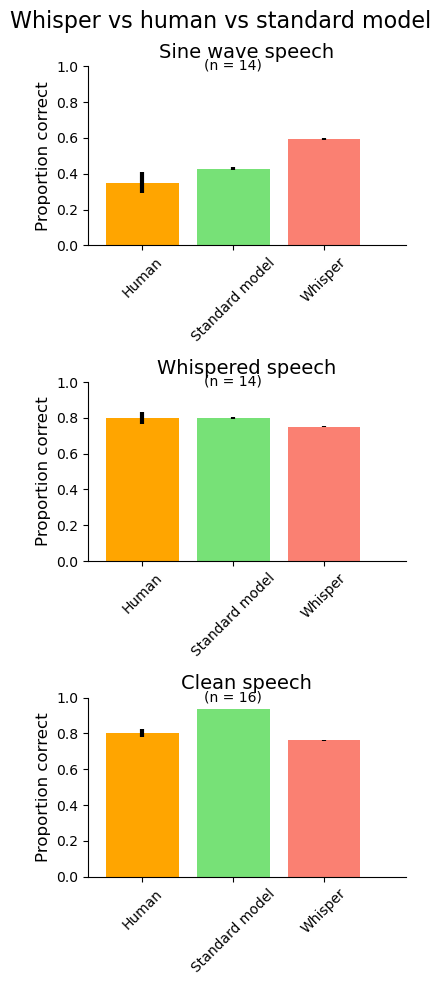

In [20]:
plt.figure(figsize=(4, 10))
plt.subplot(311)
plot_human_model_results_bar('sine_wave_speech',
                         'Sine wave speech', model_indices=[0, 7], legend=True)
plt.subplot(312)
plot_human_model_results_bar('whispered',
                         'Whispered speech', model_indices=[0, 7], legend=True)
plt.subplot(313)
plot_human_model_results_bar('clean', 'Clean speech', model_indices=[0, 7])
plt.suptitle('Whisper vs human vs standard model', fontsize=16)
plt.tight_layout()

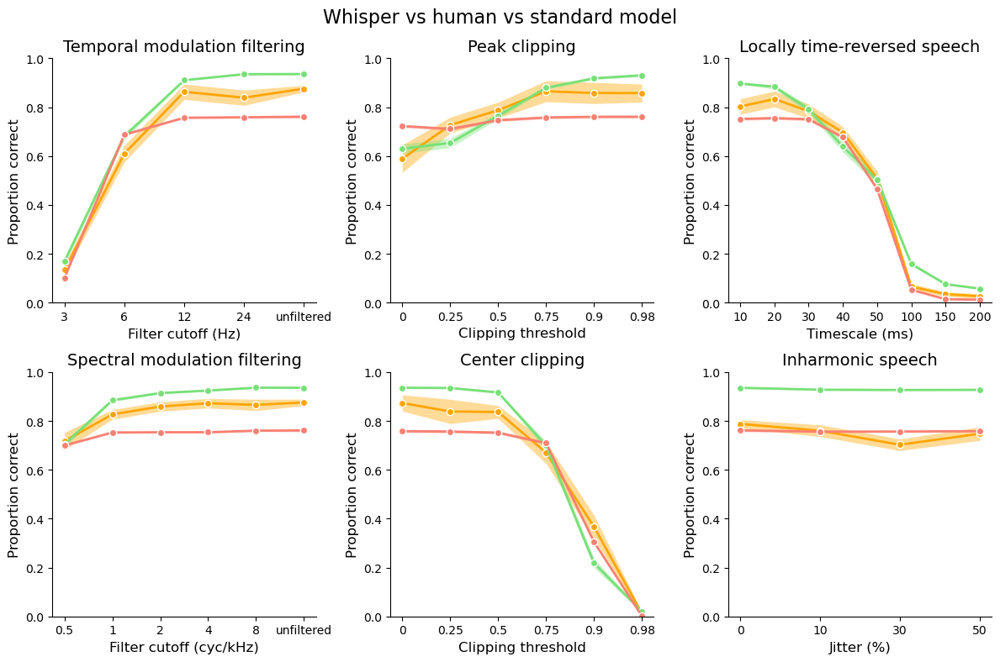

In [37]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Temporal modulation filtering', legend=False, model_indices=[0, 7])
plt.subplot(232)
plot_human_model_results('clipped-peak', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Peak clipping', legend=False, model_indices=[0, 7])
plt.subplot(233)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[0, 7])
plt.subplot(234)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)', 
                             'Spectral modulation filtering', legend=False, model_indices=[0, 7])
plt.subplot(235)
plot_human_model_results('clipped-center', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Center clipping', legend=False, model_indices=[0, 7])
plt.subplot(236)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=[0, 7])
plt.suptitle('Whisper vs human vs standard model', fontsize=16)
plt.tight_layout()

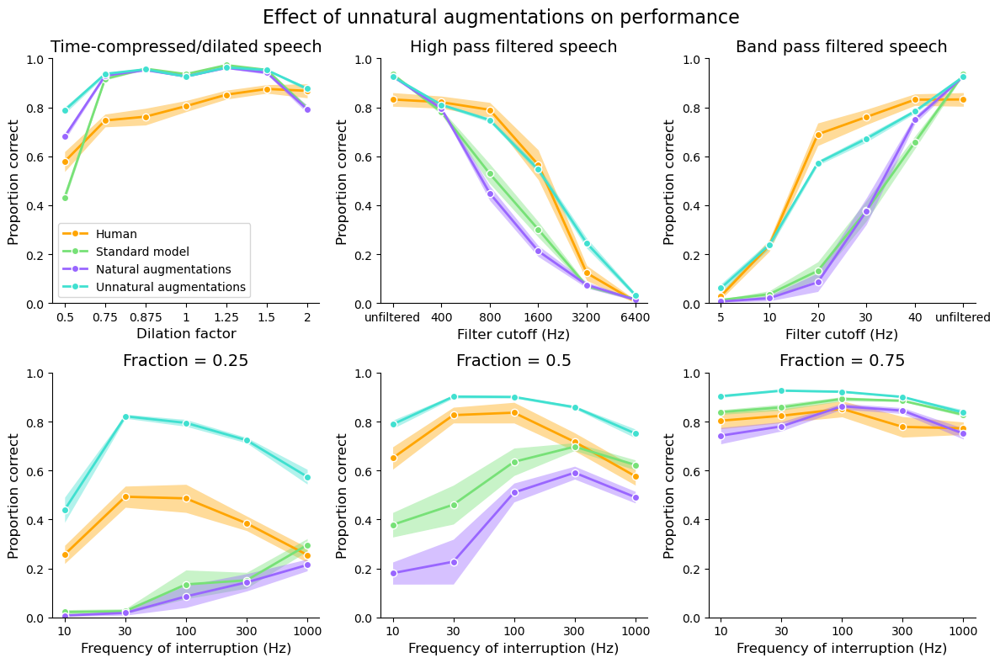

In [57]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=[0, 1, 5], legend=True)
plt.subplot(232)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
                         'High pass filtered speech', model_indices=[0, 1, 5], legend=False)
plt.subplot(233)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Band pass filtered speech', model_indices=[0, 1, 5], legend=False)
for i, frac in enumerate([0.75, 0.5, 0.25]):
    plt.subplot(234+i)
    plot_human_model_results(f'silenced-{frac}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Fraction = {1-frac}', legend=(i==8), model_indices=[0, 1, 5])
plt.suptitle('Effect of unnatural augmentations on performance', fontsize=16)
plt.tight_layout()

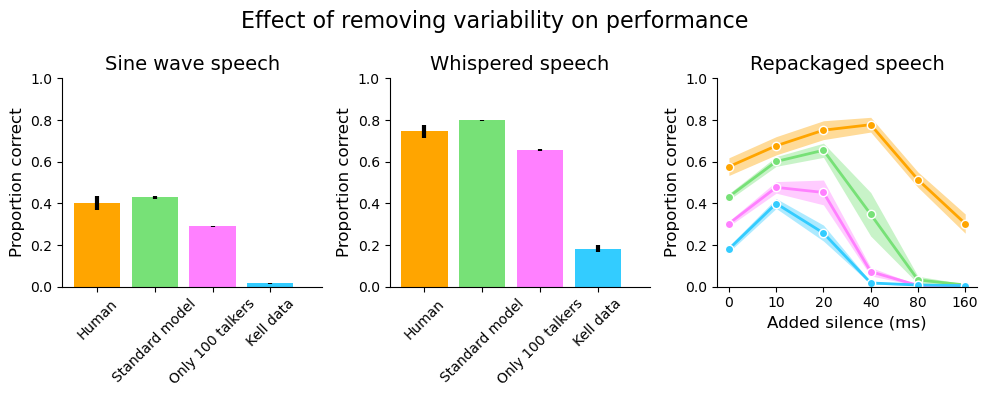

In [77]:
plt.figure(figsize=(10, 4))
plt.subplot(131)
plot_human_model_results_bar('sine_wave_speech',
                         'Sine wave speech', model_indices=[0, 3, 4], legend=True)
plt.subplot(132)
plot_human_model_results_bar('whispered',
                         'Whispered speech', model_indices=[0, 3, 4], legend=True)
plt.subplot(133)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)',
                         'Repackaged speech', model_indices=[0, 3, 4], legend=False)
plt.suptitle('Effect of removing variability on performance', fontsize=16)
plt.tight_layout()

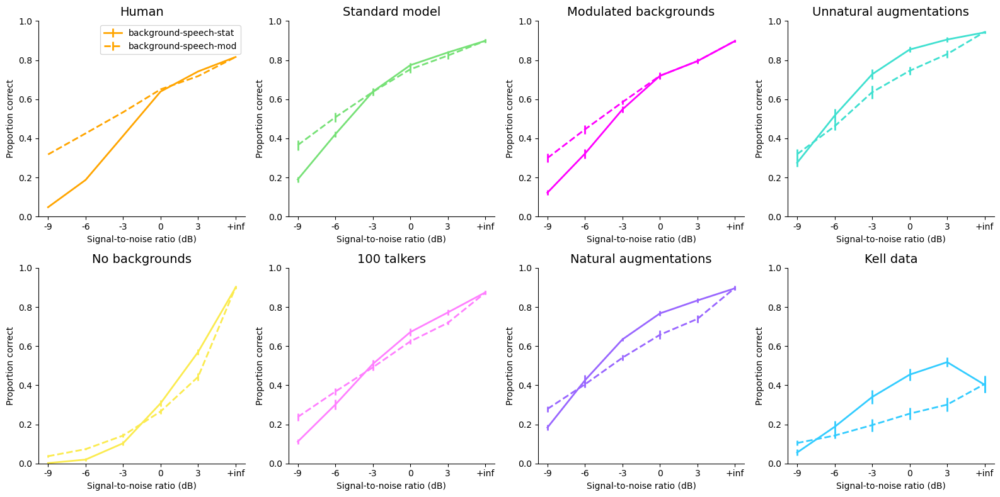

In [11]:
plt.figure(figsize=(16, 8))
plt.subplot(241)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'Human',
                                   'human', 'Human',
                          legend=True, line_formats = ['-', '--'])
plt.subplot(242)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'Standard model',
                                   'no_augs', 'Standard model',
                          legend=False, line_formats = ['-', '--'])
plt.subplot(243)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'Modulated backgrounds',
                                   'mod_bgs', 'Modulated backgrounds',
                          legend=False, line_formats = ['-', '--'])
plt.subplot(244)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'Unnatural augmentations',
                                   'extreme_augs_new', 'Unnatural augmentations',
                          legend=False, line_formats = ['-', '--'])
plt.subplot(245)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'No backgrounds',
                                   'no_bgs', 'No backgrounds',
                          legend=False, line_formats = ['-', '--'])
plt.subplot(246)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   '100 talkers',
                                   '100_talkers', '100 talkers',
                          legend=False, line_formats = ['-', '--'])
plt.subplot(247)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'Natural augmentations',
                                   'add_augs', 'Natural augmentations',
                          legend=False, line_formats = ['-', '--'])
plt.subplot(248)
plot_human_model_results_transpose(['background-speech-stat', 'background-speech-mod'], 
                                   [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                                   'Kell data',
                                   'kell_data', 'Kell data',
                          legend=False, line_formats = ['-', '--'])
plt.tight_layout()

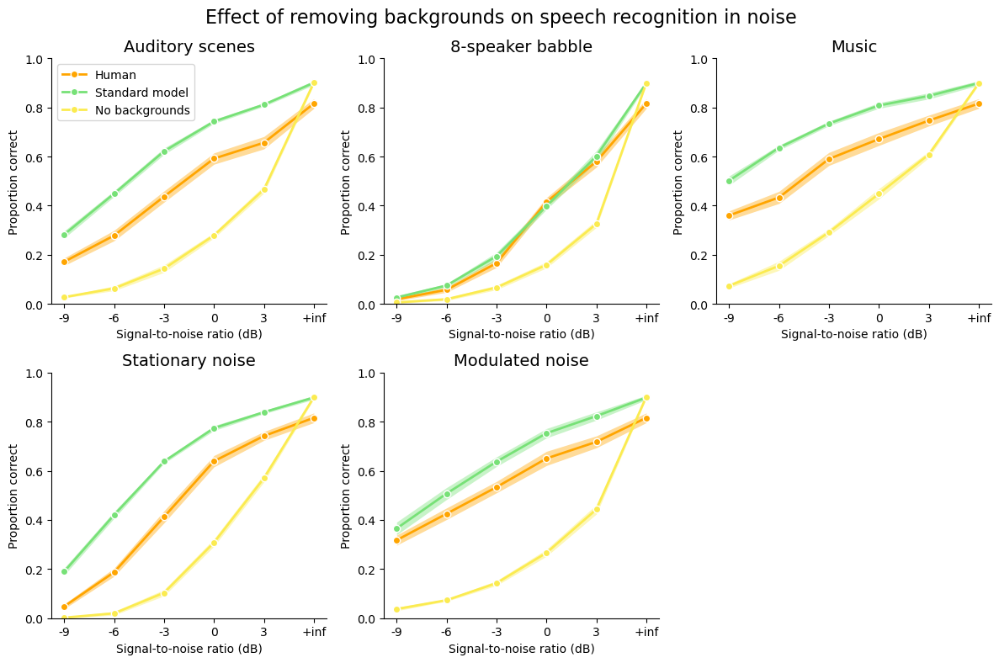

In [51]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plot_human_model_results('background-audscene', [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         'Auditory scenes', model_indices=[0, 2], legend=True)
plt.subplot(232)
plot_human_model_results('background-babble', [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         '8-speaker babble', model_indices=[0, 2], legend=False)
plt.subplot(233)
plot_human_model_results('background-music', [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         'Music', model_indices=[0, 2], legend=False)
plt.subplot(234)
plot_human_model_results('background-speech-stat', [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         'Stationary noise', model_indices=[0, 2], legend=False)
plt.subplot(235)
plot_human_model_results('background-speech-mod', [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         'Modulated noise', model_indices=[0, 2], legend=False)
plt.suptitle('Effect of removing backgrounds on speech recognition in noise', fontsize=16)
plt.tight_layout()

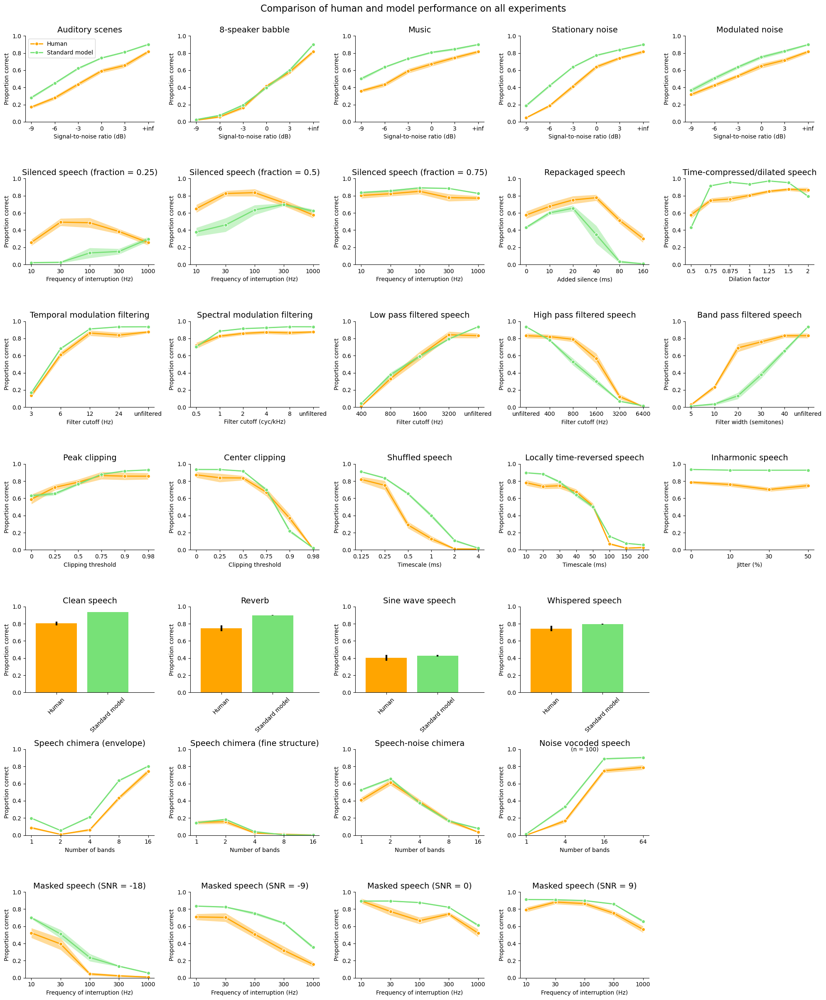

In [41]:
plt.figure(figsize=(20, 24))
for i, condition in enumerate(bg_conditions):
    plt.subplot(751+i)
    plot_human_model_results('background-' + condition, [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         bg_conditions[condition], model_indices=[0], legend=i==0)
for i, frac in enumerate([0.75, 0.5, 0.25]):
    plt.subplot(7,5,6+i)
    plot_human_model_results(f'silenced-{frac}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Silenced speech (fraction = {1-frac})', legend=False, model_indices=[0])
plt.subplot(7,5,9)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)', 
                             'Repackaged speech', legend=False, model_indices=[0])
plt.subplot(7,5,10)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor', 
                             'Time-compressed/dilated speech', legend=False, model_indices=[0])
plt.subplot(7,5,11)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Temporal modulation filtering', legend=False, model_indices=[0])
plt.subplot(7,5,12)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)', 
                             'Spectral modulation filtering', legend=False, model_indices=[0])
plt.subplot(7,5,13)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Low pass filtered speech', legend=False, model_indices=[0])
plt.subplot(7,5,14)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)', 
                             'High pass filtered speech', legend=False, model_indices=[0])
plt.subplot(7,5,15)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)', 
                             'Band pass filtered speech', legend=False, model_indices=[0])
plt.subplot(7,5,16)
plot_human_model_results('clipped-peak', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Peak clipping', legend=False, model_indices=[0])
plt.subplot(7,5,17)
plot_human_model_results('clipped-center', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Center clipping', legend=False, model_indices=[0])
plt.subplot(7,5,18)
plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                             'Shuffled speech', legend=False, model_indices=[0])
plt.subplot(7,5,19)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[0])
plt.subplot(7,5,20)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=[0])
plt.subplot(7,5,21)
plot_human_model_results_bar('clean', 'Clean speech', model_indices=[0])
plt.subplot(7,5,22)
plot_human_model_results_bar('reverb', 'Reverb', model_indices=[0])
plt.subplot(7,5,23)
plot_human_model_results_bar('sine_wave_speech', 'Sine wave speech', model_indices=[0])
plt.subplot(7,5,24)
plot_human_model_results_bar('whispered', 'Whispered speech', model_indices=[0])
plt.subplot(7,5,26)
plot_human_model_results('chimera-envelope', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (envelope)', legend=False, model_indices=[0])
plt.subplot(7,5,27)
plot_human_model_results('chimera-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (fine structure)', legend=False, model_indices=[0])
plt.subplot(7,5,28)
plot_human_model_results('chimera_noise-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech-noise chimera', legend=False, model_indices=[0])
plt.subplot(7,5,29)
plot_human_model_results('noise_vocoded', [1, 4, 16, 64], 'Number of bands', 
                             'Noise vocoded speech', legend=False, model_indices=[0], num_subjs=100)
for i, snr in enumerate([-18, -9, 0, 9]):
    plt.subplot(7,5,31+i)
    plot_human_model_results(f'masked-{snr}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Masked speech (SNR = {snr})', legend=False, model_indices=[0])    
    
plt.suptitle('Comparison of human and model performance on all experiments', fontsize=16, y=1)
plt.tight_layout()

In [14]:
len(bg_conditions) + len(conditions)

32

In [15]:
rt60s = json.load(open('../network_analyses_2023/scripts_to_generate_psychophysics_stim/reverb/conditions_to_rt60s.json'))

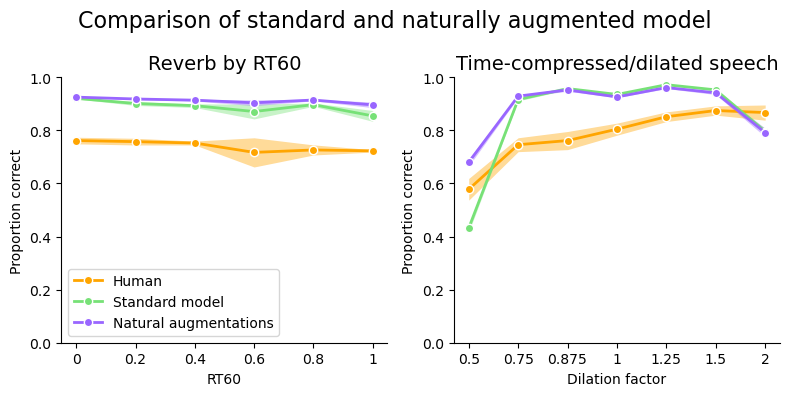

In [20]:
plt.figure(figsize=(8,4))
plt.subplot(121)
xticks = [0, 0.2, 0.4, 0.6, 0.8, 1]
xax = 'RT60'
title = 'Reverb by RT60'
x = np.arange(len(xticks))
for arch, name in zip(['human', 'no_augs', 'add_augs'], ['Human', 'Standard model', 'Natural augmentations']):
    bins = {0: [], 0.2: [], 0.4: [], 0.6: [], 0.8: [], 1: []}
    with open(f'{dir_dst}/reverb_by_cond/{arch}.json') as f:
        reverb_to_cond = json.load(f)
        for ir, acc in reverb_to_cond.items():
            if arch == 'human':
                acc = acc[0]
            if ir in rt60s:
                bins[min(1, np.floor(rt60s[ir]*5)/5)].append(acc)
    means = np.array([np.mean(bins[i]) for i in bins])
    ses = np.array([np.std(bins[i])/np.sqrt(len(bins[i])) for i in bins])
    plt.fill_between(x, means+ses, means-ses, color=colors[arch], lw=0, alpha=0.4)
    plt.plot(x, means, 'o-', color=colors[arch], mec='white', lw=2, label=name)
plt.ylabel('Proportion correct')
plt.xlabel(xax)
plt.title(title, {'fontsize': 14})
plt.legend()
plt.ylim(0, 1)
plt.xticks(x, xticks)
prettifyAxes(plt.gca())

plt.subplot(122)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=[0, 1], legend=False)
plt.suptitle('Comparison of standard and naturally augmented model', fontsize=16)
plt.tight_layout()

In [11]:
sorted(rt60s)

['1',
 '10',
 '100',
 '101',
 '103',
 '104',
 '105',
 '106',
 '107',
 '108',
 '109',
 '11',
 '110',
 '111',
 '112',
 '113',
 '114',
 '115',
 '116',
 '117',
 '118',
 '119',
 '12',
 '120',
 '121',
 '122',
 '123',
 '124',
 '125',
 '126',
 '127',
 '128',
 '129',
 '13',
 '130',
 '131',
 '132',
 '133',
 '134',
 '135',
 '136',
 '137',
 '138',
 '139',
 '14',
 '140',
 '141',
 '142',
 '143',
 '144',
 '145',
 '146',
 '147',
 '148',
 '149',
 '15',
 '150',
 '151',
 '152',
 '153',
 '154',
 '155',
 '156',
 '157',
 '158',
 '159',
 '16',
 '160',
 '161',
 '162',
 '163',
 '164',
 '165',
 '166',
 '167',
 '168',
 '169',
 '17',
 '170',
 '171',
 '172',
 '173',
 '174',
 '175',
 '176',
 '177',
 '178',
 '179',
 '18',
 '180',
 '181',
 '182',
 '183',
 '184',
 '185',
 '186',
 '187',
 '188',
 '189',
 '190',
 '191',
 '192',
 '193',
 '194',
 '195',
 '196',
 '197',
 '198',
 '199',
 '2',
 '20',
 '200',
 '201',
 '202',
 '203',
 '204',
 '205',
 '206',
 '207',
 '208',
 '209',
 '21',
 '210',
 '211',
 '212',
 '213',
 '214',

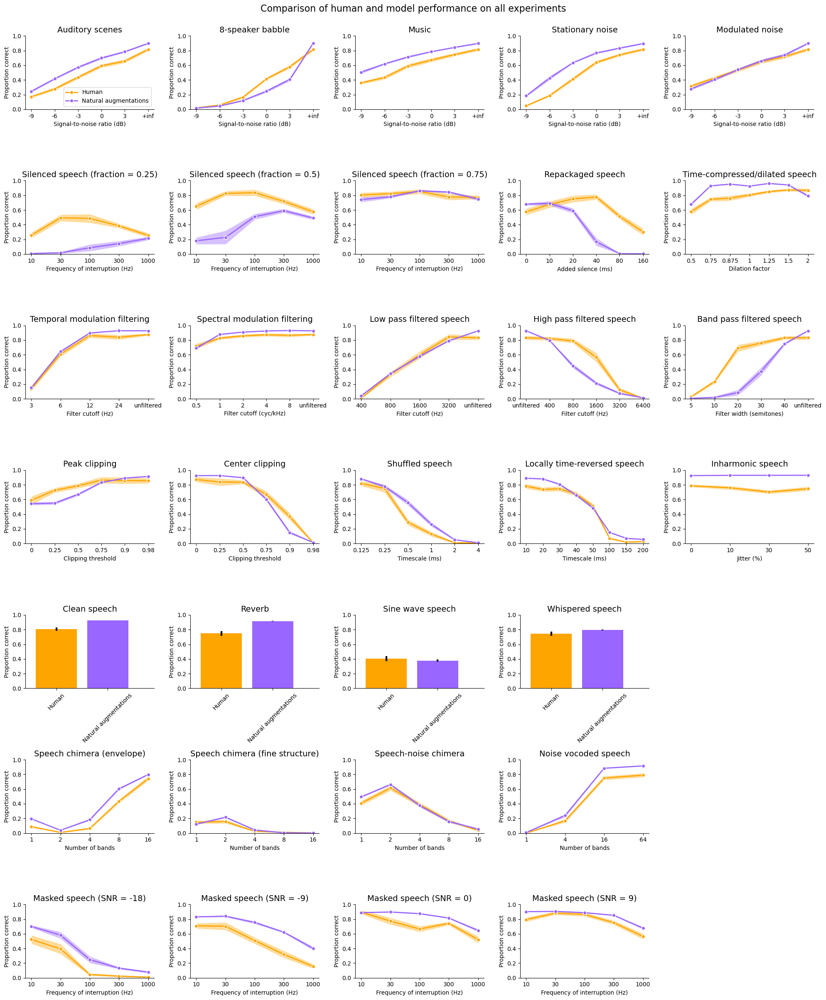

In [8]:
plt.figure(figsize=(20, 24))
for i, condition in enumerate(bg_conditions):
    plt.subplot(751+i)
    plot_human_model_results('background-' + condition, [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         bg_conditions[condition], model_indices=[1], legend=i==0)
for i, frac in enumerate([0.75, 0.5, 0.25]):
    plt.subplot(7,5,6+i)
    plot_human_model_results(f'silenced-{frac}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Silenced speech (fraction = {1-frac})', legend=False, model_indices=[1])
plt.subplot(7,5,9)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)', 
                             'Repackaged speech', legend=False, model_indices=[1])
plt.subplot(7,5,10)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor', 
                             'Time-compressed/dilated speech', legend=False, model_indices=[1])
plt.subplot(7,5,11)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Temporal modulation filtering', legend=False, model_indices=[1])
plt.subplot(7,5,12)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)', 
                             'Spectral modulation filtering', legend=False, model_indices=[1])
plt.subplot(7,5,13)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Low pass filtered speech', legend=False, model_indices=[1])
plt.subplot(7,5,14)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)', 
                             'High pass filtered speech', legend=False, model_indices=[1])
plt.subplot(7,5,15)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)', 
                             'Band pass filtered speech', legend=False, model_indices=[1])
plt.subplot(7,5,16)
plot_human_model_results('clipped-peak', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Peak clipping', legend=False, model_indices=[1])
plt.subplot(7,5,17)
plot_human_model_results('clipped-center', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Center clipping', legend=False, model_indices=[1])
plt.subplot(7,5,18)
plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                             'Shuffled speech', legend=False, model_indices=[1])
plt.subplot(7,5,19)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[1])
plt.subplot(7,5,20)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=[1])
plt.subplot(7,5,21)
plot_human_model_results_bar('clean', 'Clean speech', model_indices=[1])
plt.subplot(7,5,22)
plot_human_model_results_bar('reverb', 'Reverb', model_indices=[1])
plt.subplot(7,5,23)
plot_human_model_results_bar('sine_wave_speech', 'Sine wave speech', model_indices=[1])
plt.subplot(7,5,24)
plot_human_model_results_bar('whispered', 'Whispered speech', model_indices=[1])
plt.subplot(7,5,26)
plot_human_model_results('chimera-envelope', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (envelope)', legend=False, model_indices=[1])
plt.subplot(7,5,27)
plot_human_model_results('chimera-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (fine structure)', legend=False, model_indices=[1])
plt.subplot(7,5,28)
plot_human_model_results('chimera_noise-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech-noise chimera', legend=False, model_indices=[1])
plt.subplot(7,5,29)
plot_human_model_results('noise_vocoded', [1, 4, 16, 64], 'Number of bands', 
                             'Noise vocoded speech', legend=False, model_indices=[1])
for i, snr in enumerate([-18, -9, 0, 9]):
    plt.subplot(7,5,31+i)
    plot_human_model_results(f'masked-{snr}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Masked speech (SNR = {snr})', legend=False, model_indices=[1])    
    
plt.suptitle('Comparison of human and model performance on all experiments', fontsize=16, y=1)
plt.tight_layout()

In [23]:
def all_plots(model_indices):
    plt.figure(figsize=(20, 24))
    for i, condition in enumerate(bg_conditions):
        plt.subplot(751+i)
        plot_human_model_results('background-' + condition, [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                             bg_conditions[condition], model_indices=model_indices, legend=i==0)
    for i, frac in enumerate([0.75, 0.5, 0.25]):
        plt.subplot(7,5,6+i)
        plot_human_model_results(f'silenced-{frac}', 
                                 [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                                 f'Silenced speech (fraction = {1-frac})', legend=False, model_indices=model_indices)
    plt.subplot(7,5,9)
    plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)', 
                                 'Repackaged speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,10)
    plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor', 
                                 'Time-compressed/dilated speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,11)
    plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)', 
                                 'Temporal modulation filtering', legend=False, model_indices=model_indices)
    plt.subplot(7,5,12)
    plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)', 
                                 'Spectral modulation filtering', legend=False, model_indices=model_indices)
    plt.subplot(7,5,13)
    plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)', 
                                 'Low pass filtered speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,14)
    plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)', 
                                 'High pass filtered speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,15)
    plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)', 
                                 'Band pass filtered speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,16)
    plot_human_model_results('clipped-peak', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                                 'Peak clipping', legend=False, model_indices=model_indices)
    plt.subplot(7,5,17)
    plot_human_model_results('clipped-center', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                                 'Center clipping', legend=False, model_indices=model_indices)
    plt.subplot(7,5,18)
    plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                                 'Shuffled speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,19)
    plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                                 'Locally time-reversed speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,20)
    plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                                 'Inharmonic speech', legend=False, model_indices=model_indices)
    plt.subplot(7,5,21)
    plot_human_model_results_bar('clean', 'Clean speech', model_indices=model_indices)
    plt.subplot(7,5,22)
    plot_human_model_results_bar('reverb', 'Reverb', model_indices=model_indices)
    plt.subplot(7,5,23)
    plot_human_model_results_bar('sine_wave_speech', 'Sine wave speech', model_indices=model_indices)
    plt.subplot(7,5,24)
    plot_human_model_results_bar('whispered', 'Whispered speech', model_indices=model_indices)
    plt.subplot(7,5,26)
    plot_human_model_results('chimera-envelope', [1, 2, 4, 8, 16], 'Number of bands', 
                                 'Speech chimera (envelope)', legend=False, model_indices=model_indices)
    plt.subplot(7,5,27)
    plot_human_model_results('chimera-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                                 'Speech chimera (fine structure)', legend=False, model_indices=model_indices)
    plt.subplot(7,5,28)
    plot_human_model_results('chimera_noise-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                                 'Speech-noise chimera', legend=False, model_indices=model_indices)
    plt.subplot(7,5,29)
    plot_human_model_results('noise_vocoded', [1, 4, 16, 64], 'Number of bands', 
                                 'Noise vocoded speech', legend=False, model_indices=model_indices)
    for i, snr in enumerate([-18, -9, 0, 9]):
        plt.subplot(7,5,31+i)
        plot_human_model_results(f'masked-{snr}', 
                                 [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                                 f'Masked speech (SNR = {snr})', legend=False, model_indices=model_indices)    

    plt.suptitle('Comparison of human and model performance on all experiments', fontsize=16, y=1)
    plt.tight_layout()

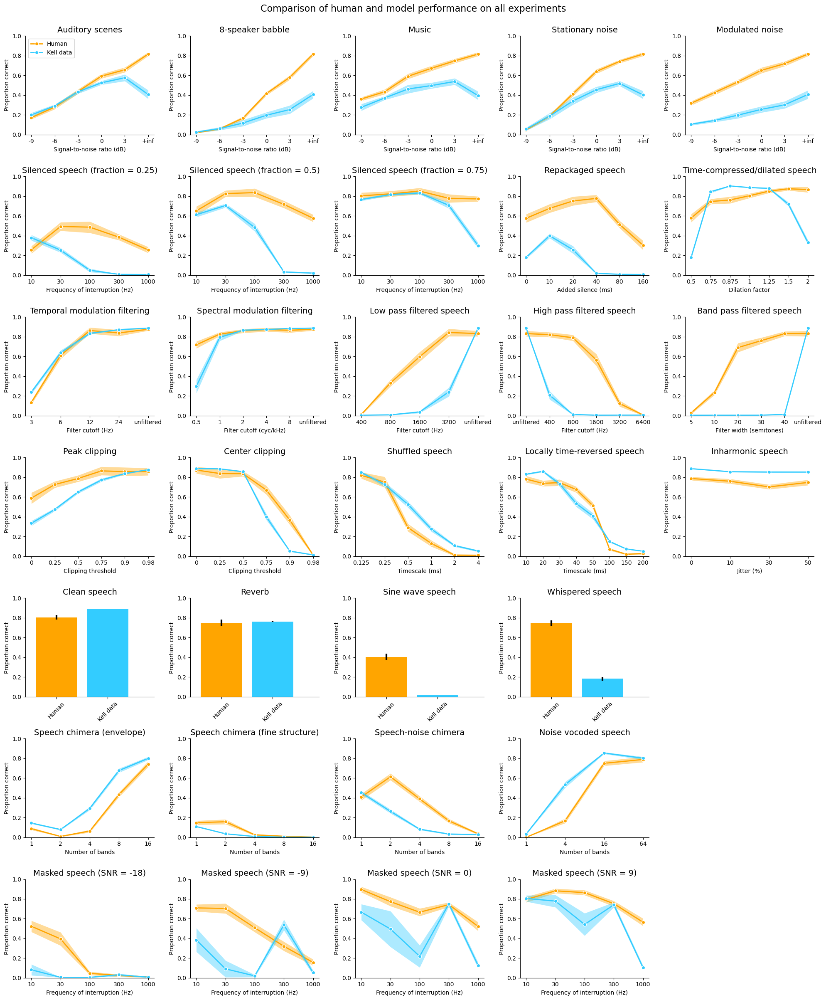

In [26]:
all_plots([4])

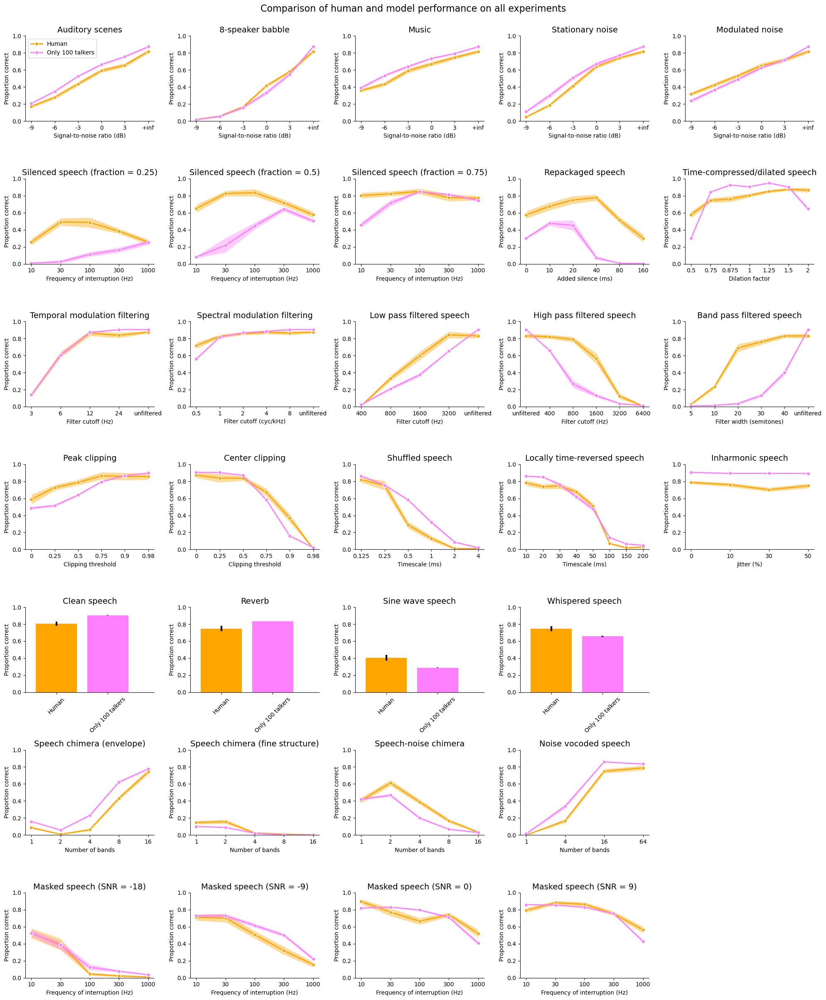

In [27]:
all_plots([3])

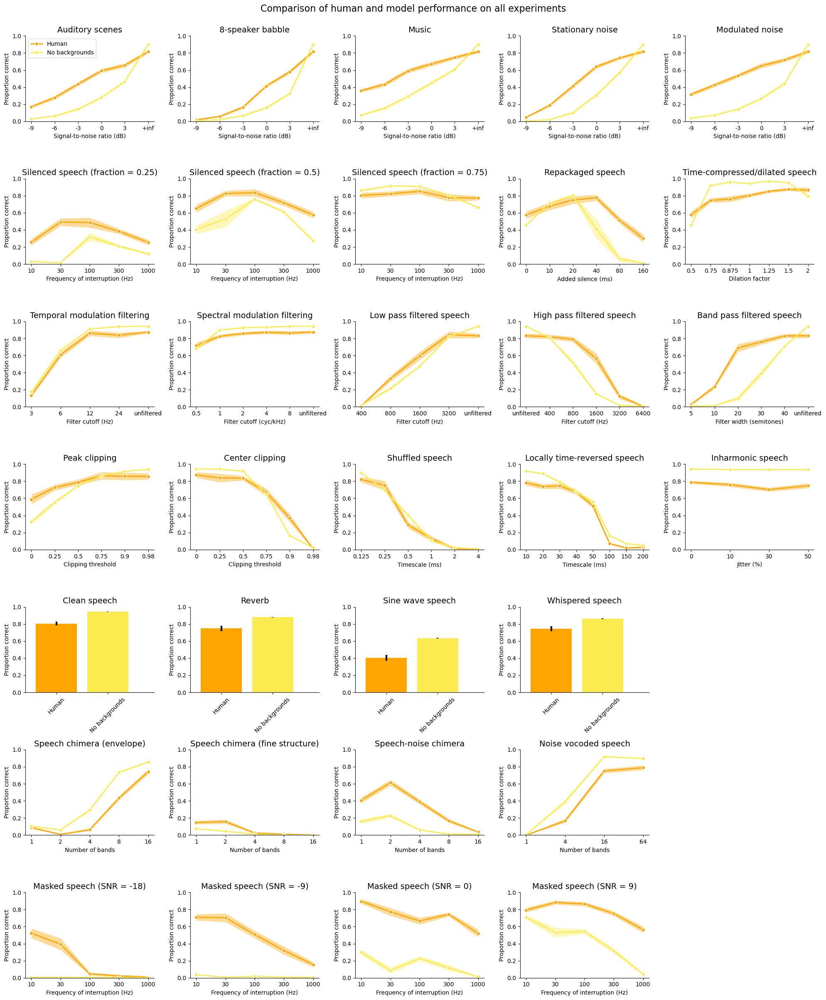

In [28]:
all_plots([2])

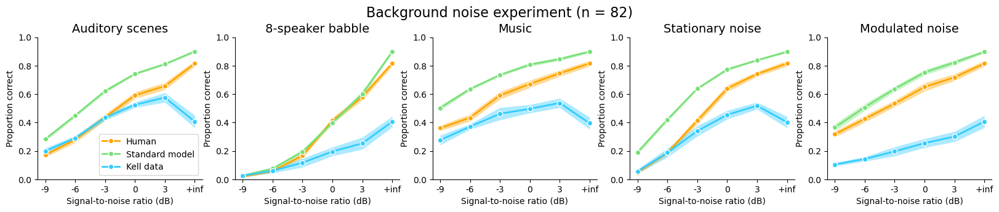

In [31]:
plt.figure(figsize=(20, 3))
for i, condition in enumerate(bg_conditions):
    plt.subplot(151+i)
    plot_human_model_results('background-' + condition, [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         bg_conditions[condition], model_indices=[0,4], legend=i==0)
plt.suptitle('Background noise experiment (n = 82)', fontsize=16, y=1.05)
plt.show()

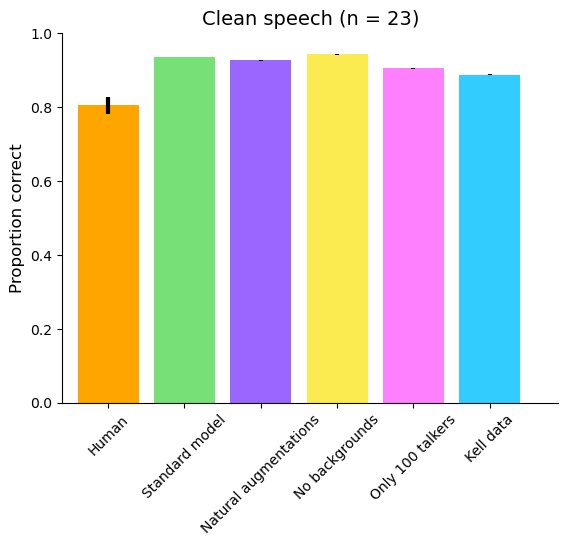

In [25]:
plot_human_model_results_bar('clean', 'Clean speech (n = 23)', model_indices=[0,1,2,3,4])

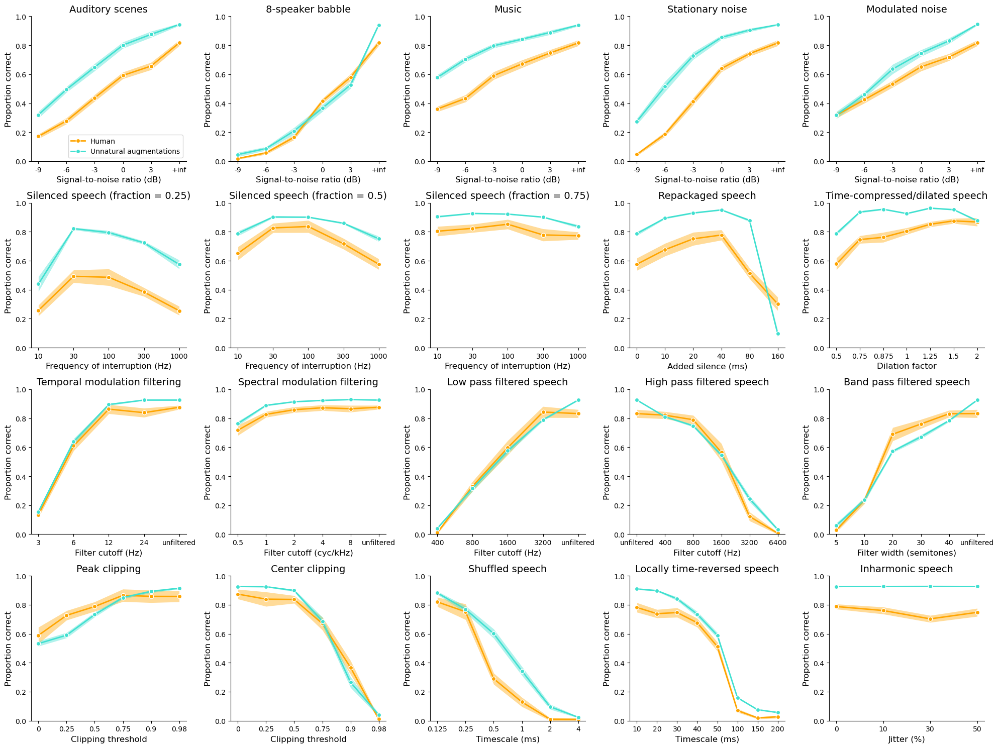

In [46]:
plt.figure(figsize=(20, 15))
for i, condition in enumerate(bg_conditions):
    plt.subplot(451+i)
    plot_human_model_results('background-' + condition, [-9, -6, -3, 0, 3, '+inf'], 'Signal-to-noise ratio (dB)',
                         bg_conditions[condition], model_indices=[6], legend=i==0)
for i, frac in enumerate([0.75, 0.5, 0.25]):
    plt.subplot(4,5,6+i)
    plot_human_model_results(f'silenced-{frac}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Silenced speech (fraction = {1-frac})', legend=False, model_indices=[6])
plt.subplot(4,5,9)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)', 
                             'Repackaged speech', legend=False, model_indices=[6])
plt.subplot(4,5,10)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor', 
                             'Time-compressed/dilated speech', legend=False, model_indices=[6])
plt.subplot(4,5,11)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Temporal modulation filtering', legend=False, model_indices=[6])
plt.subplot(4,5,12)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)', 
                             'Spectral modulation filtering', legend=False, model_indices=[6])
plt.subplot(4,5,13)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)', 
                             'Low pass filtered speech', legend=False, model_indices=[6])
plt.subplot(4,5,14)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)', 
                             'High pass filtered speech', legend=False, model_indices=[6])
plt.subplot(4,5,15)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)', 
                             'Band pass filtered speech', legend=False, model_indices=[6])
plt.subplot(4,5,16)
plot_human_model_results('clipped-peak', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Peak clipping', legend=False, model_indices=[6])
plt.subplot(4,5,17)
plot_human_model_results('clipped-center', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Center clipping', legend=False, model_indices=[6])
plt.subplot(4,5,18)
plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                             'Shuffled speech', legend=False, model_indices=[6])
plt.subplot(4,5,19)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[6])
plt.subplot(4,5,20)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=[6])   
    
#plt.suptitle('Comparison of human and model performance on all experiments', fontsize=16, y=1)
plt.tight_layout()

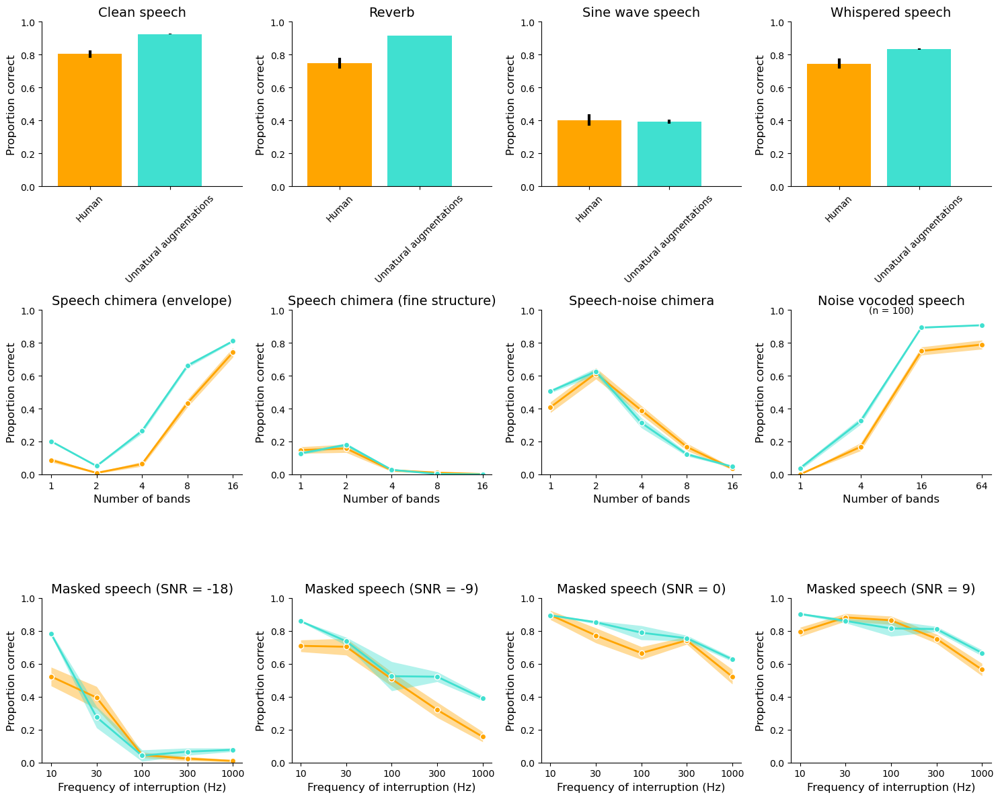

In [47]:
plt.figure(figsize=(15, 12))
plt.subplot(3,4,1)
plot_human_model_results_bar('clean', 'Clean speech', model_indices=[6])
plt.subplot(3,4,2)
plot_human_model_results_bar('reverb', 'Reverb', model_indices=[6])
plt.subplot(3,4,3)
plot_human_model_results_bar('sine_wave_speech', 'Sine wave speech', model_indices=[6])
plt.subplot(3,4,4)
plot_human_model_results_bar('whispered', 'Whispered speech', model_indices=[6])
plt.subplot(3,4,5)
plot_human_model_results('chimera-envelope', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (envelope)', legend=False, model_indices=[6])
plt.subplot(3,4,6)
plot_human_model_results('chimera-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (fine structure)', legend=False, model_indices=[6])
plt.subplot(3,4,7)
plot_human_model_results('chimera_noise-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech-noise chimera', legend=False, model_indices=[6])
plt.subplot(3,4,8)
plot_human_model_results('noise_vocoded', [1, 4, 16, 64], 'Number of bands', 
                             'Noise vocoded speech', legend=False, model_indices=[6], num_subjs=100)
for i, snr in enumerate([-18, -9, 0, 9]):
    plt.subplot(3,4,9+i)
    plot_human_model_results(f'masked-{snr}', 
                             [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)', 
                             f'Masked speech (SNR = {snr})', legend=False, model_indices=[6])    
    
#plt.suptitle('Comparison of human and model performance on all experiments', fontsize=16, y=1)
plt.tight_layout()

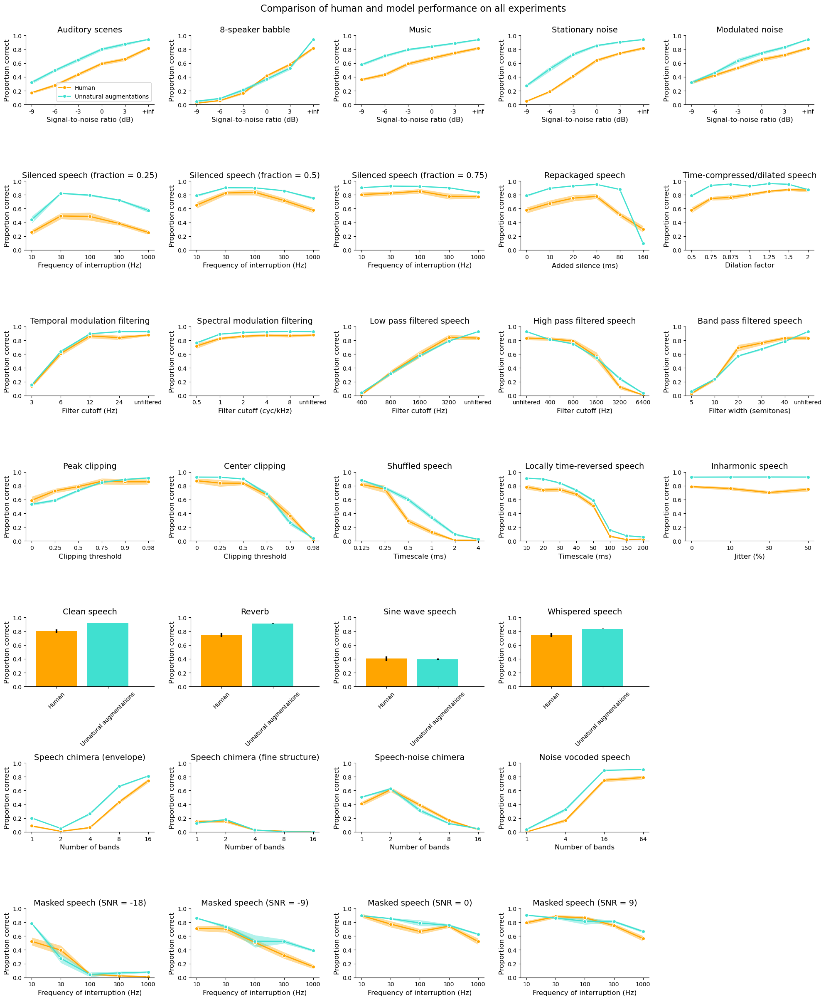

In [27]:
all_plots([6])

In [5]:
textures_human = pd.read_csv('/om2/user/msaddler/phaselocknet/data/human/spkr_word_recognition/word_recognition_in_different_auditory_textures.csv')

In [17]:
human_means = list(textures_human.groupby('index_texture').agg({'correct_word': 'mean'})['correct_word'])

In [18]:
human_means

[0.38015873015873014,
 0.31492063492063493,
 0.7844729344729345,
 0.7053619821912505,
 0.4247123015873016,
 0.5132464096749811,
 0.3923034330011074,
 0.4250730994152047,
 0.7059821428571429,
 0.539766081871345,
 0.5084785133565621,
 0.5322202864885792,
 0.7477579365079365,
 0.6044159544159544,
 0.8011607142857142,
 0.5952477739063105,
 0.44764880952380953,
 0.3832171893147503,
 0.7467105263157895,
 0.5298511904761904,
 0.4955128205128205,
 0.3646087117017349,
 0.45739723239723235,
 0.7540674603174603,
 0.6022938443670152,
 0.5119918699186992,
 0.5797434477667036,
 0.3664199914199914,
 0.25201388888888887,
 0.7078892668178383,
 0.3856620718462824,
 0.4813888888888889,
 0.4319444444444444,
 0.3591676841676842,
 0.329484126984127,
 0.6895706145706146,
 0.5424414210128495,
 0.6052401302401302,
 0.3893055555555555,
 0.27936507936507937,
 0.4240277777777778,
 0.3509485094850949,
 0.4038220551378446]

In [19]:
model_results = np.load(f'{dir_dst}/43_textures/100_talkers.npy')

In [20]:
model_results

array([[0.4893617 , 0.48404255, 0.46542553, 0.47074468, 0.50265957,
        0.46276596, 0.47340426, 0.44414894, 0.50265957],
       [0.37765957, 0.37234043, 0.40159574, 0.36702128, 0.3962766 ,
        0.40691489, 0.39361702, 0.37765957, 0.40957447],
       [0.83510638, 0.8537234 , 0.83510638, 0.84308511, 0.84840426,
        0.83510638, 0.82978723, 0.84042553, 0.85638298],
       [0.68617021, 0.68085106, 0.70212766, 0.67819149, 0.71010638,
        0.69946809, 0.71276596, 0.70212766, 0.69148936],
       [0.55319149, 0.53723404, 0.54255319, 0.53989362, 0.55585106,
        0.54521277, 0.54521277, 0.52659574, 0.57712766],
       [0.61702128, 0.59840426, 0.62234043, 0.59042553, 0.60106383,
        0.59840426, 0.59042553, 0.58776596, 0.6462766 ],
       [0.52925532, 0.56117021, 0.54255319, 0.53457447, 0.49734043,
        0.54521277, 0.54521277, 0.53457447, 0.51595745],
       [0.5106383 , 0.51329787, 0.50265957, 0.49468085, 0.5       ,
        0.50797872, 0.49734043, 0.46276596, 0.48138298],


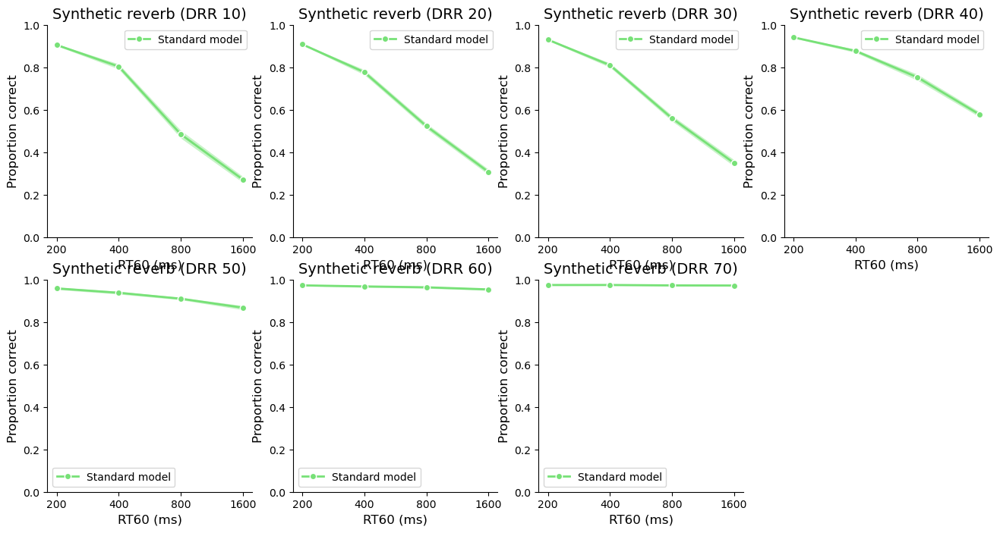

In [8]:
plt.figure(figsize=(16, 8))

for i in range(7):
    plt.subplot(241+i)
    plot_human_model_results(f'synth_reverb-{10*(i+1)}', [200, 400, 800, 1600], 'RT60 (ms)',
                             f'Synthetic reverb (DRR {10*(i+1)})', model_indices=[0], legend=True, plot_human=False)

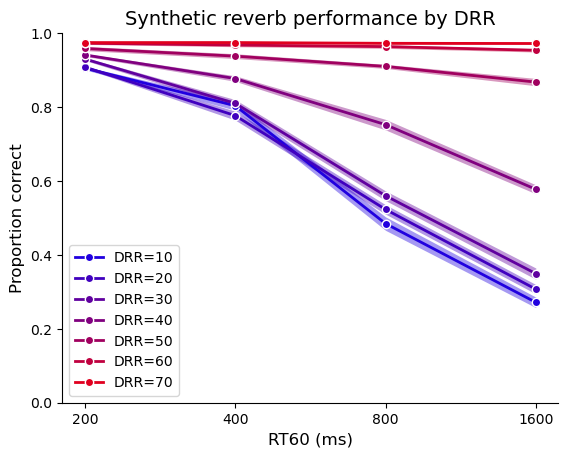

In [12]:
archs = ['no_augs'] 
names = ['Standard model']
xticks = [200, 400, 800, 1600]
for i in range(1, 8):
    drr = 10*i
    model_m = {}
    model_se = {}
    for arch in archs:
        model_results = np.load(f'{dir_dst}/synth_reverb-{drr}/{arch}.npy')
        model_m[arch] = np.mean(model_results, axis=1)
        model_se[arch] = np.std(model_results, axis=1) 

    x = np.arange(len(xticks))
    for arch, name in zip(archs, names):
        plt.fill_between(x, model_m[arch]+model_se[arch], model_m[arch]-model_se[arch], color=[i*32/255,0,1-i*32/255], lw=0, alpha=0.4)
        plt.plot(x, model_m[arch], 'o-', color=[i*32/255,0,1-i*32/255], mec='white', lw=2, label=f'DRR={drr}')
plt.ylabel('Proportion correct', {'fontsize': 12})
plt.xlabel('RT60 (ms)', {'fontsize': 12})
plt.title('Synthetic reverb performance by DRR', {'fontsize': 14})
plt.legend()
plt.ylim(0, 1)
plt.xticks(x, xticks)
prettifyAxes(plt.gca())

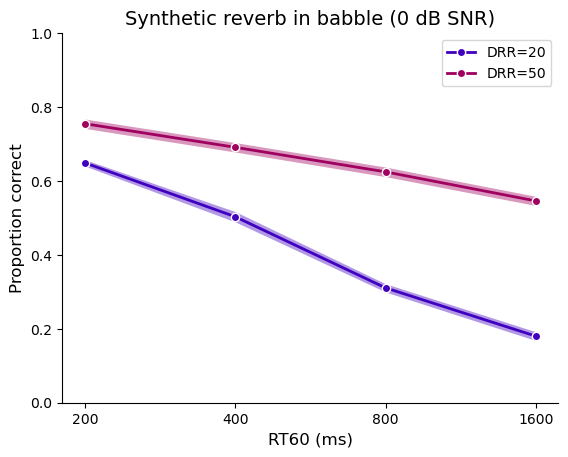

In [7]:
archs = ['no_augs'] 
names = ['Standard model']
xticks = [200, 400, 800, 1600]
for i in [2, 5]:
    drr = 10*i
    model_m = {}
    model_se = {}
    for arch in archs:
        model_results = np.load(f'{dir_dst}/synth_reverb_babble_0dB-{drr}/{arch}.npy')
        model_m[arch] = np.mean(model_results, axis=1)
        model_se[arch] = np.std(model_results, axis=1) 

    x = np.arange(len(xticks))
    for arch, name in zip(archs, names):
        plt.fill_between(x, model_m[arch]+model_se[arch], model_m[arch]-model_se[arch], color=[i*32/255,0,1-i*32/255], lw=0, alpha=0.4)
        plt.plot(x, model_m[arch], 'o-', color=[i*32/255,0,1-i*32/255], mec='white', lw=2, label=f'DRR={drr}')
plt.ylabel('Proportion correct', {'fontsize': 12})
plt.xlabel('RT60 (ms)', {'fontsize': 12})
plt.title('Synthetic reverb in babble (0 dB SNR)', {'fontsize': 14})
plt.legend()
plt.ylim(0, 1)
plt.xticks(x, xticks)
prettifyAxes(plt.gca())

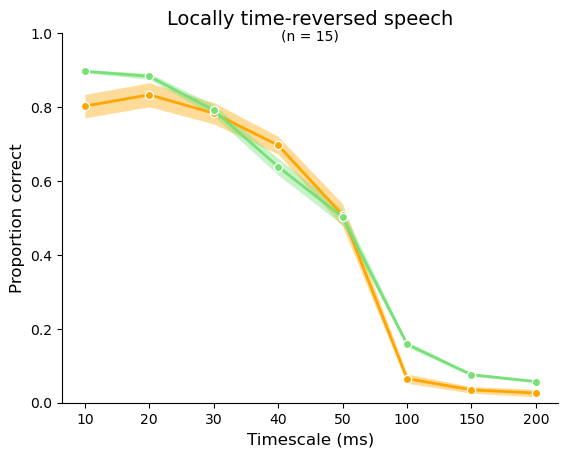

In [21]:
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[0])

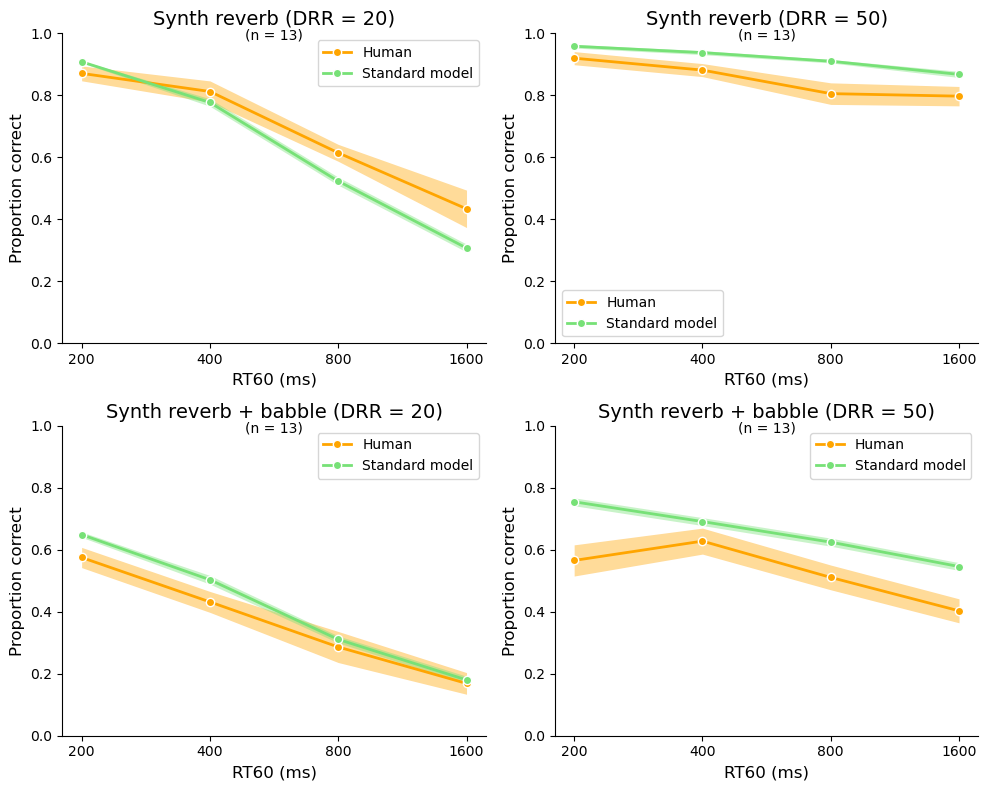

In [22]:
plt.figure(figsize=(10, 8))
plt.subplot(221)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=[0], legend=True)
plt.subplot(222)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=[0], legend=True)
plt.subplot(223)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=[0], legend=True)
plt.subplot(224)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=[0], legend=True)
plt.tight_layout()

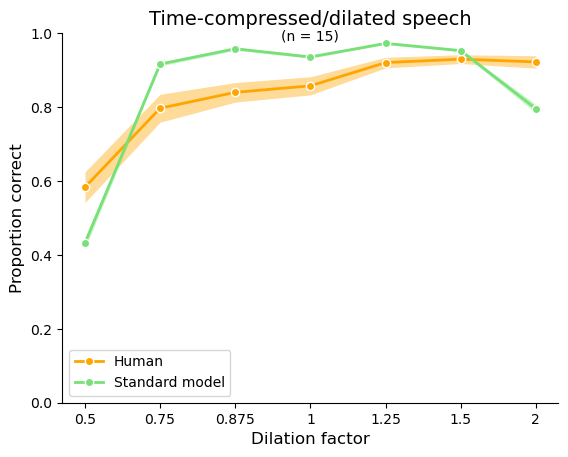

In [23]:

plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=[0], legend=True)


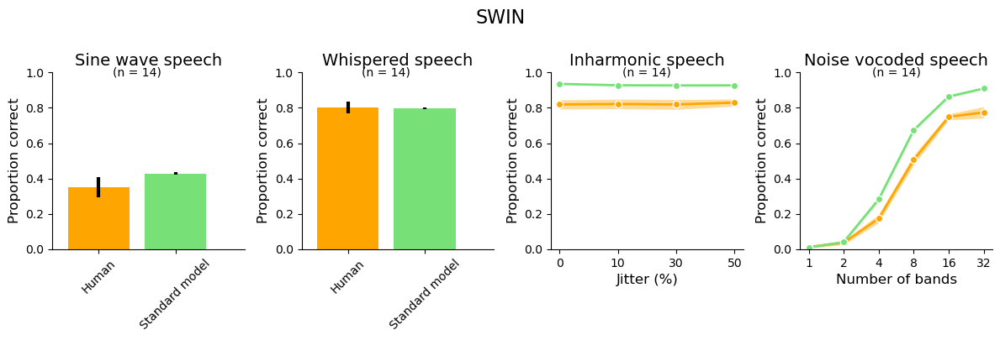

In [24]:
plt.figure(figsize=(12, 4))
plt.subplot(141)
plot_human_model_results_bar('sine_wave_speech',
                         'Sine wave speech', model_indices=[0], legend=True)
plt.subplot(142)
plot_human_model_results_bar('whispered',
                         'Whispered speech', model_indices=[0], legend=True)
plt.subplot(143)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=[0]) 
plt.subplot(144)
plot_human_model_results('noise_vocoded', [1, 2, 4, 8, 16, 32], 'Number of bands', 
                                 'Noise vocoded speech', legend=False, model_indices=[0])   
plt.suptitle('SWIN', fontsize=16, y=1)
plt.tight_layout()

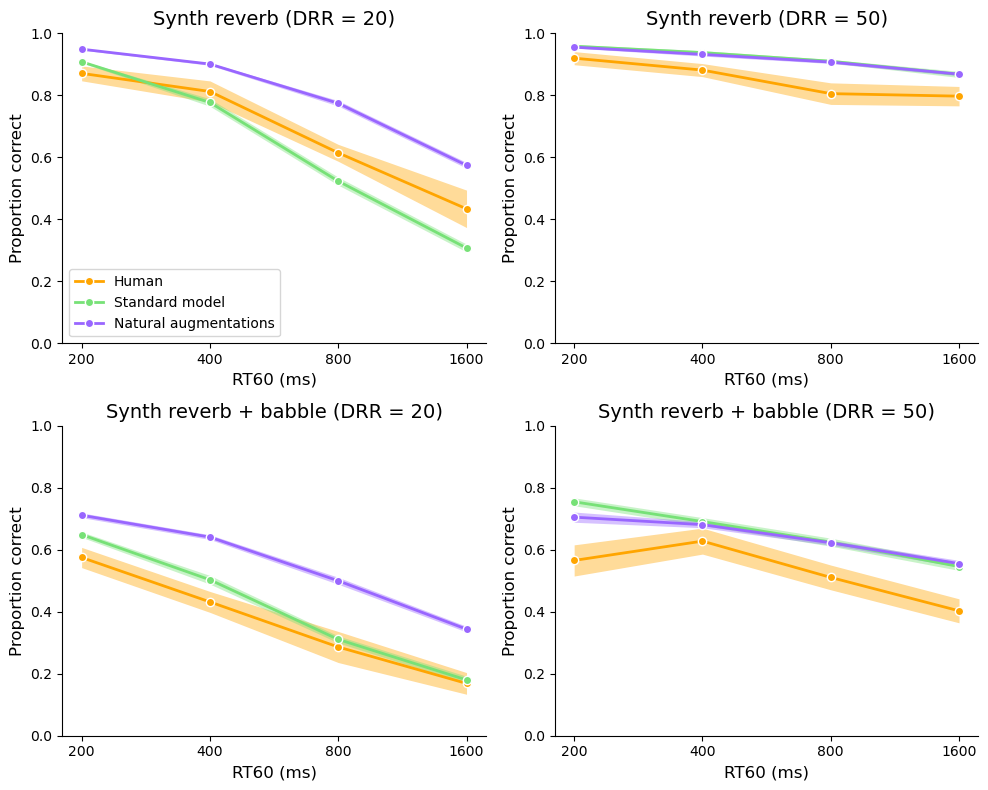

In [10]:
plt.figure(figsize=(10, 8))
plt.subplot(221)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=[0, 1], legend=True)
plt.subplot(222)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=[0, 1], legend=False)
plt.subplot(223)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=[0, 1], legend=False)
plt.subplot(224)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=[0, 1], legend=False)
plt.tight_layout()

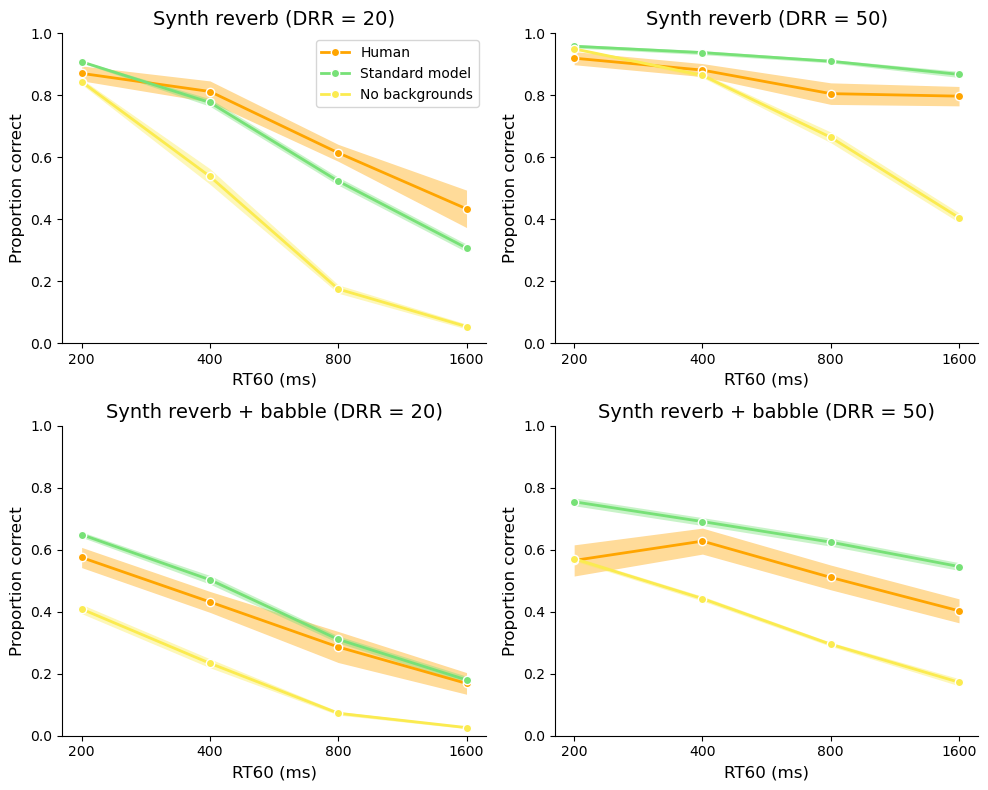

In [11]:
plt.figure(figsize=(10, 8))
plt.subplot(221)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=[0, 2], legend=True)
plt.subplot(222)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=[0, 2], legend=False)
plt.subplot(223)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=[0, 2], legend=False)
plt.subplot(224)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=[0, 2], legend=False)
plt.tight_layout()

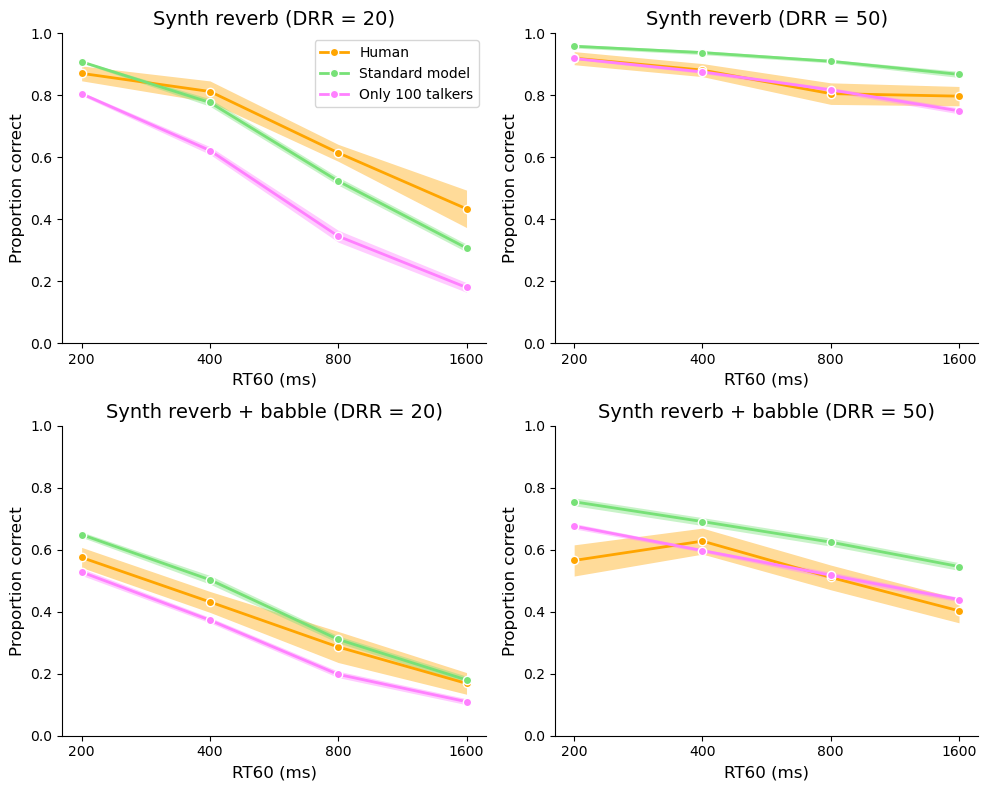

In [12]:
plt.figure(figsize=(10, 8))
plt.subplot(221)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=[0, 3], legend=True)
plt.subplot(222)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=[0, 3], legend=False)
plt.subplot(223)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=[0, 3], legend=False)
plt.subplot(224)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=[0, 3], legend=False)
plt.tight_layout()

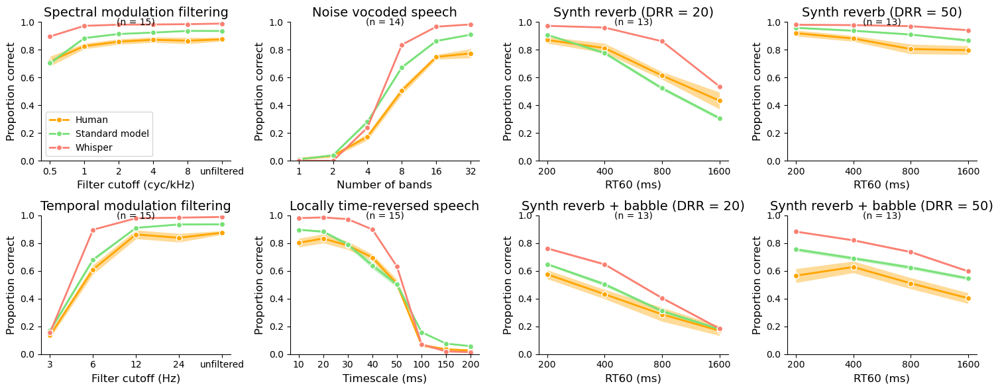

In [12]:
plt.figure(figsize=(15, 6))
plt.subplot(241)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)',
                         'Spectral modulation filtering', model_indices=[0, 7], legend=True)
plt.subplot(245)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Temporal modulation filtering', model_indices=[0, 7], legend=False)
plt.subplot(242)
plot_human_model_results('noise_vocoded', [1, 2, 4, 8, 16, 32], 'Number of bands', 
                                 'Noise vocoded speech', legend=False, model_indices=[0, 7]) 
plt.subplot(246)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[0, 7])
plt.subplot(243)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=[0, 7], legend=False)
plt.subplot(244)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=[0, 7], legend=False)
plt.subplot(247)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=[0, 7], legend=False)
plt.subplot(248)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=[0, 7], legend=False)
#plt.suptitle('Low pass modulation filtering', fontsize=16, y=1)
plt.tight_layout()

In [78]:
inds=[0,7,11,12]

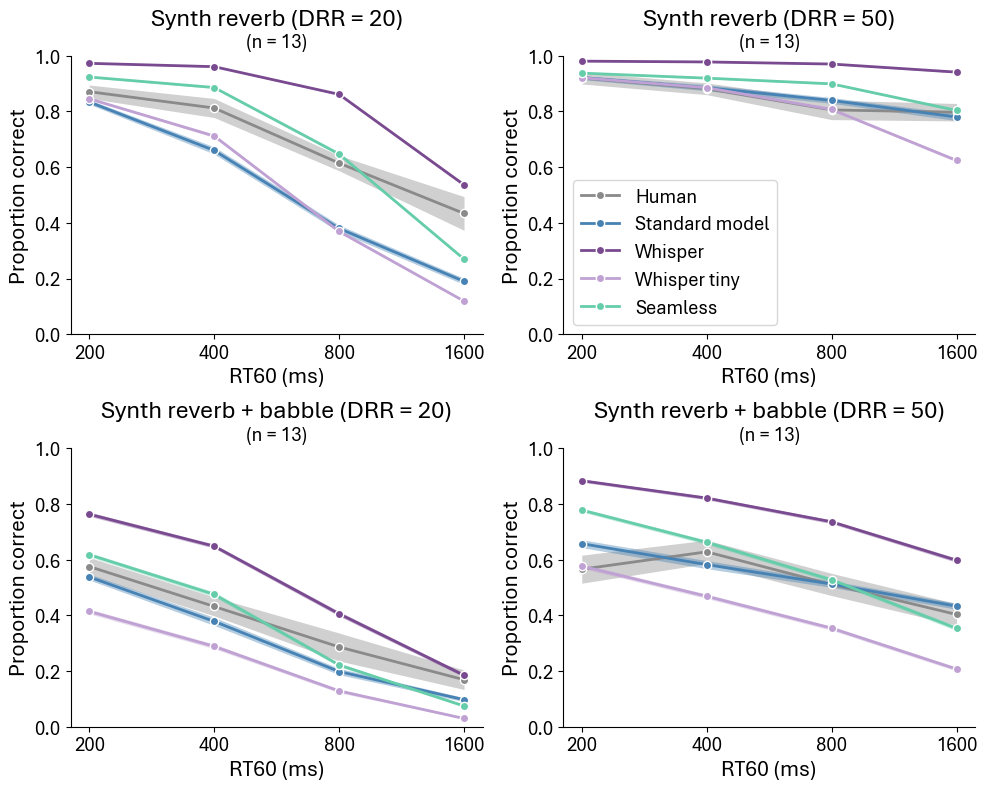

In [80]:
plt.figure(figsize=(10, 8))
plt.subplot(221)
plot_human_model_results('synth_reverb-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 20)', model_indices=inds, legend=False)
plt.subplot(222)
plot_human_model_results('synth_reverb-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb (DRR = 50)', model_indices=inds, legend=True)
plt.subplot(223)
plot_human_model_results('synth_reverb_babble_0dB-20', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 20)', model_indices=inds, legend=False)
plt.subplot(224)
plot_human_model_results('synth_reverb_babble_0dB-50', [200, 400, 800, 1600], 'RT60 (ms)',
                         'Synth reverb + babble (DRR = 50)', model_indices=inds, legend=False)
plt.tight_layout()

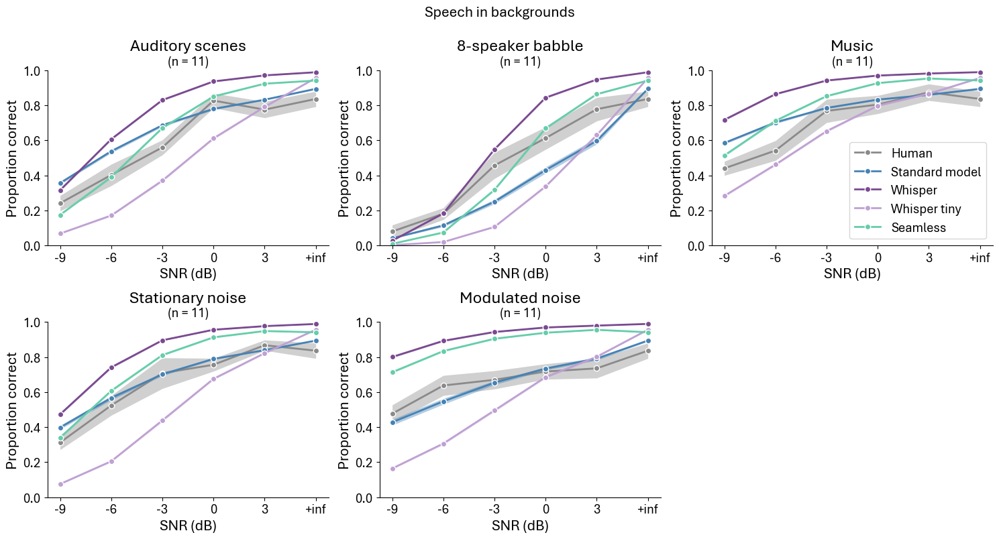

In [81]:
plt.figure(figsize=(15, 8))
plt.subplot(231)
plot_human_model_results('audscene', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Auditory scenes', model_indices=inds, legend=False)
plt.subplot(232)
plot_human_model_results('babble', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         '8-speaker babble', model_indices=inds, legend=False)
plt.subplot(233)
plot_human_model_results('music', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Music', model_indices=inds, legend=True)
plt.subplot(234)
plot_human_model_results('stat_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Stationary noise', model_indices=inds, legend=False)
plt.subplot(235)
plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Modulated noise', model_indices=inds, legend=False)
plt.suptitle('Speech in backgrounds', fontsize=16, y=1)
plt.tight_layout()

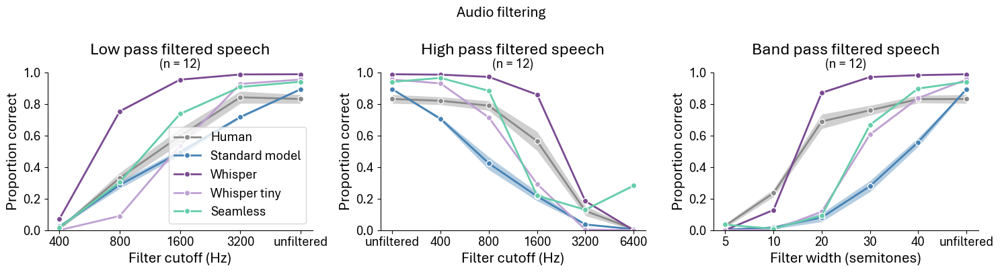

In [82]:
plt.figure(figsize=(15, 4))
plt.subplot(131)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Low pass filtered speech', model_indices=inds, legend=True)
plt.subplot(132)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
                         'High pass filtered speech', model_indices=inds, legend=False)
plt.subplot(133)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)',
                         'Band pass filtered speech', model_indices=inds, legend=False)
plt.suptitle('Audio filtering', fontsize=16, y=1)
plt.tight_layout()

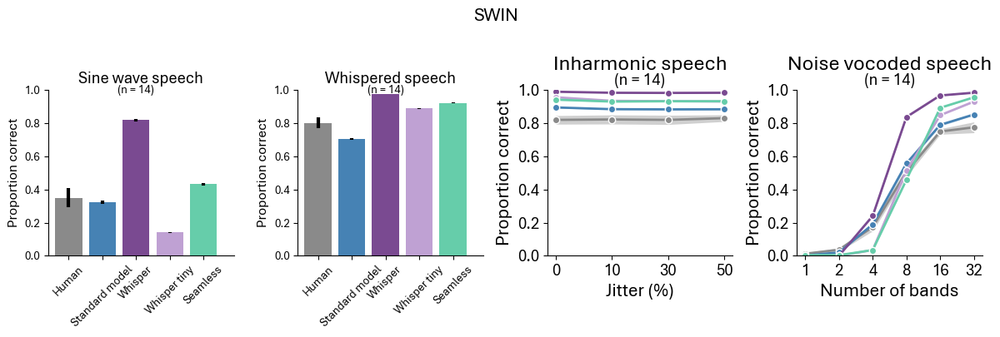

In [85]:
plt.figure(figsize=(12, 4))
plt.subplot(141)
plot_human_model_results_bar('sine_wave_speech',
                         'Sine wave speech', model_indices=inds, legend=True)
plt.subplot(142)
plot_human_model_results_bar('whispered',
                         'Whispered speech', model_indices=inds, legend=True)
plt.subplot(143)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=inds) 
plt.subplot(144)
plot_human_model_results('noise_vocoded', [1, 2, 4, 8, 16, 32], 'Number of bands', 
                                 'Noise vocoded speech', legend=False, model_indices=inds)   
plt.suptitle('SWIN', fontsize=16, y=1)
plt.tight_layout()

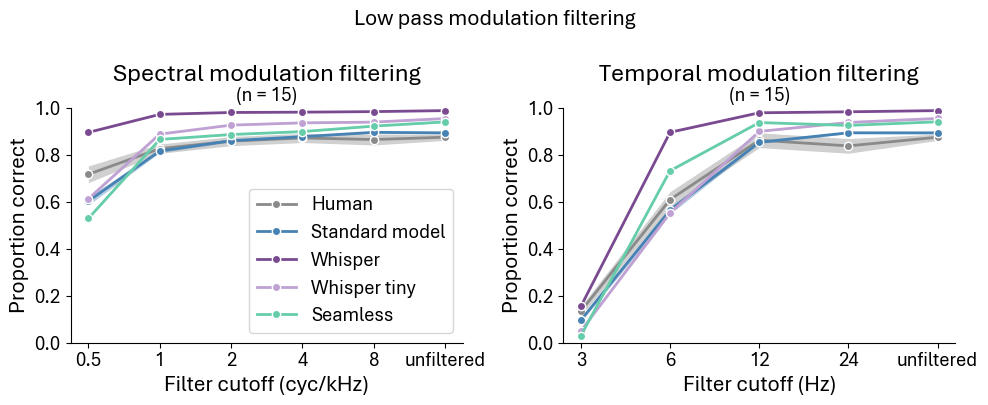

In [86]:
plt.figure(figsize=(10, 4))
plt.subplot(121)
plot_human_model_results('mod_lowpass-specmod', [0.5, 1, 2, 4, 8, 'unfiltered'], 'Filter cutoff (cyc/kHz)',
                         'Spectral modulation filtering', model_indices=inds, legend=True)
plt.subplot(122)
plot_human_model_results('mod_lowpass-tempmod', [3, 6, 12, 24, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Temporal modulation filtering', model_indices=inds, legend=False)
plt.suptitle('Low pass modulation filtering', fontsize=16, y=1)
plt.tight_layout()

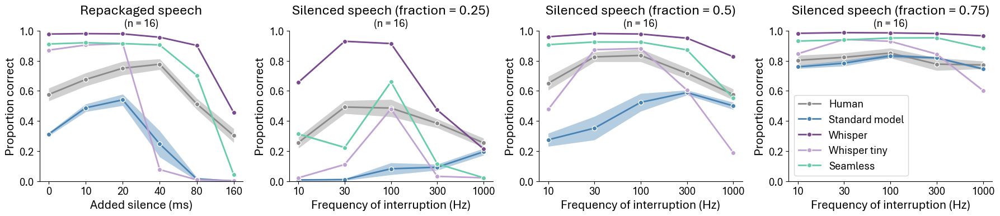

In [87]:
plt.figure(figsize=(18, 4))
plt.subplot(141)
plot_human_model_results('repackaged', [0, 10, 20, 40, 80, 160], 'Added silence (ms)',
                         'Repackaged speech', model_indices=inds, legend=False)
plt.subplot(142)
plot_human_model_results('silenced-0.75', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'Silenced speech (fraction = 0.25)', model_indices=inds, legend=False)
plt.subplot(143)
plot_human_model_results('silenced-0.5', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'Silenced speech (fraction = 0.5)', model_indices=inds, legend=False)
plt.subplot(144)
plot_human_model_results('silenced-0.25', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'Silenced speech (fraction = 0.75)', model_indices=inds, legend=True)
#plt.suptitle('Audio filtering', fontsize=16, y=1)
plt.tight_layout()

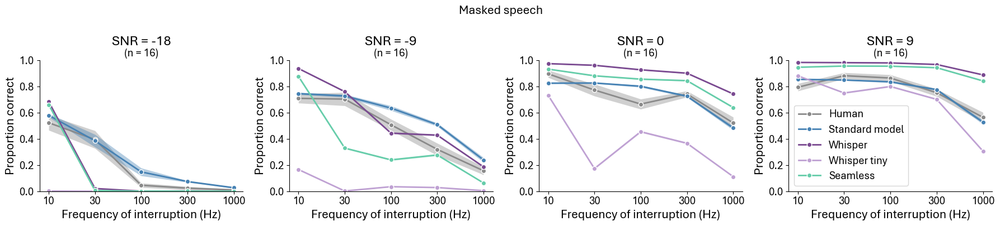

In [88]:
plt.figure(figsize=(18, 4))
plt.subplot(141)
plot_human_model_results('masked--18', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'SNR = -18', model_indices=inds, legend=False)
plt.subplot(142)
plot_human_model_results('masked--9', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'SNR = -9', model_indices=inds, legend=False)
plt.subplot(143)
plot_human_model_results('masked-0', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'SNR = 0', model_indices=inds, legend=False)
plt.subplot(144)
plot_human_model_results('masked-9', [10, 30, 100, 300, 1000], 'Frequency of interruption (Hz)',
                         'SNR = 9', model_indices=inds, legend=True)
plt.suptitle('Masked speech', fontsize=16, y=1)
plt.tight_layout()

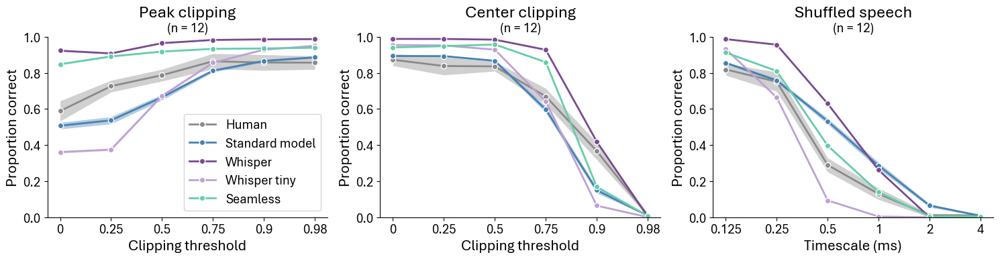

In [89]:
plt.figure(figsize=(15, 4))
plt.subplot(131)
plot_human_model_results('clipped-peak', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Peak clipping', legend=True, model_indices=inds)
plt.subplot(132)
plot_human_model_results('clipped-center', [0, 0.25, 0.5, 0.75, 0.9, 0.98], 'Clipping threshold', 
                             'Center clipping', legend=False, model_indices=inds)
plt.subplot(133)
plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                             'Shuffled speech', legend=False, model_indices=inds)
#plt.suptitle('Masked speech', fontsize=16, y=1)
plt.tight_layout()

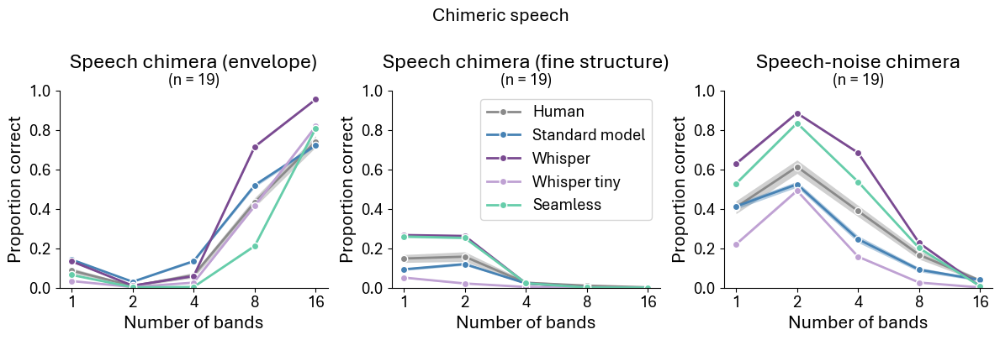

In [90]:
plt.figure(figsize=(12, 4))
plt.subplot(131)
plot_human_model_results('chimera-envelope', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (envelope)', legend=False, model_indices=inds)
plt.subplot(132)
plot_human_model_results('chimera-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech chimera (fine structure)', legend=True, model_indices=inds)
plt.subplot(133)
plot_human_model_results('chimera_noise-fs', [1, 2, 4, 8, 16], 'Number of bands', 
                             'Speech-noise chimera', legend=False, model_indices=inds)
plt.suptitle('Chimeric speech', fontsize=16, y=1)
plt.tight_layout()

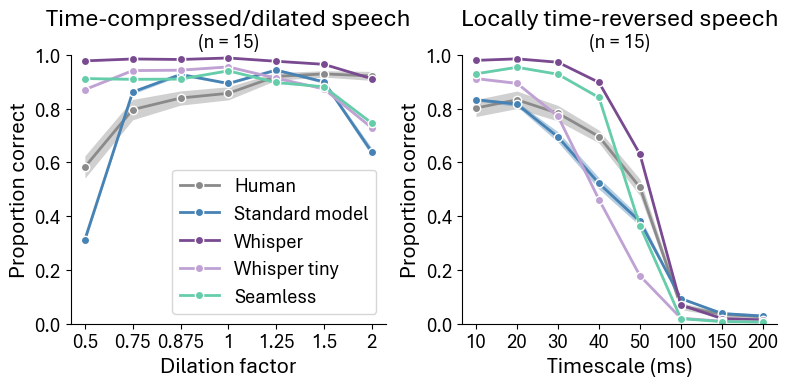

In [91]:
plt.figure(figsize=(8, 4))
plt.subplot(121)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=inds, legend=True)
plt.subplot(122)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=inds)
plt.tight_layout()

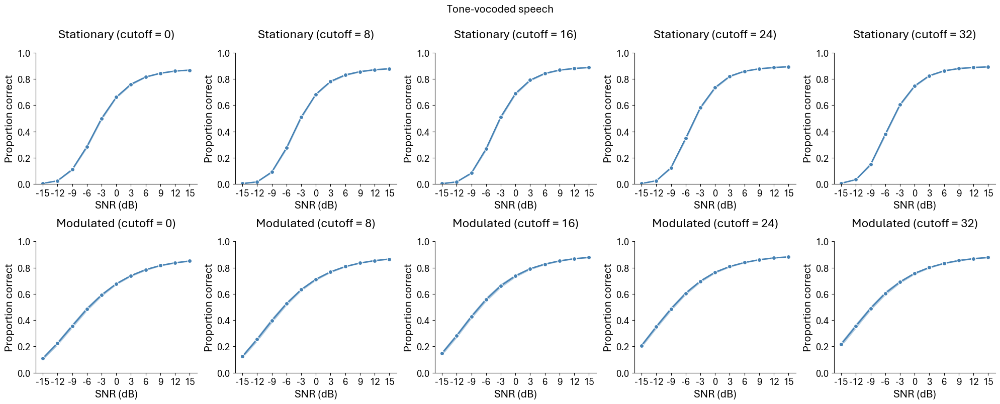

In [10]:
plt.figure(figsize=(20, 8))
plt.subplot(251)
plot_human_model_results('stat_0', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Stationary (cutoff = 0)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(252)
plot_human_model_results('stat_8', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Stationary (cutoff = 8)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(253)
plot_human_model_results('stat_16', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Stationary (cutoff = 16)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(254)
plot_human_model_results('stat_24', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Stationary (cutoff = 24)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(255)
plot_human_model_results('stat_32', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Stationary (cutoff = 32)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(256)
plot_human_model_results('mod_0', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Modulated (cutoff = 0)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(257)
plot_human_model_results('mod_8', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Modulated (cutoff = 8)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(258)
plot_human_model_results('mod_16', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Modulated (cutoff = 16)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(259)
plot_human_model_results('mod_24', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Modulated (cutoff = 24)', model_indices=[0], legend=False, plot_human=False)
plt.subplot(2,5,10)
plot_human_model_results('mod_32', [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15], 'SNR (dB)',
                         'Modulated (cutoff = 32)', model_indices=[0], legend=False, plot_human=False)
plt.suptitle('Tone-vocoded speech', fontsize=16, y=1)
plt.tight_layout()

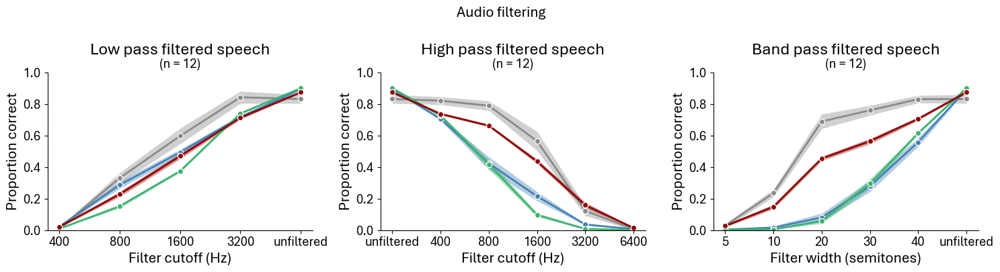

In [12]:
inds = [0, 2, 5]
plt.figure(figsize=(15, 4))
plt.subplot(131)
plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)',
                         'Low pass filtered speech', model_indices=inds, legend=False)
plt.subplot(132)
plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
                         'High pass filtered speech', model_indices=inds, legend=False)
plt.subplot(133)
plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)',
                         'Band pass filtered speech', model_indices=inds, legend=False)
plt.suptitle('Audio filtering', fontsize=16, y=1)
plt.tight_layout()

In [9]:
clean6 = {}
clean4 = {}
for ind, model in zip([0, 2, 5], ['no_augs_400', 'no_backgrounds', 'extreme_augs_300']):
    with open(f'apmth220_project/{model}_clean_block6_dims.json') as f:
        clean6[ind] = json.load(f)["0"]
    with open(f'apmth220_project/{model}_clean_block4_dims.json') as f:
        clean4[ind] = json.load(f)["0"]
clean6, clean4

({0: 237, 2: 261, 5: 203}, {0: 56, 2: 81, 5: 59})

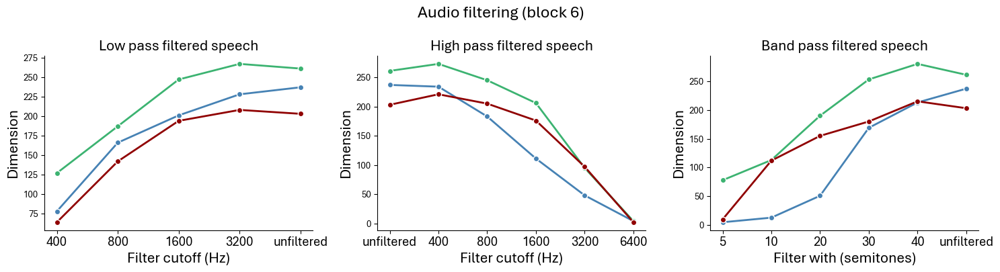

In [27]:
mods = {0: 'no_augs_400', 2: 'no_backgrounds', 5: 'extreme_augs_300'}
plt.figure(figsize=(15, 4))
plt.subplot(131)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_lowpass_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [400, 800, 1600, 3200]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4], [400, 800, 1600, 3200, 'unfiltered'], fontsize=14)
plt.xlabel('Filter cutoff (Hz)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Low pass filtered speech', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)',
#                          'Low pass filtered speech', model_indices=inds, legend=False)
plt.subplot(132)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_highpass_block6_dims.json') as f:
        file = json.load(f)
    vals = [clean6[ind]] + [file[str(i)] for i in [400, 800, 1600, 3200, 6400]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], ['unfiltered', 400, 800, 1600, 3200, 6400], fontsize=14)
plt.xlabel('Filter cutoff (Hz)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('High pass filtered speech', {'fontsize': 16})
prettifyAxes(plt.gca())

# plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
#                          'High pass filtered speech', model_indices=inds, legend=False)
plt.subplot(133)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_bandpass_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [5, 10, 20, 30, 40]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [5, 10, 20, 30, 40, 'unfiltered'], fontsize=14)
plt.xlabel('Filter with (semitones)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Band pass filtered speech', {'fontsize': 16})
prettifyAxes(plt.gca())

# plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)',
#                          'Band pass filtered speech', model_indices=inds, legend=False)
plt.suptitle('Audio filtering (block 6)', fontsize=18, y=1)
plt.tight_layout()

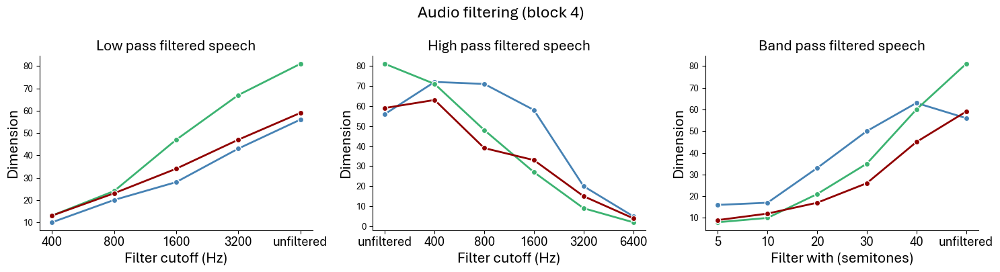

In [29]:
mods = {0: 'no_augs_400', 2: 'no_backgrounds', 5: 'extreme_augs_300'}
plt.figure(figsize=(15, 4))
plt.subplot(131)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_lowpass_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [400, 800, 1600, 3200]] + [clean4[ind]]
    plt.plot([0, 1, 2, 3, 4], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4], [400, 800, 1600, 3200, 'unfiltered'], fontsize=14)
plt.xlabel('Filter cutoff (Hz)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Low pass filtered speech', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('lowpass', [400, 800, 1600, 3200, 'unfiltered'], 'Filter cutoff (Hz)',
#                          'Low pass filtered speech', model_indices=inds, legend=False)
plt.subplot(132)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_highpass_block4_dims.json') as f:
        file = json.load(f)
    vals = [clean4[ind]] + [file[str(i)] for i in [400, 800, 1600, 3200, 6400]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], ['unfiltered', 400, 800, 1600, 3200, 6400], fontsize=14)
plt.xlabel('Filter cutoff (Hz)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('High pass filtered speech', {'fontsize': 16})
prettifyAxes(plt.gca())

# plot_human_model_results('highpass', ['unfiltered', 400, 800, 1600, 3200, 6400], 'Filter cutoff (Hz)',
#                          'High pass filtered speech', model_indices=inds, legend=False)
plt.subplot(133)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_bandpass_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [5, 10, 20, 30, 40]] + [clean4[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [5, 10, 20, 30, 40, 'unfiltered'], fontsize=14)
plt.xlabel('Filter with (semitones)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Band pass filtered speech', {'fontsize': 16})
prettifyAxes(plt.gca())

# plot_human_model_results('bandpass', [5, 10, 20, 30, 40, 'unfiltered'], 'Filter width (semitones)',
#                          'Band pass filtered speech', model_indices=inds, legend=False)
plt.suptitle('Audio filtering (block 4)', fontsize=18, y=1)
plt.tight_layout()

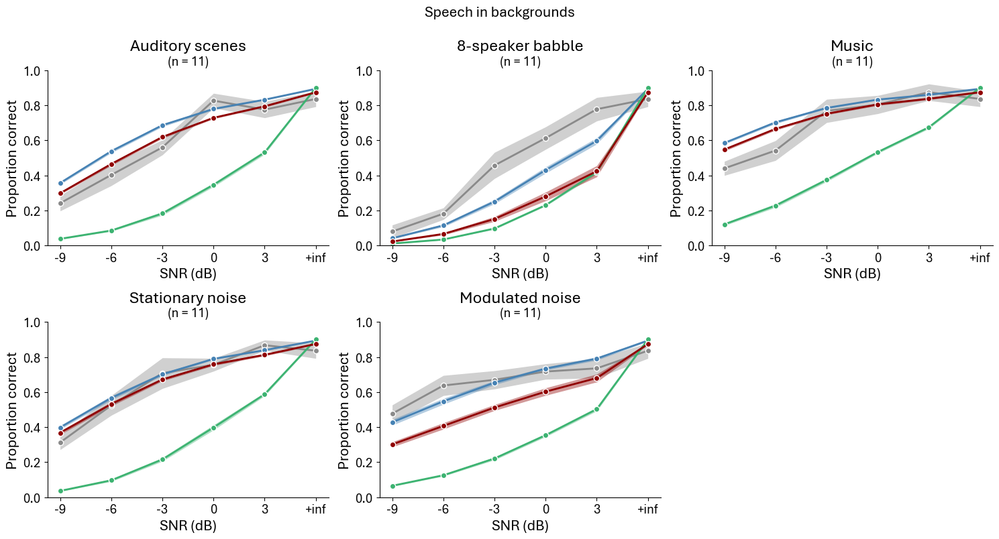

In [14]:
plt.figure(figsize=(15, 8))
plt.subplot(231)
plot_human_model_results('audscene', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Auditory scenes', model_indices=inds, legend=False)
plt.subplot(232)
plot_human_model_results('babble', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         '8-speaker babble', model_indices=inds, legend=False)
plt.subplot(233)
plot_human_model_results('music', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Music', model_indices=inds, legend=False)
plt.subplot(234)
plot_human_model_results('stat_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Stationary noise', model_indices=inds, legend=False)
plt.subplot(235)
plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Modulated noise', model_indices=inds, legend=False)
plt.suptitle('Speech in backgrounds', fontsize=16, y=1)
plt.tight_layout()

56
81
59


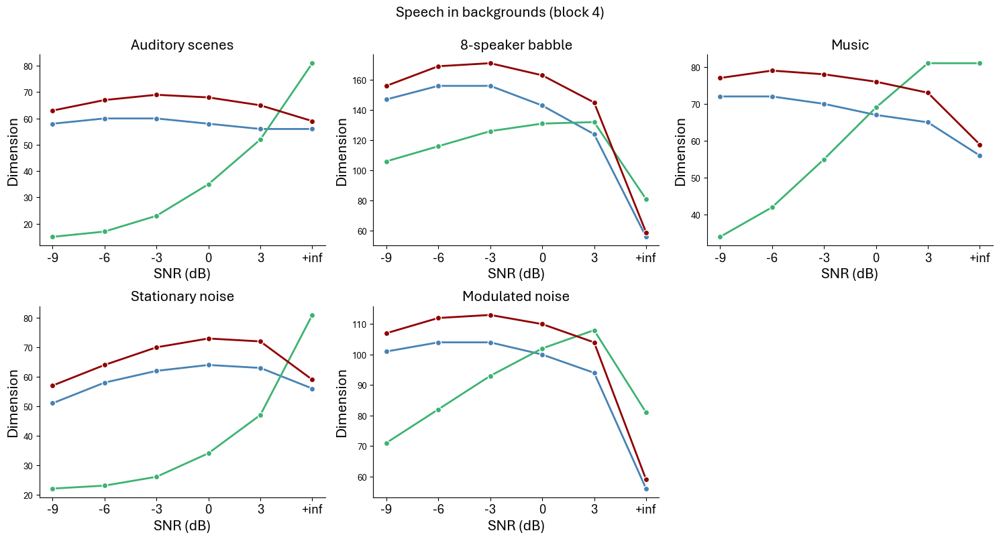

In [12]:
mods = {0: 'no_augs_400', 2: 'no_backgrounds', 5: 'extreme_augs_300'}
plt.figure(figsize=(15, 8))
plt.subplot(231)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-audscene_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean4[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Auditory scenes', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('audscene', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Auditory scenes', model_indices=inds, legend=False)
plt.subplot(232)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-babble_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean4[ind]]
    print(clean4[ind])
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('8-speaker babble', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('babble', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          '8-speaker babble', model_indices=inds, legend=False)
plt.subplot(233)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-music_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean4[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Music', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('music', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Music', model_indices=inds, legend=False)
plt.subplot(234)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-stat_noise_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean4[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Stationary noise', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('stat_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Stationary noise', model_indices=inds, legend=False)
plt.subplot(235)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-mod_noise_block4_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean4[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Modulated noise', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
plt.suptitle('Speech in backgrounds (block 4)', fontsize=16, y=1)
plt.tight_layout()

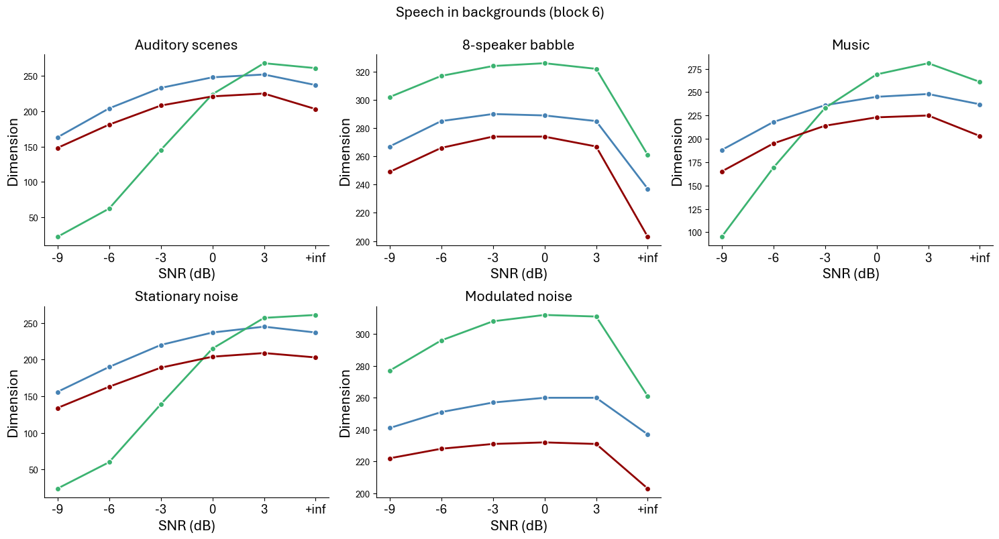

In [31]:
plt.figure(figsize=(15, 8))
plt.subplot(231)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-audscene_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Auditory scenes', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('audscene', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Auditory scenes', model_indices=inds, legend=False)
plt.subplot(232)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-babble_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('8-speaker babble', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('babble', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          '8-speaker babble', model_indices=inds, legend=False)
plt.subplot(233)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-music_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Music', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('music', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Music', model_indices=inds, legend=False)
plt.subplot(234)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-stat_noise_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Stationary noise', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('stat_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Stationary noise', model_indices=inds, legend=False)
plt.subplot(235)
for ind, model in mods.items():
    with open(f'apmth220_project/{model}_backgrounds-mod_noise_block6_dims.json') as f:
        file = json.load(f)
    vals = [file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
    plt.plot([0, 1, 2, 3, 4, 5], vals, 'o-', color=colors[archs[ind]], mec='white', lw=2)
plt.xticks([0, 1, 2, 3, 4, 5], [-9, -6, -3, 0, 3, '+inf'], fontsize=14)
plt.xlabel('SNR (dB)', {'fontsize': 16})
plt.ylabel('Dimension', {'fontsize': 16})
plt.title('Modulated noise', {'fontsize': 16})
prettifyAxes(plt.gca())
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
plt.suptitle('Speech in backgrounds (block 6)', fontsize=16, y=1)
plt.tight_layout()

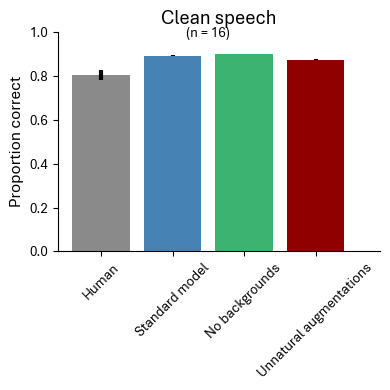

In [17]:
plt.figure(figsize=(4, 4))
plt.subplot(111)
plot_human_model_results_bar('clean',
                         'Clean speech', model_indices=inds, legend=True)  
# plt.suptitle('Clean speech', fontsize=16, y=1)
plt.tight_layout()

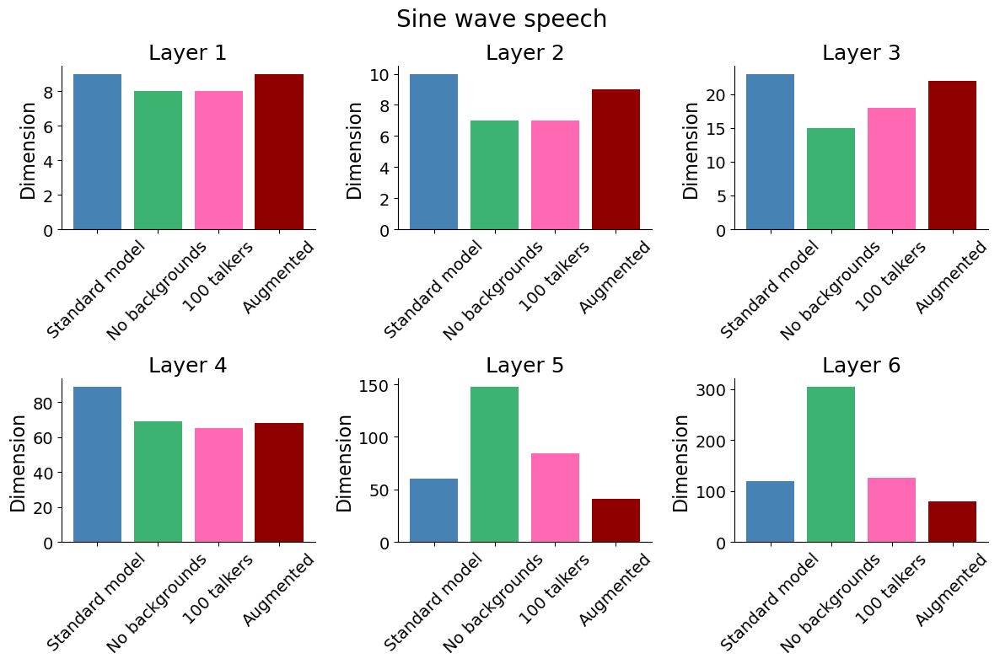

In [14]:
mods = {0: 'no_augs_400', 2: 'no_backgrounds', 3: '100_talkers', 5: 'extreme_augs_300'}
plt.figure(figsize=(12, 8))
for block in range(1, 7):
    plt.subplot(230 + block)
    for pos, (ind, model) in enumerate(mods.items()):
        with open(f'apmth220_project/{model}_sine_wave_speech_block{block}_dims.json') as f:
            file = json.load(f)
        val = file["4"] #[file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
        plt.bar(pos, val, color=colors[archs[ind]], lw=2)
    plt.xticks([0, 1, 2, 3], [names[ind] for ind in mods], fontsize=14, rotation=45)
    #plt.xlabel('SNR (dB)', {'fontsize': 16})
    plt.ylabel('Dimension', {'fontsize': 16})
    plt.yticks(fontsize=14)
    plt.title(f'Layer {block}', {'fontsize': 18})
    prettifyAxes(plt.gca())
plt.suptitle('Sine wave speech', fontsize=20)
plt.tight_layout()

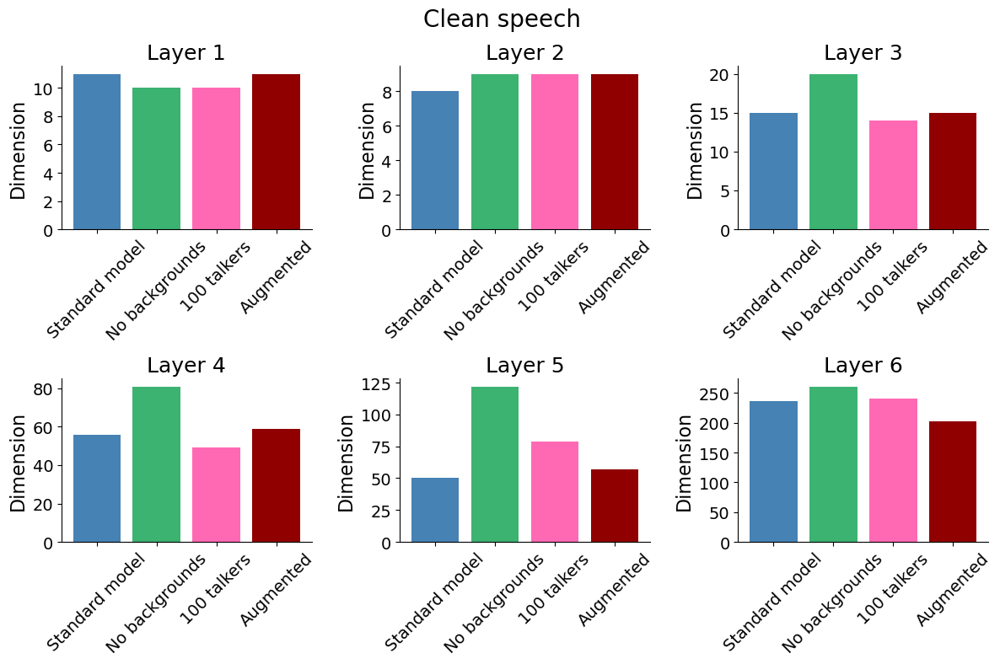

In [29]:
mods = {0: 'no_augs_400', 2: 'no_backgrounds', 3: '100_talkers', 5: 'extreme_augs_300'}
plt.figure(figsize=(12, 8))
for block in range(1, 7):
    plt.subplot(230 + block)
    for pos, (ind, model) in enumerate(mods.items()):
        with open(f'apmth220_project/{model}_clean_block{block}_dims.json') as f:
            file = json.load(f)
        val = file["0"] #[file[str(i)] for i in [-9, -6, -3, 0, 3]] + [clean6[ind]]
        plt.bar(pos, val, color=colors[archs[ind]], lw=2)
    plt.xticks([0, 1, 2, 3], [names[ind] for ind in mods], fontsize=14, rotation=45)
    #plt.xlabel('SNR (dB)', {'fontsize': 16})
    plt.ylabel('Dimension', {'fontsize': 16})
    plt.yticks(fontsize=14)
    plt.title(f'Layer {block}', {'fontsize': 18})
    prettifyAxes(plt.gca())
plt.suptitle('Clean speech', fontsize=20)
plt.tight_layout()

In [20]:
conds = ['clean', 'lowpass', 'highpass', 'bandpass', 'backgrounds-audscene', 'backgrounds-babble',
         'backgrounds-music', 'backgrounds-stat_noise', 'backgrounds-mod_noise', 'sine_wave_speech', 'compressed_dilated']
avged_activations = {}
for pos, (ind, model) in enumerate(mods.items()):
    avged_activations[ind] = []
    for layer in range(1, 7):
        overall_dims = []
        for cond in conds:
            with open(f'apmth220_project/{model}_{cond}_block{layer}_dims.json') as f:
                file = json.load(f)
            overall_dims.extend(list(file.values()))
        avged_activations[ind].append(overall_dims)
    avged_activations[ind] = np.array(avged_activations[ind])
avged_activations
np.mean(avged_activations[0], axis=1)

array([ 12.61702128,  11.29787234,  22.0212766 ,  67.17021277,
        48.9787234 , 200.34042553])

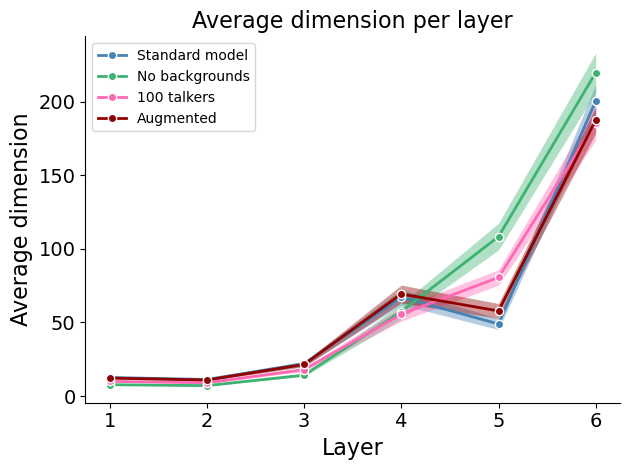

In [27]:
#plt.subplot(111)
for ind, model in mods.items():
    x = [1, 2, 3, 4, 5, 6]
    vals = avged_activations[ind]
    model_se = np.std(vals, axis=1)/np.sqrt(vals.shape[1])
    model_m = np.mean(vals, axis=1)
    plt.fill_between(x, model_m+model_se, model_m-model_se, color=colors[archs[ind]], lw=0, alpha=0.4)
    plt.plot(x, model_m, 'o-', color=colors[archs[ind]], mec='white', lw=2, label=names[ind])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Layer', {'fontsize': 16})
plt.ylabel('Average dimension', {'fontsize': 16})
plt.title('Average dimension per layer', {'fontsize': 16})
prettifyAxes(plt.gca())
plt.legend()
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
#plt.suptitle('Speech in backgrounds (block 6)', fontsize=16, y=1)
plt.tight_layout()

In [48]:
superdir = '/om2/user/amagaro/word_recognition_project/full_results_230/'
all_hum = []
all_model_perf = {0: [], 2: [], 3: [], 5: []}
all_model = {}
for cond in conds:
    folder = cond.split('-')[-1]
    human_data = np.load(superdir + folder + '/' + 'human.npy')
    all_hum.extend(np.mean(human_data, axis=1))
    for ind, model in mods.items():
        model_data = np.load(superdir + folder + '/' + archs[ind] + '.npy')
        all_model_perf[ind].extend(np.mean(model_data, axis=1))
print(len(all_hum))

for layer in range(1, 7):
    all_model[layer] = {}
    for ind, model in mods.items():
        all_model[layer][ind] = []
        with open(f'apmth220_project/{model}_clean_block{layer}_dims.json') as f:
            clean = json.load(f)["0"]
        for cond in conds:
            with open(f'apmth220_project/{model}_{cond}_block{layer}_dims.json') as f:
                file = json.load(f)
            values = list(file.values())
            if cond == 'lowpass':
                all_model[layer][ind].append(clean)
                all_model[layer][ind].extend(values)
            elif cond in ['highpass', 'bandpass'] or 'backgrounds' in cond:
                all_model[layer][ind].extend(values)
                all_model[layer][ind].append(clean)
            elif cond == 'compressed_dilated':
                all_model[layer][ind].extend(values[:3])
                all_model[layer][ind].append(clean)
                all_model[layer][ind].extend(values[3:])
            else:
                all_model[layer][ind].extend(values)
                
human_model_corrs = {}
for ind, model in mods.items(): 
    human_model_corrs[ind] = []
    for layer in range(1, 7):
        human_model_corrs[ind].append(scipy.stats.pearsonr(all_model[layer][ind], all_hum).statistic)
human_model_corrs

model_model_corrs = {}
for ind, model in mods.items(): 
    model_model_corrs[ind] = []
    for layer in range(1, 7):
        model_model_corrs[ind].append(scipy.stats.pearsonr(all_model[layer][ind], all_model_perf[ind]).statistic)
model_model_corrs

error_model_corrs = {}
for ind, model in mods.items(): 
    error_model_corrs[ind] = []
    for layer in range(1, 7):
        error_model_corrs[ind].append(scipy.stats.pearsonr(all_model[layer][ind], (np.array(all_hum)-np.array(all_model_perf[ind]))**2).statistic)
error_model_corrs

56


{0: [-0.3073986690732835,
  -0.27781992928770544,
  -0.21381785893579078,
  -0.16792431921795933,
  -0.11883274305833726,
  -0.395876035758836],
 2: [-0.17107612076053944,
  -0.201465712737433,
  -0.24628358425826036,
  -0.23215874029464093,
  -0.08873420357224948,
  -0.12673976143639032],
 3: [-0.3627089720953265,
  -0.37445295578398363,
  -0.31560107009842764,
  -0.26685786865253835,
  -0.2777875857642052,
  -0.45761782786921856],
 5: [0.19644865143455303,
  0.2800456779728429,
  0.39607740677819936,
  0.5031630871946824,
  0.5821201250053011,
  0.32081775133532897]}

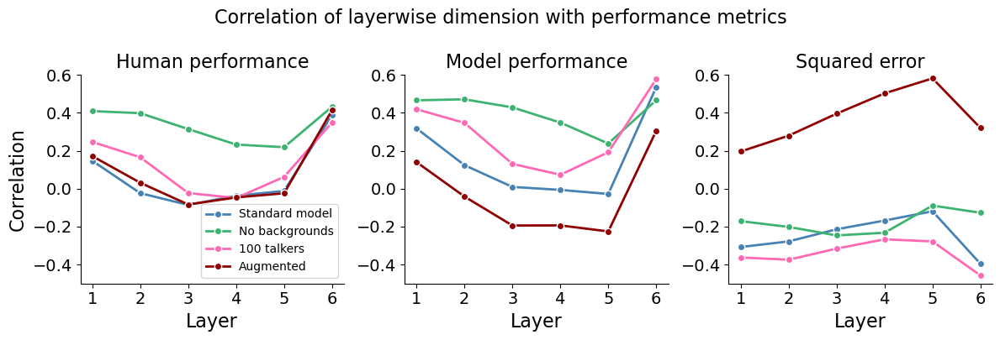

In [57]:
plt.figure(figsize=(12, 4))
plt.subplot(131)
for ind, model in mods.items():
    x = [1, 2, 3, 4, 5, 6]
    vals = human_model_corrs[ind]
    #model_se = np.std(vals, axis=1)/np.sqrt(vals.shape[1])
    #model_m = np.mean(vals, axis=1)
    #plt.fill_between(x, model_m+model_se, model_m-model_se, color=colors[archs[ind]], lw=0, alpha=0.4)
    plt.plot(x, vals, 'o-', color=colors[archs[ind]], mec='white', lw=2, label=names[ind])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(-0.5, 0.6)
plt.xlabel('Layer', {'fontsize': 16})
plt.ylabel('Correlation', {'fontsize': 16})
plt.title('Human performance', {'fontsize': 16})
prettifyAxes(plt.gca())
plt.legend()
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
#plt.suptitle('Speech in backgrounds (block 6)', fontsize=16, y=1)
plt.subplot(132)
for ind, model in mods.items():
    x = [1, 2, 3, 4, 5, 6]
    vals = model_model_corrs[ind]
    #model_se = np.std(vals, axis=1)/np.sqrt(vals.shape[1])
    #model_m = np.mean(vals, axis=1)
    #plt.fill_between(x, model_m+model_se, model_m-model_se, color=colors[archs[ind]], lw=0, alpha=0.4)
    plt.plot(x, vals, 'o-', color=colors[archs[ind]], mec='white', lw=2, label=names[ind])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(-0.5, 0.6)
plt.xlabel('Layer', {'fontsize': 16})
# plt.ylabel('Correlation', {'fontsize': 16})
plt.title('Model performance', {'fontsize': 16})
prettifyAxes(plt.gca())
# plt.legend()
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
#plt.suptitle('Speech in backgrounds (block 6)', fontsize=16, y=1)
plt.subplot(133)
for ind, model in mods.items():
    x = [1, 2, 3, 4, 5, 6]
    vals = error_model_corrs[ind]
    #model_se = np.std(vals, axis=1)/np.sqrt(vals.shape[1])
    #model_m = np.mean(vals, axis=1)
    #plt.fill_between(x, model_m+model_se, model_m-model_se, color=colors[archs[ind]], lw=0, alpha=0.4)
    plt.plot(x, vals, 'o-', color=colors[archs[ind]], mec='white', lw=2, label=names[ind])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(-0.5, 0.6)
plt.xlabel('Layer', {'fontsize': 16})
# plt.ylabel('Correlation', {'fontsize': 16})
plt.title('Squared error', {'fontsize': 16})
prettifyAxes(plt.gca())
# plt.legend()
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
plt.suptitle('Correlation of layerwise dimension with performance metrics', fontsize=16, y=1)
plt.tight_layout()

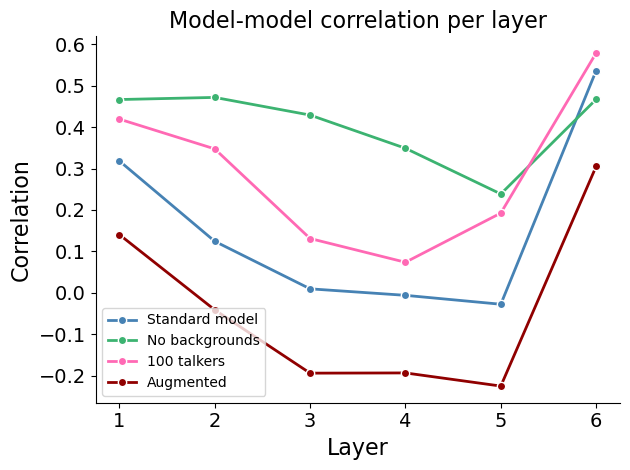

In [46]:
#plt.subplot(111)
for ind, model in mods.items():
    x = [1, 2, 3, 4, 5, 6]
    vals = model_model_corrs[ind]
    #model_se = np.std(vals, axis=1)/np.sqrt(vals.shape[1])
    #model_m = np.mean(vals, axis=1)
    #plt.fill_between(x, model_m+model_se, model_m-model_se, color=colors[archs[ind]], lw=0, alpha=0.4)
    plt.plot(x, vals, 'o-', color=colors[archs[ind]], mec='white', lw=2, label=names[ind])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Layer', {'fontsize': 16})
plt.ylabel('Correlation', {'fontsize': 16})
plt.title('Model-model correlation per layer', {'fontsize': 16})
prettifyAxes(plt.gca())
plt.legend()
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
#plt.suptitle('Speech in backgrounds (block 6)', fontsize=16, y=1)
plt.tight_layout()

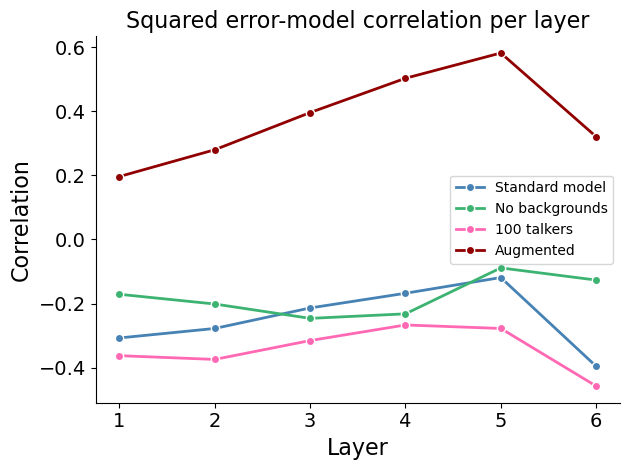

In [49]:
#plt.subplot(111)
for ind, model in mods.items():
    x = [1, 2, 3, 4, 5, 6]
    vals = error_model_corrs[ind]
    #model_se = np.std(vals, axis=1)/np.sqrt(vals.shape[1])
    #model_m = np.mean(vals, axis=1)
    #plt.fill_between(x, model_m+model_se, model_m-model_se, color=colors[archs[ind]], lw=0, alpha=0.4)
    plt.plot(x, vals, 'o-', color=colors[archs[ind]], mec='white', lw=2, label=names[ind])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Layer', {'fontsize': 16})
plt.ylabel('Correlation', {'fontsize': 16})
plt.title('Squared error-model correlation per layer', {'fontsize': 16})
prettifyAxes(plt.gca())
plt.legend()
# plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
#                          'Modulated noise', model_indices=inds, legend=False)
#plt.suptitle('Speech in backgrounds (block 6)', fontsize=16, y=1)
plt.tight_layout()

In [37]:
import scipy

In [14]:
def compute_srt(fname, arch, idx=0):
    vals = np.load(f'/om2/user/amagaro/word_recognition_project/full_results_230/{fname}/{arch}.npy')
    y = vals[:, idx]
    x = [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]
    fcn_to_fit = lambda x, p0, p1, p2: p0 * scipy.stats.norm(p1, p2).cdf(x)
    popt, pcov = scipy.optimize.curve_fit(fcn_to_fit, x, y)
    return popt, fcn_to_fit

In [24]:
arch_plts = ['no_augs_800_words', 'no_augs_small_800_words', '100_talkers_800_words',
         'no_bgs_800_words', 'add_augs_800_words', 'extreme_augs_800_words', 'whisper', 'seamless', 'whisper_tiny'] 
for arch in arch_plts[-2:]:
    srt_mats = {}
    benefit_mats = {}
    for tp in ['stat', 'mod']:
        benefits = np.zeros((5, 1))
        srts = []
        for idx in range(1):
            popt, f = compute_srt(f'{tp}_0', arch, idx)
            srt = popt[1]
            #srts.append(srt)
            avg_val = f(srt, *popt)
            for i, cutoff in enumerate([0, 8, 16, 24, 32]):
                popt_o, f_o = compute_srt(f'{tp}_{cutoff}', arch, idx)
                srts.append(popt_o[1])
                snr = scipy.stats.norm(popt_o[1], popt_o[2]).ppf(avg_val/popt_o[0])
                benefits[i, idx] = srt - snr
        srt_mats[tp] = srts
        benefit_mats[tp] = benefits
        np.save(f'/om2/user/amagaro/word_recognition_project/full_results_230/{tp}_benefits/{arch}.npy', benefits)

In [28]:
hum_stat_srts = [-0.7, -2.047134, -2.782803, -2.400637, -2.992994]
hum_mod_srts = [-7.4, -10.849045, -11.412739, -12.425478, -13.619745]
hum_stat_benefits = np.array([[-0.7 - i for i in hum_stat_srts]]).T
hum_mod_benefits = np.array([[-7.4 - i for i in hum_mod_srts]]).T
hum_stat_benefits, hum_mod_benefits

(array([[0.      ],
        [1.347134],
        [2.082803],
        [1.700637],
        [2.292994]]),
 array([[0.      ],
        [3.449045],
        [4.012739],
        [5.025478],
        [6.219745]]))

In [30]:
np.save(f'/om2/user/amagaro/word_recognition_project/full_results_230/stat_benefits/human.npy', hum_stat_benefits)
np.save(f'/om2/user/amagaro/word_recognition_project/full_results_230/mod_benefits/human.npy', hum_mod_benefits)

In [25]:
srt_mats

{'stat': [0.9141323175942796,
  0.9607166519179419,
  1.395236847478952,
  0.2748296652637256,
  -0.23172056367828395],
 'mod': [-0.8590316920764457,
  -1.0527303062894748,
  -1.0336492658020084,
  -2.326145153287993,
  -2.9922806971457305]}

In [26]:
benefit_mats

{'stat': array([[ 0.        ],
        [-0.02883721],
        [-0.4568338 ],
        [ 0.69884275],
        [ 1.21896337]]),
 'mod': array([[0.        ],
        [0.22834869],
        [0.24343029],
        [1.57001271],
        [2.2678626 ]])}

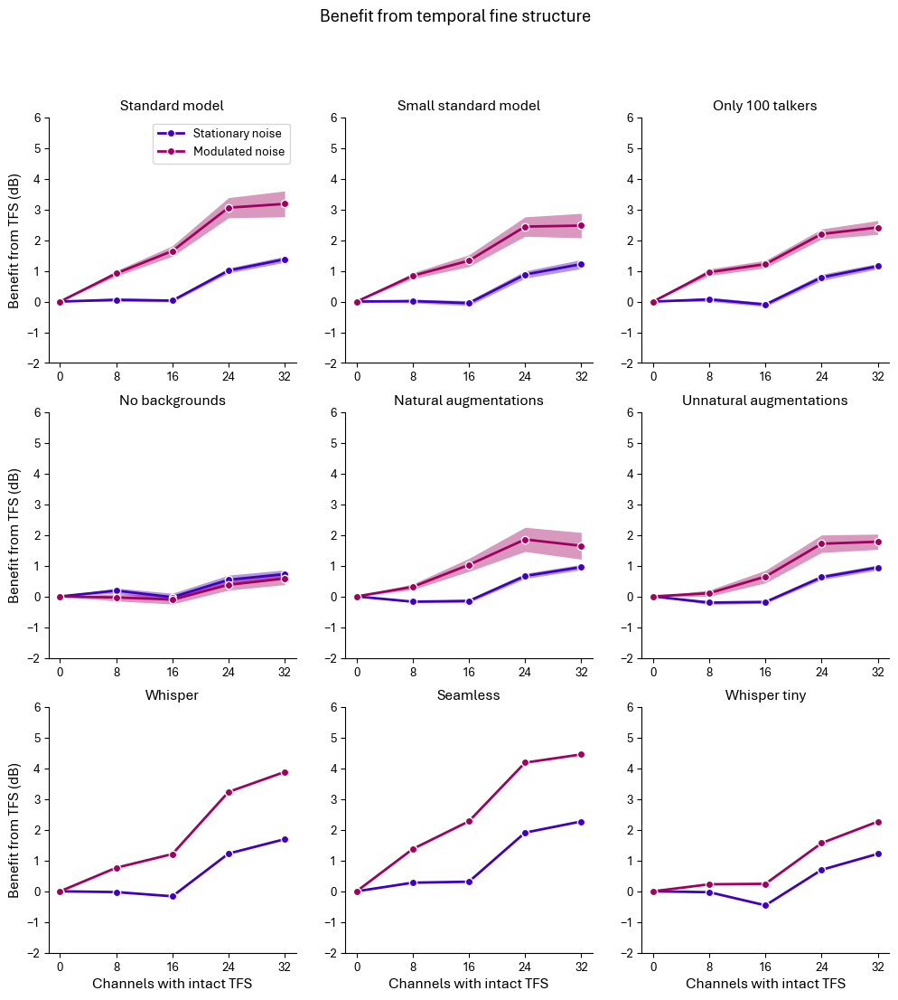

In [17]:
arch_plts = ['no_augs_800_words', 'no_augs_small_800_words', '100_talkers_800_words',
         'no_bgs_800_words', 'add_augs_800_words', 'extreme_augs_800_words', 'whisper', 'seamless', 'whisper_tiny'] 
names = ['Standard model', 'Small standard model', 'Only 100 talkers', 'No backgrounds', 
         'Natural augmentations', 'Unnatural augmentations', 'Whisper', 'Seamless', 'Whisper tiny']
xticks = [0, 8, 16, 24, 32]
plt.figure(figsize=(12, 12))
for j, arch in enumerate(arch_plts):
    plt.subplot(331+j)
    for i, tp, tp_name in zip([2, 5], ['stat', 'mod'], ['Stationary noise', 'Modulated noise']):
        model_m = {}
        model_se = {}
        model_results = np.load(f'{dir_dst}/{tp}_benefits/{arch}.npy')
        model_m[arch] = np.mean(model_results, axis=1)
        model_se[arch] = np.std(model_results, axis=1) 

        x = np.arange(len(xticks))
        plt.fill_between(x, model_m[arch]+model_se[arch], model_m[arch]-model_se[arch], color=[i*32/255,0,1-i*32/255], lw=0, alpha=0.4)
        plt.plot(x, model_m[arch], 'o-', color=[i*32/255,0,1-i*32/255], mec='white', lw=2, label=f'{tp_name}')
    plt.ylim(-2, 6)
    plt.xticks(x, xticks)
    if j == 0:
        plt.legend()
    if j % 3 == 0:
        plt.ylabel('Benefit from TFS (dB)', {'fontsize': 12})
    if j >= 6:
        plt.xlabel('Channels with intact TFS', {'fontsize': 12})
    plt.title(names[j])
    prettifyAxes(plt.gca())
    
plt.suptitle('Benefit from temporal fine structure', fontsize=14)
plt.show()

In [13]:
popt, pcov

(array([ 0.84972401, -3.81103867,  4.91173784]),
 array([[6.77341428e-05, 6.93811115e-04, 7.83722584e-04],
        [6.93811115e-04, 2.41201524e-02, 8.01953122e-03],
        [7.83722584e-04, 8.01953122e-03, 4.31399076e-02]]))

In [20]:
avg_val = fcn_to_fit(srt, *popt)

In [18]:
scipy.stats.norm(popt[1], popt[2]).ppf(0.4248646754606757/popt[0])

-3.8109999999999995

In [21]:
stat_0 = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/stat_0/no_augs_800_words.npy')
mean = np.mean(stat_0, axis=1)[4]
benefits = []
for cutoff in [0, 8, 16, 24, 32]:
    stat = np.load(f'/om2/user/amagaro/word_recognition_project/full_results_230/stat_{cutoff}/no_augs_800_words.npy')
    benefit = np.mean(stat, axis=1)[4] - mean
    benefits.append(benefit)

In [27]:
mod_0 = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/mod_0/no_augs_800_words.npy')
mean = np.mean(mod_0, axis=1)[4]
mod_benefits = []
for cutoff in [0, 8, 16, 24, 32]:
    mod = np.load(f'/om2/user/amagaro/word_recognition_project/full_results_230/mod_{cutoff}/no_augs_800_words.npy')
    benefit = np.mean(mod, axis=1)[4] - mean
    mod_benefits.append(benefit)

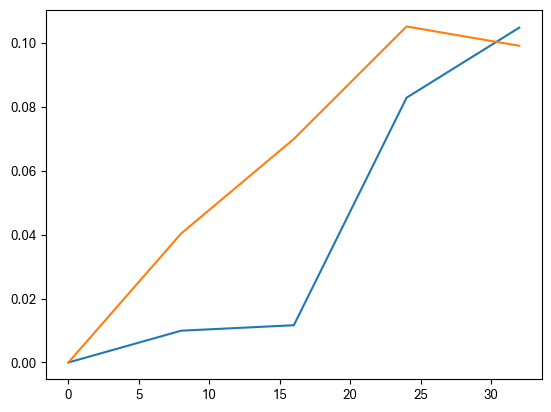

In [28]:
plt.plot([0, 8, 16, 24, 32], benefits)
plt.plot([0, 8, 16, 24, 32], mod_benefits)
plt.show()

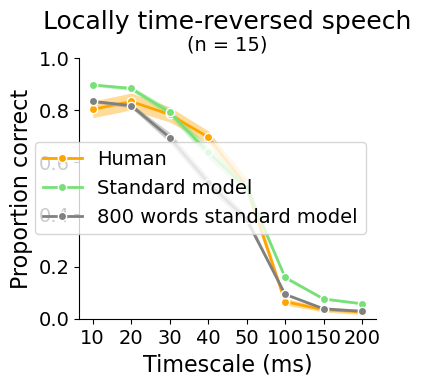

In [20]:
plt.figure(figsize=(4, 4))
plt.subplot(111)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=True, model_indices=inds)
plt.tight_layout()

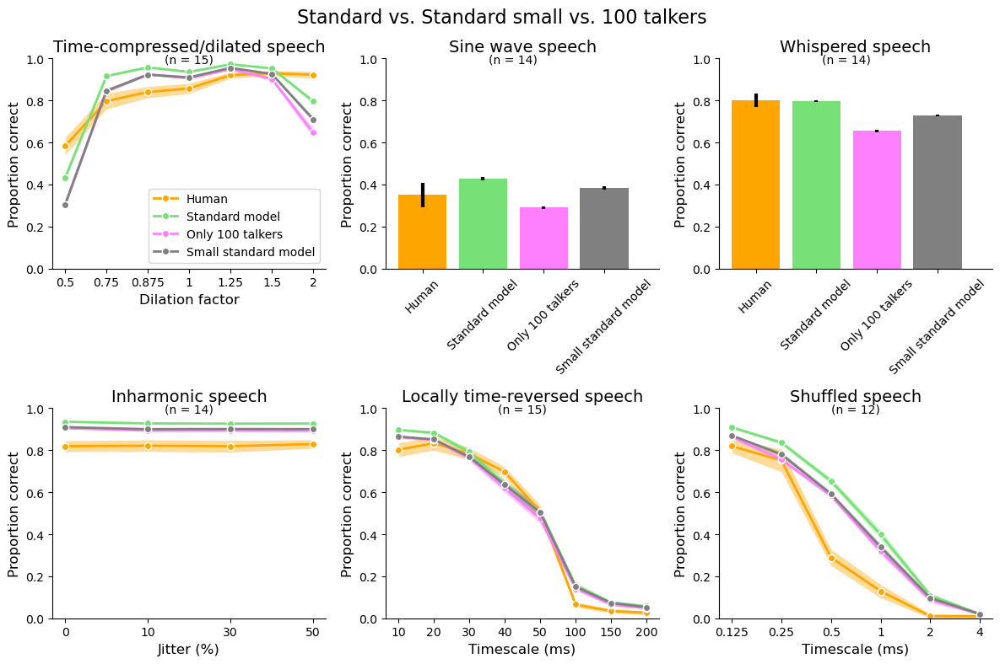

In [16]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plot_human_model_results('compressed_dilated', [0.5, 0.75, 0.875, 1, 1.25, 1.5, 2], 'Dilation factor',
                         'Time-compressed/dilated speech', model_indices=[0, 3, 8], legend=True)
plt.subplot(232)
plot_human_model_results_bar('sine_wave_speech',
                         'Sine wave speech', model_indices=[0, 3, 8], legend=True)
plt.subplot(233)
plot_human_model_results_bar('whispered',
                         'Whispered speech', model_indices=[0, 3, 8], legend=True)
plt.subplot(234)
plot_human_model_results('inharmonic', [0, 10, 30, 50], 'Jitter (%)', 
                             'Inharmonic speech', legend=False, model_indices=[0, 3, 8]) 
plt.subplot(235)
plot_human_model_results('cognitive_restoration', [10, 20, 30, 40, 50, 100, 150, 200], 'Timescale (ms)', 
                             'Locally time-reversed speech', legend=False, model_indices=[0, 3, 8])
plt.subplot(236)
plot_human_model_results('shuffled', [1/8, 1/4, 1/2, 1, 2, 4], 'Timescale (ms)', 
                             'Shuffled speech', legend=False, model_indices=[0, 3, 8])
plt.suptitle('Standard vs. Standard small vs. 100 talkers', fontsize=16)
plt.tight_layout()

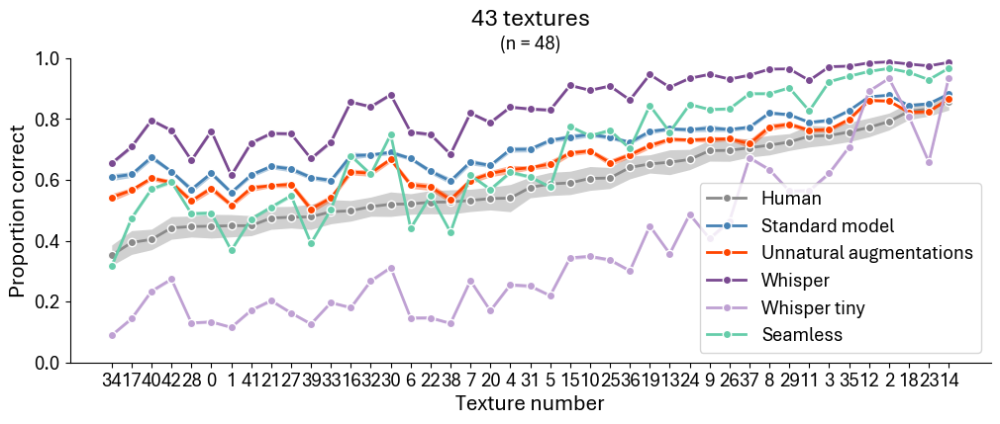

In [66]:
order = np.load('/om2/user/amagaro/human_experiment/43_textures_order.npy')
plt.figure(figsize=(12,4))
plot_human_model_results('43_textures', order, 'Texture number', 
                             '43 textures', legend=True, model_indices=[0, 5, 7, 11, 12])

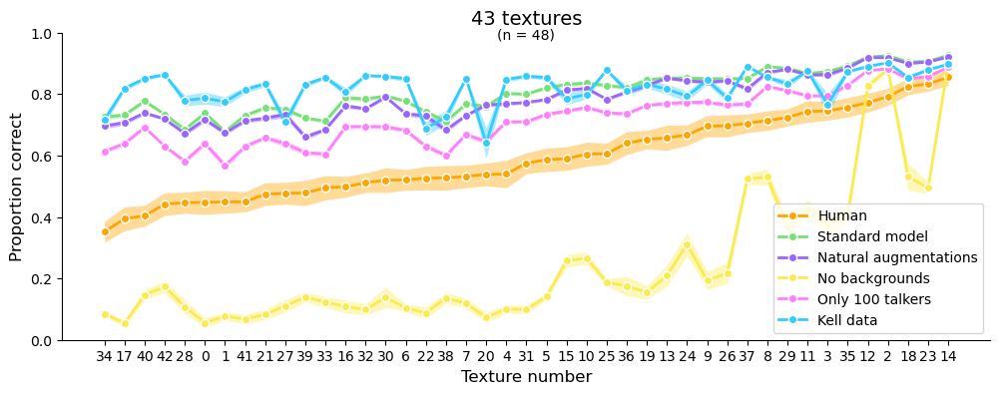

In [11]:
order = np.load('/om2/user/amagaro/human_experiment/43_textures_order.npy')
plt.figure(figsize=(12,4))
plot_human_model_results('43_textures', order, 'Texture number', 
                             '43 textures', legend=True, model_indices=[0,1,2,3,4])

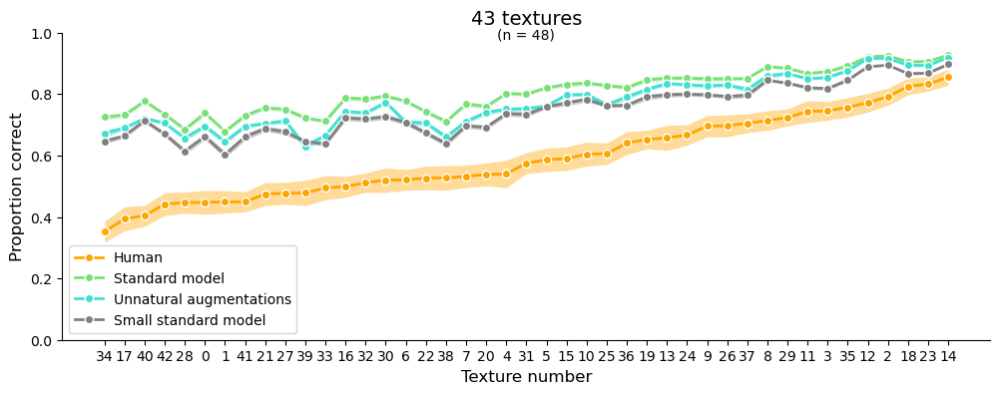

In [12]:
order = np.load('/om2/user/amagaro/human_experiment/43_textures_order.npy')
plt.figure(figsize=(12,4))
plot_human_model_results('43_textures', order, 'Texture number', 
                             '43 textures', legend=True, model_indices=[0,5,8])

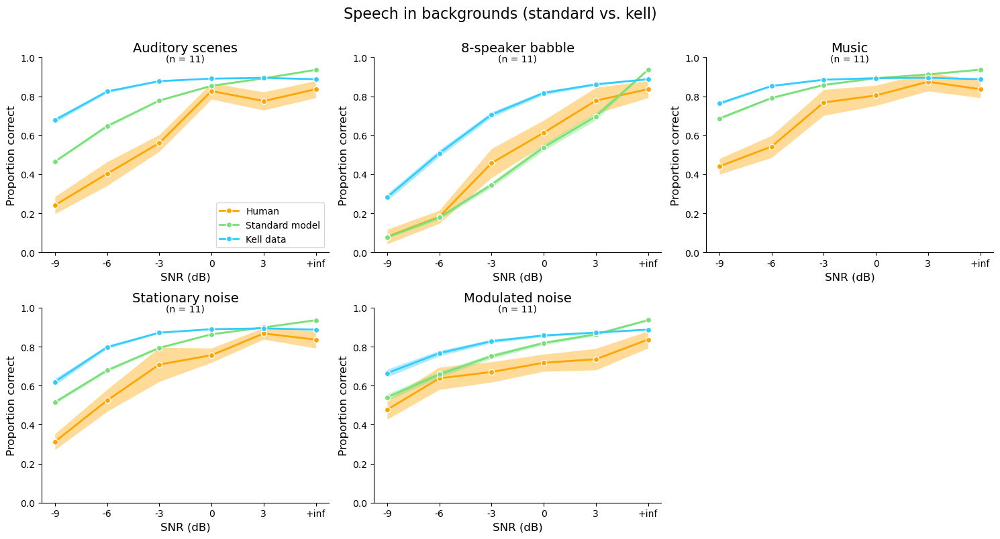

In [7]:
plt.figure(figsize=(15, 8))
plt.subplot(231)
plot_human_model_results('audscene', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Auditory scenes', model_indices=[0, 4], legend=True)
plt.subplot(232)
plot_human_model_results('babble', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         '8-speaker babble', model_indices=[0, 4], legend=False)
plt.subplot(233)
plot_human_model_results('music', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Music', model_indices=[0, 4], legend=False)
plt.subplot(234)
plot_human_model_results('stat_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Stationary noise', model_indices=[0, 4], legend=False)
plt.subplot(235)
plot_human_model_results('mod_noise', [-9, -6, -3, 0, 3, '+inf'], 'SNR (dB)',
                         'Modulated noise', model_indices=[0, 4], legend=False)
plt.suptitle('Speech in backgrounds (standard vs. kell)', fontsize=16, y=1)
plt.tight_layout()

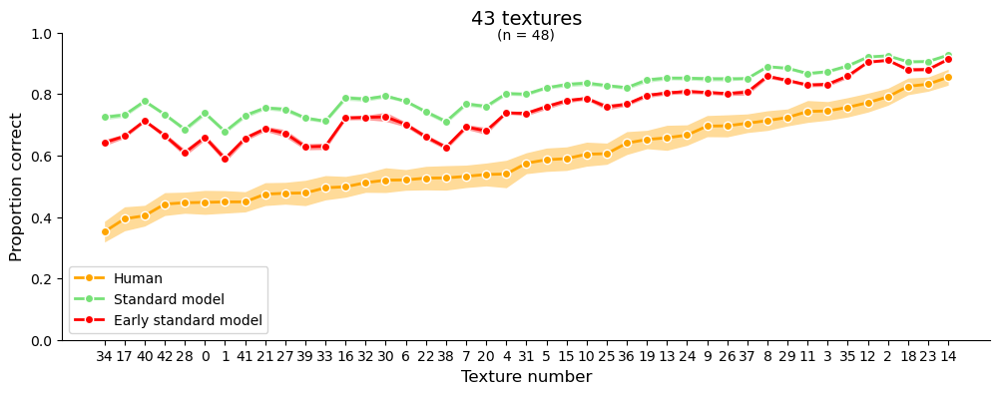

In [7]:
order = np.load('/om2/user/amagaro/human_experiment/43_textures_order.npy')
plt.figure(figsize=(12,4))
plot_human_model_results('43_textures', order, 'Texture number', 
                             '43 textures', legend=True, model_indices=[0,9])

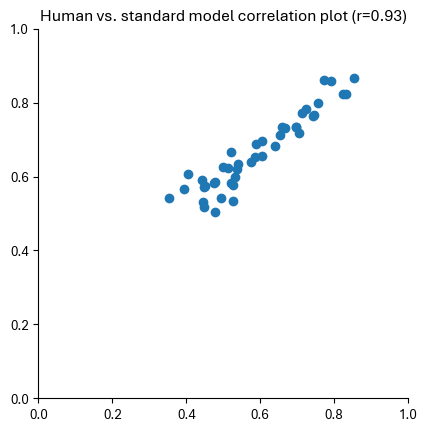

PearsonRResult(statistic=0.9420235408960602, pvalue=4.714574821557292e-21)

In [48]:
import scipy.stats
human = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/43_textures/human.npy')
model = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/43_textures/extreme_augs_800_words.npy')
fig = plt.figure()
ax = fig.add_subplot()
plt.scatter(np.nanmean(human, axis=1), np.nanmean(model, axis=1))
plt.ylim(0,1)
plt.xlim(0,1)
plt.title('Human vs. standard model correlation plot (r=0.93)')
ax.set_aspect('equal')
prettifyAxes(plt.gca())
plt.show()
scipy.stats.pearsonr(np.nanmean(human, axis=1), np.nanmean(model, axis=1))

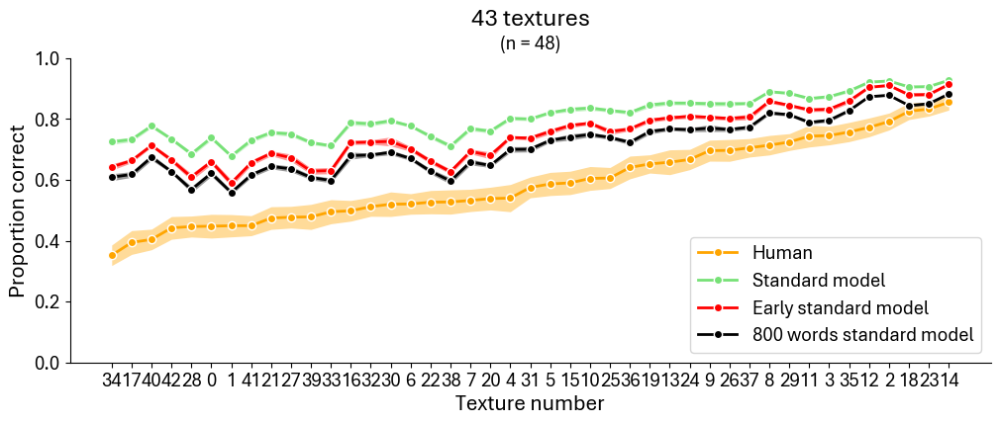

In [29]:
order = np.load('/om2/user/amagaro/human_experiment/43_textures_order.npy')
plt.figure(figsize=(12,4))
plot_human_model_results('43_textures', order, 'Texture number', 
                             '43 textures', legend=True, model_indices=[0, 9, 10])

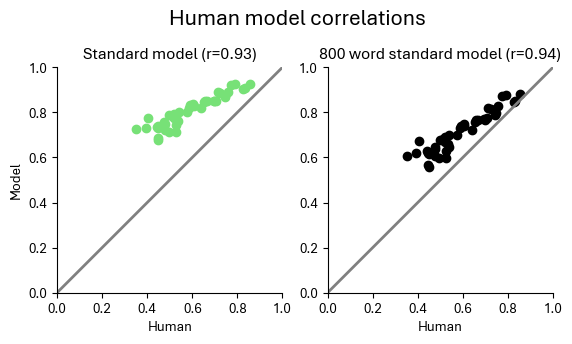

In [28]:
import scipy.stats
text_plot_inds = [0, 5, 7, 11, 12]
human = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/43_textures/human.npy')
model = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/43_textures/no_augs.npy')
model_800 = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/43_textures/no_augs_800_words.npy')
fig = plt.figure()
for i, model in enumerate(text_plot_inds):
    ax = fig.add_subplot(231 + i)
    model = np.load('/om2/user/amagaro/word_recognition_project/full_results_230/43_textures/.npy')
    plt.scatter(np.nanmean(human, axis=1), np.nanmean(model, axis=1), color=colors['no_augs'])
    plt.plot([0,1], [0,1], '-', lw=2, color='gray')
    plt.ylim(0,1)
    plt.xlim(0,1)
    plt.title(f'Standard model (r={scipy.stats.pearsonr(np.nanmean(human, axis=1), np.nanmean(model, axis=1))})')
    plt.ylabel('Model')
    plt.xlabel('Human')
    ax.set_aspect('equal')
    prettifyAxes(plt.gca())
# scipy.stats.pearsonr(np.nanmean(human, axis=1), np.nanmean(model, axis=1))
ax = fig.add_subplot(122)
plt.scatter(np.nanmean(human, axis=1), np.nanmean(model_800, axis=1), color=colors['no_augs_800_words'])
plt.plot([0,1], [0,1], '-', lw=2, color='gray')
plt.ylim(0,1)
plt.xlim(0,1)
plt.title('800 word standard model (r=0.94)')
plt.xlabel('Human')
ax.set_aspect('equal')
plt.suptitle('Human model correlations', fontsize=16, y=0.85)
prettifyAxes(plt.gca())
plt.show()
# scipy.stats.pearsonr(np.nanmean(human, axis=1), np.nanmean(model_800, axis=1))

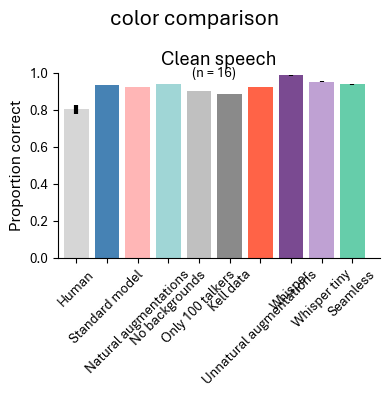

In [11]:
plt.figure(figsize=(4, 4))
plt.subplot(111)
plot_human_model_results_bar('clean', 'Clean speech', model_indices=[0, 1, 2, 3, 4, 5, 7, 11, 12])
plt.suptitle('color comparison', fontsize=16)
plt.tight_layout()

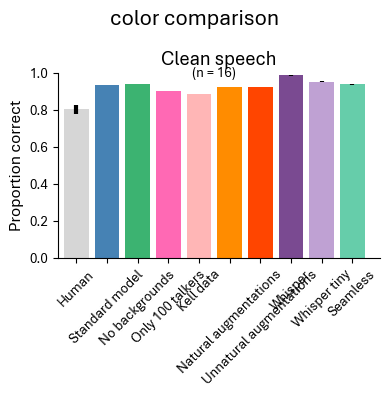

In [18]:
plt.figure(figsize=(4, 4))
plt.subplot(111)
plot_human_model_results_bar('clean', 'Clean speech', model_indices=[0, 2, 3, 4, 1, 5, 7, 11, 12])
plt.suptitle('color comparison', fontsize=16)
plt.tight_layout()

In [17]:
colors = {"human": [el/255. for el in (214, 214, 214)],
          "no_augs": [el/255. for el in (70, 130, 180)], # 0
          "add_augs": [el/255. for el in (255, 140, 0)], # 1
          "extreme_augs_new": [el/255. for el in (255, 69, 0)],#(255, 99, 71)], # 5
          "kell_data": [el/255. for el in (255, 182, 182)], #(138, 138, 138)], # 4
          "100_talkers": [el/255. for el in (255, 105, 180)], #(0, 191, 255)], #(192, 192, 192)], # 3
          "no_bgs": [el/255. for el in (60, 179, 113)], #(160, 214, 214)], # 2
          "whisper": [el/255. for el in (122, 74, 145)], # 7
          "whisper_tiny": [el/255. for el in (191, 161, 211)], # 11
          "seamless": [el/255. for el in (102, 205, 170)], # 12
         }